# DSC 305 Final Project: Portfolio Maximization





**Muchiri Kahwai**<br>
**DSC 305 S23**<br>
**Final Project:Portfolio Maximization**

## <u><b> Problem Statement </u> </b>
As the newly appointed hedge fund manager of Ikigai Capital Management, your primary responsibility is to oversee the allocation of the company's financial resources towards profitable investments. Specifically, you have been given the task of determining how best to allocate $1,000,000 towards a set of pre-determined stocks across various sectors. Your objective is to maximize the potential return on investment while minimizing the associated risk, thereby ensuring that the company's resources are utilized in the most optimal manner possible.
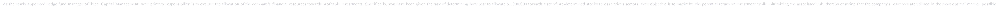

## Import Libraries

In [2]:
import pandas_datareader.data as web
import datetime
import yfinance as yf
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from scipy.optimize import minimize
from scipy.spatial.distance import squareform
from scipy.optimize import minimize
import tensorflow

## <u>Importing the Dataset </u>

In [3]:
import yfinance as yf
import pandas as pd

# Set start and end dates for data
start_date = '2018-01-01'
end_date = '2023-01-01'

# List of 30 selected stocks
tickers = ["AAPL", "MSFT", "AMZN", "GOOGL", "NFLX", "WMT", "COST", "KR", "TGT", "HD", "LMT", "BA", "NOC", "JPM", "BAC", "HSBC", "V", "MA", "AXP", "PYPL", "CRM", "ORCL", "IBM", "INTC", "NVDA", "AMD", "PFE", "JNJ", "DELL", "RTX"]

# Print the list of tickers with their corresponding number
for i, ticker in enumerate(tickers):
    print(f"{i+1}. {ticker}")

# Create an empty dictionary to store the data for each stock
stock_data = {}

# Loop over each ticker and download the historical data
for ticker in tickers:
    data = yf.download(ticker, start=start_date, end=end_date)['Adj Close']
    stock_data[ticker] = data

# Combine the data for all stocks into a single dataframe
stock_prices = pd.DataFrame(stock_data)

# Reset the index so the date is a column
stock_prices.reset_index(inplace=True)

# Write the dataframe to a csv file
stock_prices.to_csv('stock_prices.csv', index=False)

# Print a few rows of the dataframe
print(stock_prices.iloc[:10, :6].to_string(index=False))



1. AAPL
2. MSFT
3. AMZN
4. GOOGL
5. NFLX
6. WMT
7. COST
8. KR
9. TGT
10. HD
11. LMT
12. BA
13. NOC
14. JPM
15. BAC
16. HSBC
17. V
18. MA
19. AXP
20. PYPL
21. CRM
22. ORCL
23. IBM
24. INTC
25. NVDA
26. AMD
27. PFE
28. JNJ
29. DELL
30. RTX
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[**

## <b><u>Interpretation </b></u>
To achieve our goal, we first retrieved data from yfinance, a Python library that provides easy access to historical stock price data from Yahoo Finance. Then we set the start and end dates for our historical data. In this case, we set the start date to January 1st, 2018 and the end date to January 1st, 2023. Then we created a list of 30 selected stocks that we want to include in our portfolio. We then created an empty dictionary called stock_data to store the historical data for each stock. We loop over each stock ticker in the tickers list and download the historical data for that stock using the yf.download() function from the yfinance library We stored the historical data for each stock in the stock_data dictionary. After downloading the historical data for all of the stocks, we combined the data for all stocks into a single dataframe using the pd.DataFrame() function. This dataframe contains the adjusted closing prices of all the selected stocks for each trading day from January 1, 2018 to January 1, 2023. Finally, we print a few rows of the dataframe using the iloc method to verify that the data has been downloaded and combined correctly

# <b><h> Exploratory Data Analysis </b></h>

In [4]:
# Check the data types of each column
print(stock_prices.dtypes)

Date     datetime64[ns]
AAPL            float64
MSFT            float64
AMZN            float64
GOOGL           float64
NFLX            float64
WMT             float64
COST            float64
KR              float64
TGT             float64
HD              float64
LMT             float64
BA              float64
NOC             float64
JPM             float64
BAC             float64
HSBC            float64
V               float64
MA              float64
AXP             float64
PYPL            float64
CRM             float64
ORCL            float64
IBM             float64
INTC            float64
NVDA            float64
AMD             float64
PFE             float64
JNJ             float64
DELL            float64
RTX             float64
dtype: object


The data types are mostly floats which is expected for stock prices as they are usually represented as numerical values and the date column

In [5]:
# Get the stock names by excluding the 'Date' column
stock_names = stock_prices.columns[1:]

# Print the number of stock names
print(len(stock_names))

# Print the stock names
print(stock_names)


30
Index(['AAPL', 'MSFT', 'AMZN', 'GOOGL', 'NFLX', 'WMT', 'COST', 'KR', 'TGT',
       'HD', 'LMT', 'BA', 'NOC', 'JPM', 'BAC', 'HSBC', 'V', 'MA', 'AXP',
       'PYPL', 'CRM', 'ORCL', 'IBM', 'INTC', 'NVDA', 'AMD', 'PFE', 'JNJ',
       'DELL', 'RTX'],
      dtype='object')


This means that there are 30 stocks in our list.

In [6]:
# Check for missing values
print(stock_prices.isna().sum())

Date     0
AAPL     0
MSFT     0
AMZN     0
GOOGL    0
NFLX     0
WMT      0
COST     0
KR       0
TGT      0
HD       0
LMT      0
BA       0
NOC      0
JPM      0
BAC      0
HSBC     0
V        0
MA       0
AXP      0
PYPL     0
CRM      0
ORCL     0
IBM      0
INTC     0
NVDA     0
AMD      0
PFE      0
JNJ      0
DELL     0
RTX      0
dtype: int64


There are no missing values for this dataset

In [7]:
# Load the dataset
df = pd.read_csv('stock_prices.csv')

# Print the shape of the dataset
print(f"The dataset has {df.shape[0]} rows and {df.shape[1]} columns")


The dataset has 1259 rows and 31 columns


In [8]:
stock_prices.iloc[:, 1:].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    1259 non-null   float64
 1   MSFT    1259 non-null   float64
 2   AMZN    1259 non-null   float64
 3   GOOGL   1259 non-null   float64
 4   NFLX    1259 non-null   float64
 5   WMT     1259 non-null   float64
 6   COST    1259 non-null   float64
 7   KR      1259 non-null   float64
 8   TGT     1259 non-null   float64
 9   HD      1259 non-null   float64
 10  LMT     1259 non-null   float64
 11  BA      1259 non-null   float64
 12  NOC     1259 non-null   float64
 13  JPM     1259 non-null   float64
 14  BAC     1259 non-null   float64
 15  HSBC    1259 non-null   float64
 16  V       1259 non-null   float64
 17  MA      1259 non-null   float64
 18  AXP     1259 non-null   float64
 19  PYPL    1259 non-null   float64
 20  CRM     1259 non-null   float64
 21  ORCL    1259 non-null   float64
 22  

In [9]:
# Generate descriptive statistics
stats = stock_prices.describe()

# Select all rows and columns starting from the second column
stats = stats.iloc[:, 1:]

# Style the table with background color
styled_stats = stats.style.background_gradient()

# Display the styled table
display(styled_stats)


,AAPL,MSFT,AMZN,GOOGL,NFLX,WMT,COST,KR,TGT,HD,LMT,BA,NOC,JPM,BAC,HSBC,V,MA,AXP,PYPL,CRM,ORCL,IBM,INTC,NVDA,AMD,PFE,JNJ,DELL,RTX
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000
mean,96.534503,189.659049,119.812384,85.710697,387.752430,116.628306,335.924346,32.825749,134.297059,241.596539,343.128773,255.614525,340.867609,113.262720,30.742417,29.858287,181.046493,287.035279,123.391945,140.169412,182.501437,60.256547,112.400435,45.531039,116.000201,60.976442,36.504454,140.430051,33.728257,76.698311
min,34.209969,79.855164,59.450500,49.233501,166.369995,75.526970,166.099487,19.127316,55.370712,141.950409,219.051239,95.010002,211.285919,71.486000,16.880363,16.016603,109.752914,147.381775,65.868286,67.550003,104.029999,37.729904,76.900185,24.309347,31.531855,9.530000,23.970980,102.753578,14.044520,43.712326
25%,49.364510,114.804684,88.930500,58.738998,298.550003,94.717510,227.520805,25.314939,75.992516,180.041473,302.463638,179.474998,291.191528,94.525700,25.889057,25.781896,150.793373,229.779793,96.717121,86.709999,148.200005,48.414022,105.058823,41.690840,55.643293,27.810000,31.080111,122.020969,24.705789,69.530739
50%,89.964935,196.884552,107.783501,73.955498,361.809998,119.769463,306.156525,30.483032,117.720726,235.431351,342.102386,233.630005,324.461517,105.795296,28.367674,30.472231,189.885345,301.742645,114.674278,107.540001,163.509995,53.388126,110.450180,45.670292,95.875580,56.180000,33.926033,137.048386,29.961967,75.784393
75%,141.754272,252.490135,158.086998,112.673748,494.455002,136.603394,448.622192,40.250006,179.885010,297.109772,366.835266,337.769852,360.338257,129.651451,35.700253,33.899529,208.641121,342.753723,151.978920,191.590004,220.299995,74.342075,121.472660,50.765194,161.280891,87.864998,41.891689,160.220970,44.105745,85.619049
max,180.434296,339.075531,186.570496,149.838501,691.690002,156.764145,602.616150,60.084560,257.500854,403.047729,493.125275,430.299957,545.204041,164.015747,47.945427,42.439503,247.302536,393.699036,194.931168,308.529999,309.959991,101.078369,146.742050,63.348789,333.350769,161.910004,58.154457,181.108810,58.327915,102.573303
std,46.540072,75.346564,35.592042,30.737565,119.378060,22.284715,119.467817,9.565115,59.986235,64.542081,54.191146,83.465575,71.389118,22.730920,6.773824,5.661313,34.868554,65.862794,30.215131,68.571320,46.991258,15.226464,11.748144,7.514910,72.938519,36.791053,7.539744,20.957746,11.246559,11.802807


## <b><u>Interpretation </b></u>

-  The average stock price of the 30 companies varies widely, with a range from 30.26 (HSBC) to 387.75 (Netflix).
- The range of stock prices for each company indicates how much the company's stock price has changed over the time period covered by the dataset. For example, Apple's stock price ranged from a low of 34.26 to a high of 180.68, which indicates that the stock has grown significantly over time.
- The lowest minimum closing price was recorded for AMD at 9.53, while the highest maximum closing price was recorded for Netflix (NFLX) at 691.69.
- The average closing price of all stocks in the list was 137.08. This can be used as a benchmark to compare the performance of individual stocks to the broader market.
- We have had 1259 trading days over that 5 year time period. That averages to around 251 trading days in a year. 
- Stocks with higher standard deviations, such as Netflix (std: 119.38), Google (std: 30.74), and Nvidia (std: 36.79) had more volatile prices over the period.  In contrast, companies with lower standard deviations, such as HSBC (std: 5.74), Kroger (std: 9.62), and IBM (std: 11.91) had less volatile prices over the period. 
- The median can help us identify skewness in the stock price distribution. For example, for Microsoft (MSFT), the mean is 189.66, and the median is 196.88.The mean is less than the median indicating a left skewness. 
- A higher IQR  suggests a greater distribution in stock prices. Amazon's IQR is (158.09 - 88.93) = 69.16, suggesting a wider range of prices compared to IBM, with an IQR of (123.13 - 106.49) = 16.64.
- Netflix (NFLX) had the highest average price (387.75) and the highest standard deviation (119.38), which indicates that the stock had significant price movements during the period.
- NVIDIA (NVDA) experienced substantial growth during the time period, with its stock price ranging from a low of 9.53 to a high of 161.91.
- Companies such as HSBC, Kroger, and IBM have relatively low standard deviations, which suggests that their stock prices are less likely to fluctuate wildly. This makes them more stable investments than companies with higher standard deviations.
- Companies with a  huge difference between their maximum and minimum prices like Amazon, Google and Visa might have been affected by adverse market conditions.


In [10]:
from prettytable import PrettyTable

categories = {
    "Technology/Hardware": ["AAPL", "INTC", "NVDA", "AMD", "DELL"],
    "Retail": ["WMT", "COST", "KR", "TGT", "HD"],
    "Defense": ["LMT", "BA", "NOC", "RTX"],
    "Finance": ["JPM", "BAC", "HSBC", "V", "MA", "AXP", "PYPL"],
    "Technology/Software": ["MSFT", "GOOGL", "AMZN", "ORCL", "IBM", "CRM", "NFLX",],
    "Healthcare": ["PFE", "JNJ"],

}




for category, tickers in categories.items():
    print(f"\n{category}")
    table = PrettyTable()
    table.field_names = ["Statistic", *tickers]
    table.add_row(["count", *[f"{count:.2f}" for count in stock_prices[tickers].count().values]])
    table.add_row(["mean", *[f"{mean:.2f}" for mean in stock_prices[tickers].mean().values]])
    table.add_row(["std", *[f"{std:.2f}" for std in stock_prices[tickers].std().values]])
    table.add_row(["min", *[f"{min:.2f}" for min in stock_prices[tickers].min().values]])
    table.add_row(["25%", *[f"{q:.2f}" for q in stock_prices[tickers].quantile(0.25).values]])
    table.add_row(["50%", *[f"{q:.2f}" for q in stock_prices[tickers].quantile(0.5).values]])
    table.add_row(["75%", *[f"{q:.2f}" for q in stock_prices[tickers].quantile(0.75).values]])
    table.add_row(["max", *[f"{max:.2f}" for max in stock_prices[tickers].max().values]])
    print(table)



Technology/Hardware
+-----------+---------+---------+---------+---------+---------+
| Statistic |   AAPL  |   INTC  |   NVDA  |   AMD   |   DELL  |
+-----------+---------+---------+---------+---------+---------+
|   count   | 1259.00 | 1259.00 | 1259.00 | 1259.00 | 1259.00 |
|    mean   |  96.53  |  45.53  |  116.00 |  60.98  |  33.73  |
|    std    |  46.54  |   7.51  |  72.94  |  36.79  |  11.25  |
|    min    |  34.21  |  24.31  |  31.53  |   9.53  |  14.04  |
|    25%    |  49.36  |  41.69  |  55.64  |  27.81  |  24.71  |
|    50%    |  89.96  |  45.67  |  95.88  |  56.18  |  29.96  |
|    75%    |  141.75 |  50.77  |  161.28 |  87.86  |  44.11  |
|    max    |  180.43 |  63.35  |  333.35 |  161.91 |  58.33  |
+-----------+---------+---------+---------+---------+---------+

Retail
+-----------+---------+---------+---------+---------+---------+
| Statistic |   WMT   |   COST  |    KR   |   TGT   |    HD   |
+-----------+---------+---------+---------+---------+---------+
|   count  

## <b><u>Interpretation </b></u>

#### 1. Technology/Software Services Sector:

- Microsoft had the highest average stock price (189.66) in this sector, with significant growth as shown by the difference between its minimum (79.86) and maximum (339.08) prices. 
- IBM had the lowest standard deviation (11.91) within this sector, indicating that it has been a relatively stable stock with less price volatility. 
- Netflix experienced a substantial increase in stock price, ranging from 166.37 to 691.69, indicating strong growth during this period.

#### 2. Technology/Hardware Sector : 

- NVIDIA showed high growth in this time period with the stock growing from 31.53 to 333.35.
- Even though Advanced Micro Devices had the lowest price of 9.53 it grew to 161.91 showing a high growth potential. 

#### 3. Retail sector : 

- Walmart and Target both have low standard deviations indicating a consistent perfomance. 
- Kroger has the lowest mean score in the sector indictating that it could be an undervalued stock. 

#### 4. Defense sector : 

- The mean stock prices of Lockheed Martin and Northrop Grumman are very similar. 
- Boeing has the highest standard deviation in the sector showing that the sector has  a high price volatility during this period. 

#### 5. Finance Sector : 

- Mastercard had the highest average stock price (287.04) in this sector, with a wide range between its minimum (147.38) and maximum (393.70) prices.
- HSBC had the lowest average stock price (30.26) and a relatively low standard deviation (5.74), indicating that it has been a more stable stock with less price volatility.


#### 6. Healthcare Sector:

- Johnson & Johnson has a higher average stock price (140.43) than Pfizer at 36.90, but both stocks have shown consistent performance with relatively low price volatility (20.96 and 7.62, respectively).


#### 7. Inter-sector analysis

- The Defense sector has the highest average stock price across all the sectors, with companies such as Lockheed Martin  and Northrop Grumman having high mean prices.
- The healthcare sector has a lower average stock price than other sectors, which could be an opportunity for investors looking for undervalued stocks or more stable returns.
- The technology/software sector has a strong growth potential, as evidenced by the significant increases in stock prices of companies like Microsoft and Netflix over the past few years.
- Companies in the technology/hardware category like NVIDIA and AMD show a high degree of volatility. 
- The finance sector has both high and low volatile companies. Mastercard and American Express are high volatile companies whereas HSBC are low volatile companies. 


# Technical Analysis

In this section,  I am going to analyse the data of the stock using commonly used financial technical methods. 

## Calculating  and visualizing moving average

The moving average shows the price data of the stocks in the given time period, in our case a month. We see whether the price was increasing or decreasing during that time period

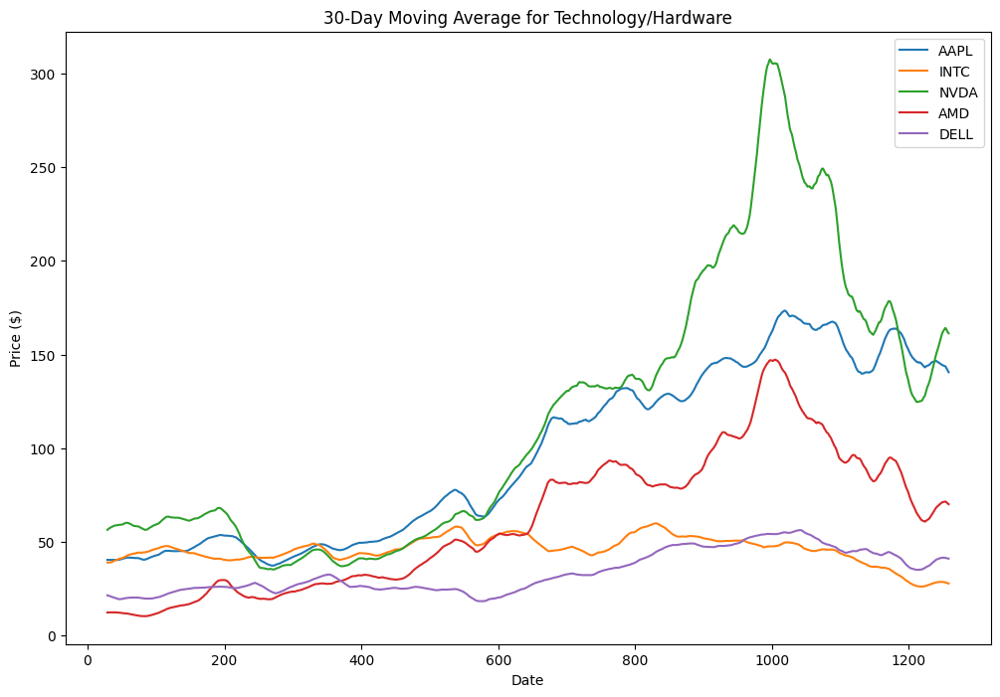

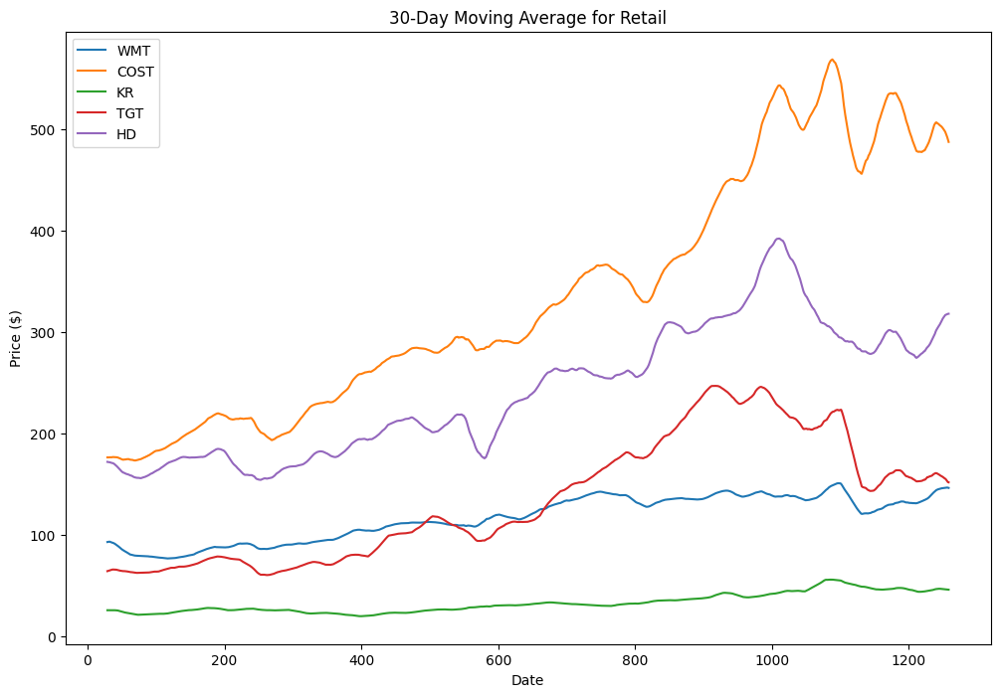

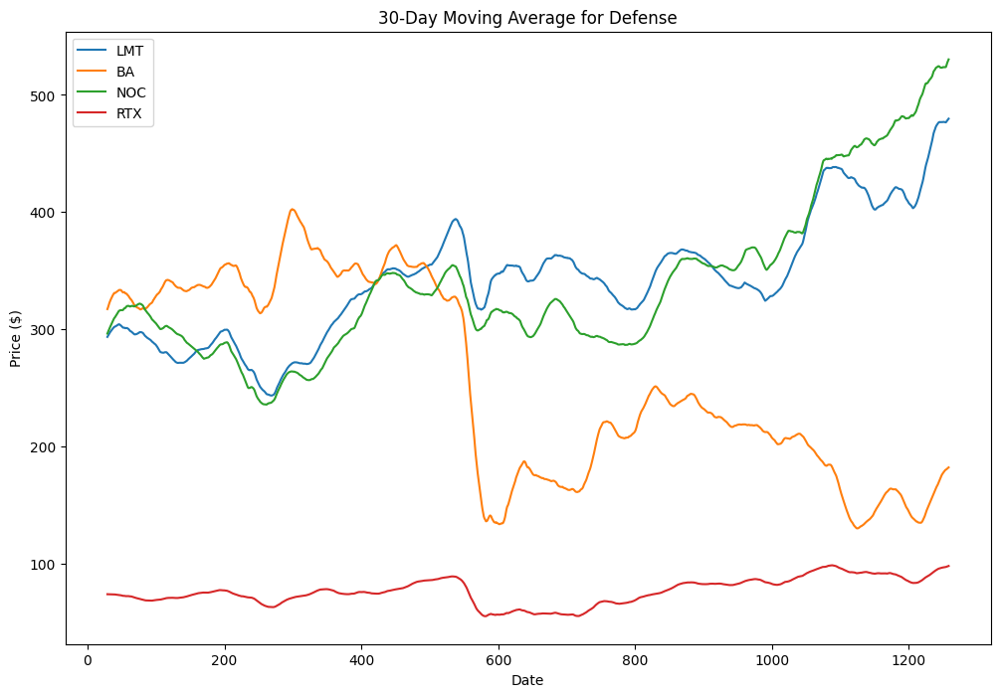

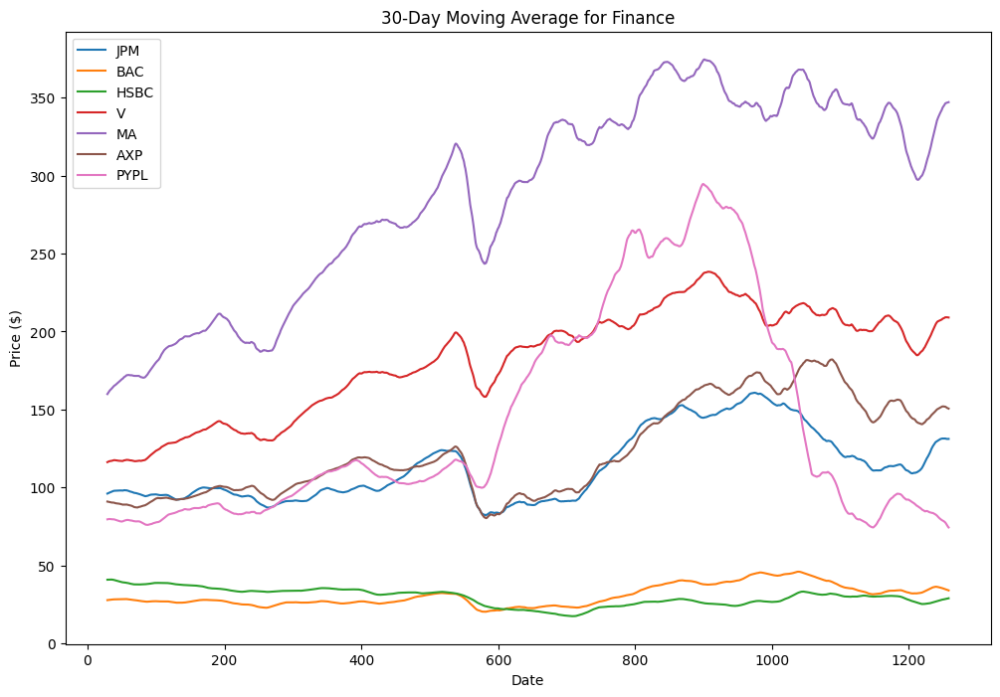

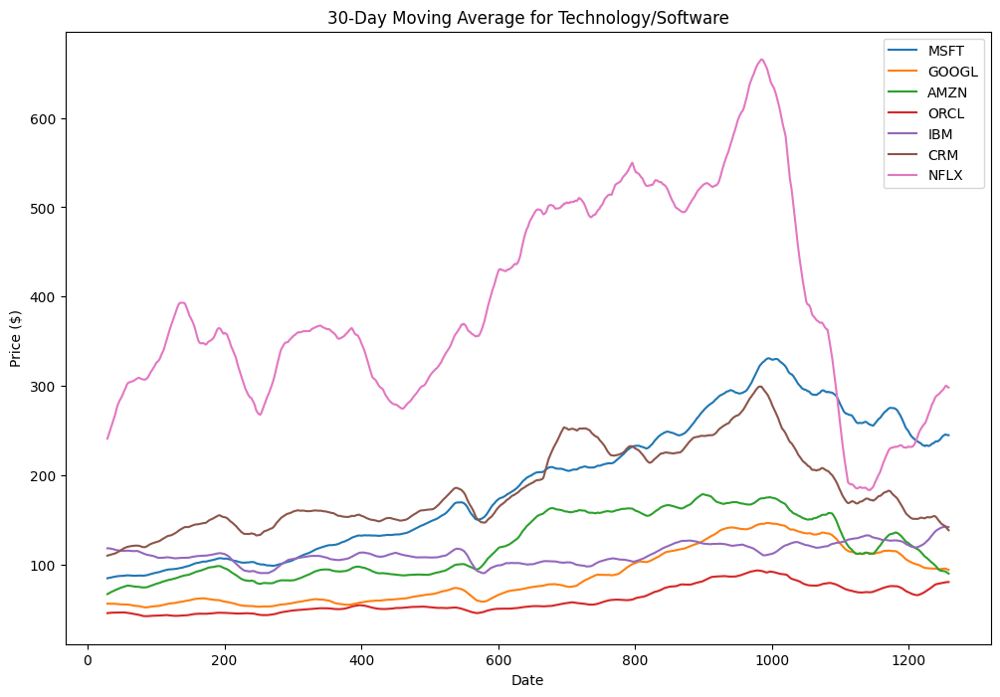

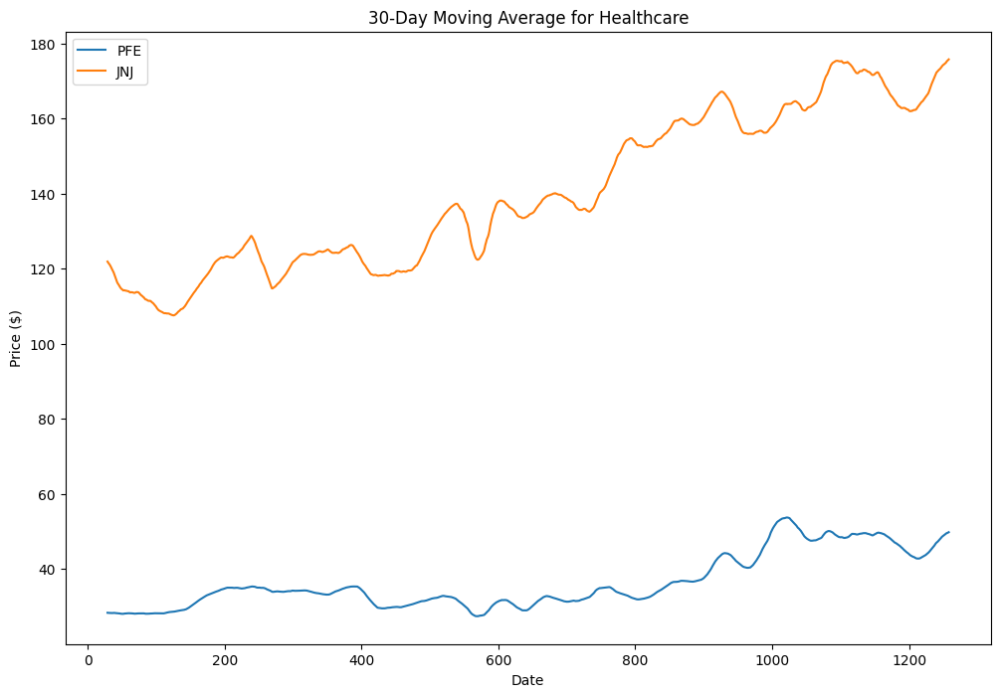

In [11]:
# Define the categories of interest
categories = {
    "Technology/Hardware": ["AAPL", "INTC", "NVDA", "AMD", "DELL"],
    "Retail": ["WMT", "COST", "KR", "TGT", "HD"],
    "Defense": ["LMT", "BA", "NOC", "RTX"],
    "Finance": ["JPM", "BAC", "HSBC", "V", "MA", "AXP", "PYPL"],
    "Technology/Software": ["MSFT", "GOOGL", "AMZN", "ORCL", "IBM", "CRM", "NFLX",],
    "Healthcare": ["PFE", "JNJ"],

}



# Calculate the 30-day moving average for each category
moving_avgs = {}
for category, tickers in categories.items():
    moving_avgs[category] = stock_prices.loc[:, tickers].rolling(window=30).mean()

# Plot the moving average for each stock in each category
for category, tickers in categories.items():
    plt.figure(figsize=(12, 8))
    for ticker in tickers:
        plt.plot(stock_prices.index, moving_avgs[category][ticker], label=ticker)
    plt.legend()
    plt.title(f"30-Day Moving Average for {category}")
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.show()




## Calculating and visualizing the 30 day rolling standard deviation

A rolling standard deviation is a statstical measure that shows the dispersion of the price of our stock over a 30 day period. 

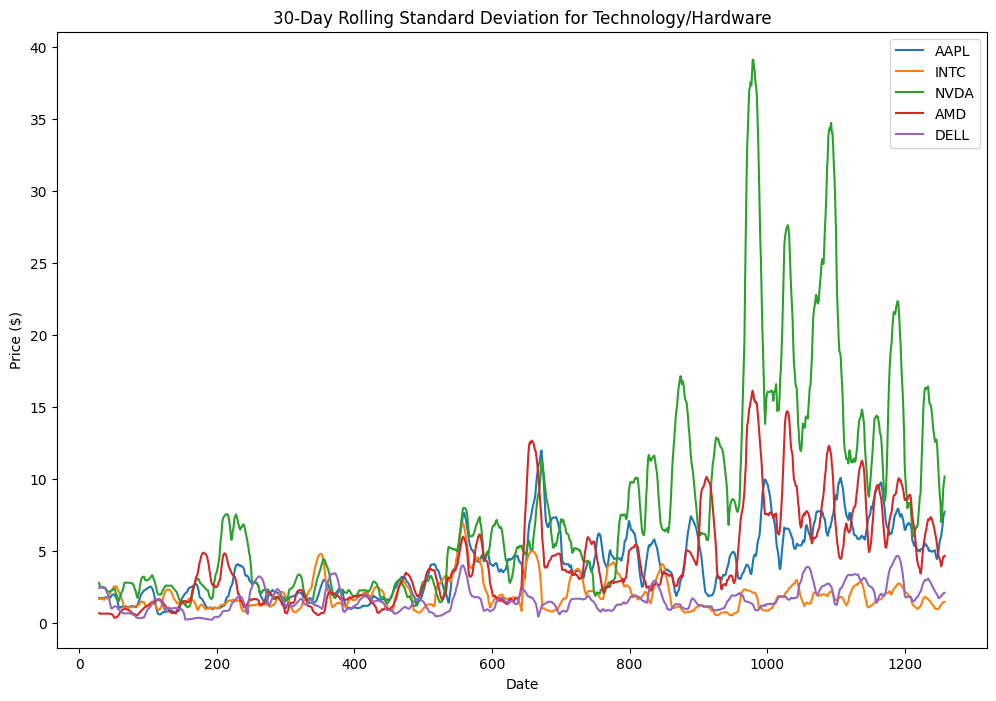

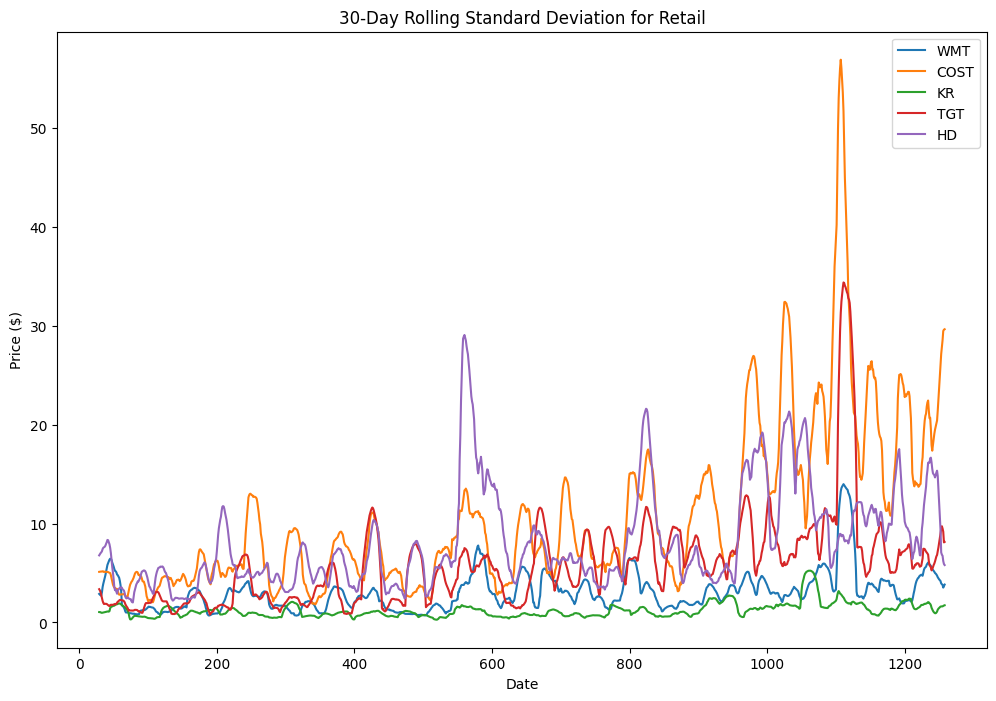

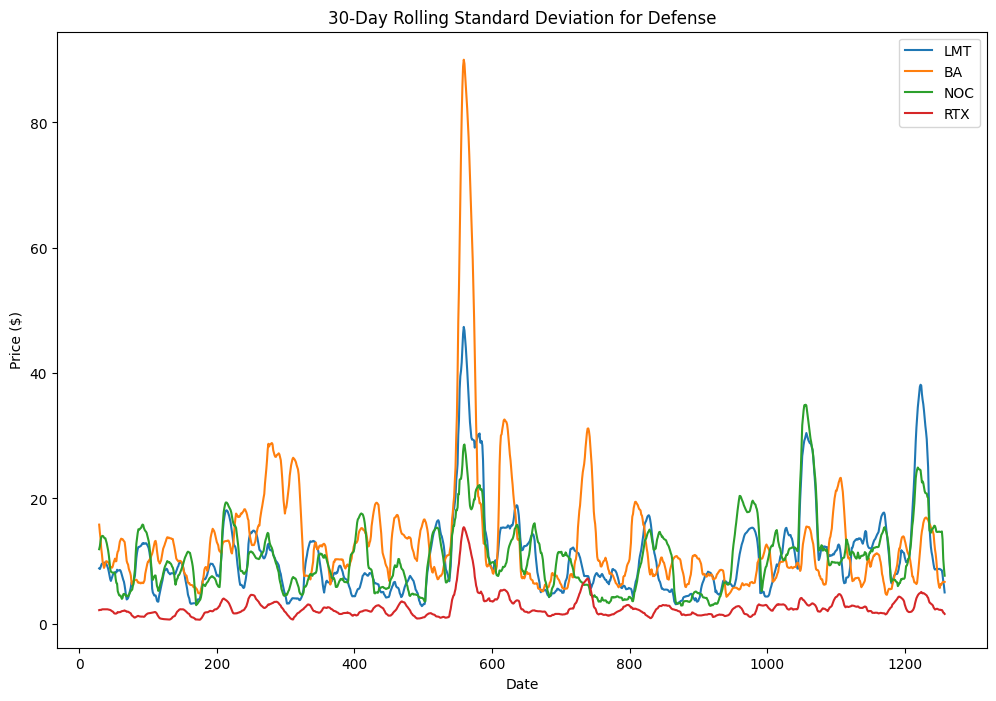

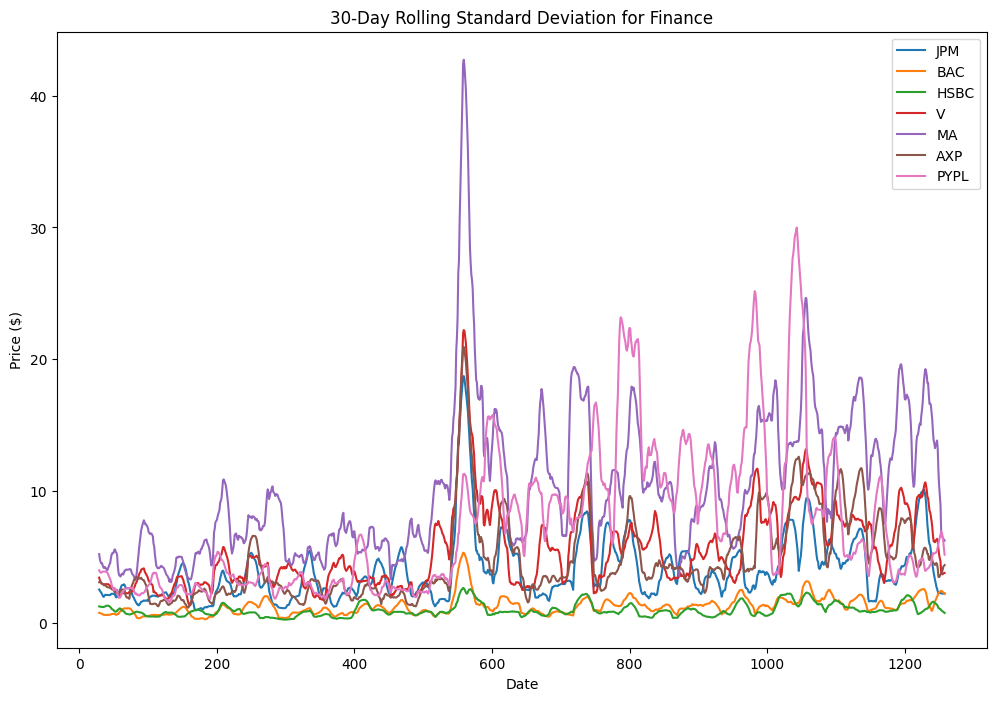

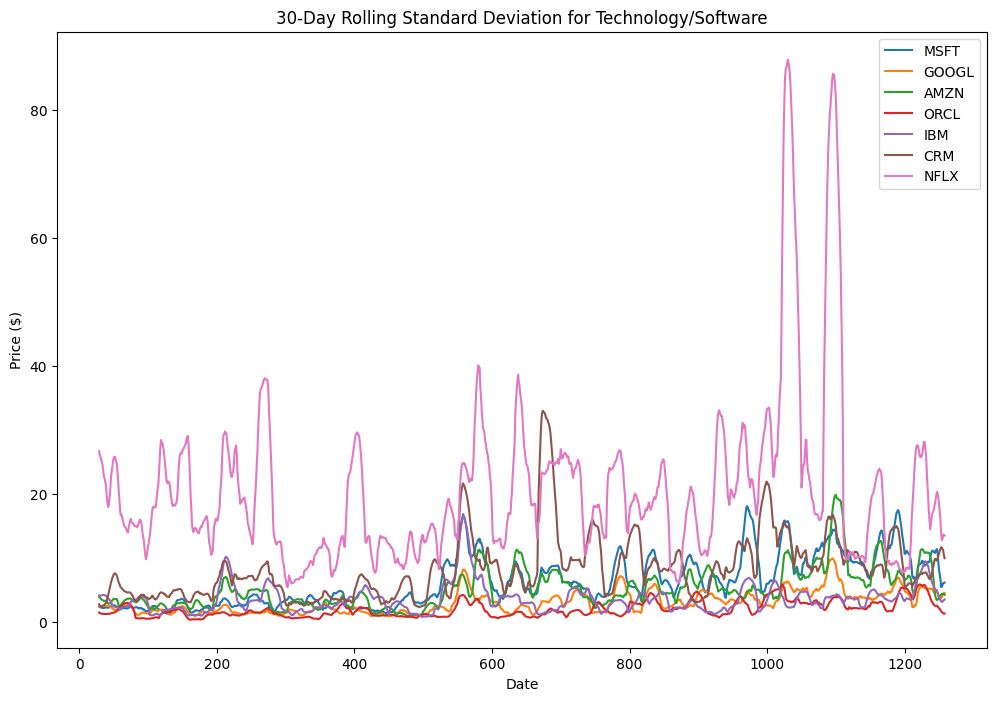

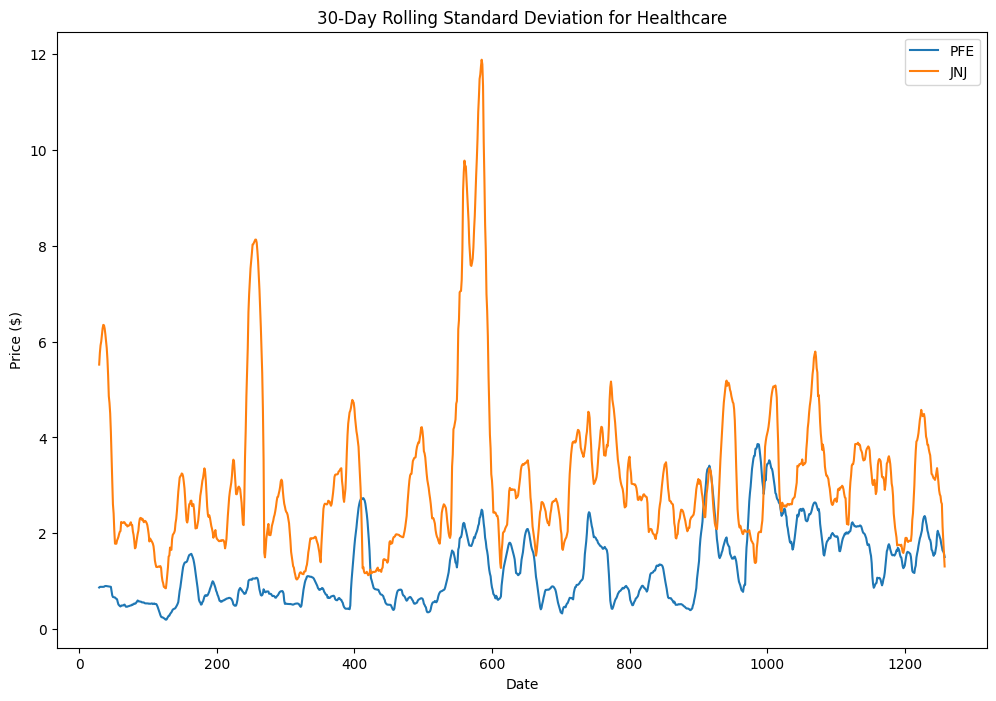

In [12]:

# Calculate the 30-day rolling standard deviation for each category
rolling_std = {}
for category, tickers in categories.items():
    rolling_std[category] = stock_prices.loc[:, tickers].rolling(window=30).std()

# Plot the rolling standard deviation for each stock in each category
for category, tickers in categories.items():
    plt.figure(figsize=(12, 8))
    for ticker in tickers:
        plt.plot(stock_prices.index, rolling_std[category][ticker], label=ticker)
    plt.legend()
    plt.title(f"30-Day Rolling Standard Deviation for {category}")
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.show()



# Calculating and visualizing mean daily returns

Mean daily return is the average change in value or percentage return of an investment on a daily basis. It is calculated by adding up the daily returns of an investment over a specific period and dividing the sum by the number of trading days in that period. Mean daily returns provide an indication of the average performance or profitability of an investment on a daily basis, allowing investors to assess the potential gains or losses they can expect over time.

In [13]:
from tabulate import tabulate

# Create a dictionary to store the mean daily returns for each stock
mean_daily_returns = {}

# Calculate mean daily returns for each stock in each sector
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change()
    returns = returns.dropna()

    for ticker in tickers:
        mean_daily_returns[ticker] = returns[ticker].mean() * 100

# Create a DataFrame from the mean_daily_returns dictionary
mean_daily_returns_df = pd.DataFrame(list(mean_daily_returns.items()), columns=['Ticker', 'Mean Daily Return'])

# Sort the DataFrame by the mean daily returns in descending order
sorted_mean_daily_returns_df = mean_daily_returns_df.sort_values(by='Mean Daily Return', ascending=False)

# Reset the index of the sorted DataFrame
sorted_mean_daily_returns_df.reset_index(drop=True, inplace=True)

# Round the values in the DataFrame to 5 decimal places
rounded_mean_daily_returns_df = sorted_mean_daily_returns_df.round(5)

# Display the rounded DataFrame as a formatted table
print(tabulate(rounded_mean_daily_returns_df, headers='keys', tablefmt='pretty'))


+----+--------+-------------------+
|    | Ticker | Mean Daily Return |
+----+--------+-------------------+
| 0  |  AMD   |      0.20478      |
| 1  |  NVDA  |      0.1401       |
| 2  |  AAPL  |      0.11407      |
| 3  |  MSFT  |      0.10549      |
| 4  |  TGT   |      0.09635      |
| 5  |   MA   |      0.08979      |
| 6  |  COST  |      0.08762      |
| 7  |  NFLX  |      0.07728      |
| 8  |  DELL  |      0.07631      |
| 9  |  NOC   |      0.0691       |
| 10 |  ORCL  |      0.06874      |
| 11 |   HD   |      0.06725      |
| 12 |   V    |      0.0671       |
| 13 |  AXP   |      0.06506      |
| 14 |   KR   |      0.06425      |
| 15 |  PFE   |      0.05936      |
| 16 | GOOGL  |      0.05911      |
| 17 |  LMT   |      0.05866      |
| 18 |  AMZN  |      0.05291      |
| 19 |  JPM   |      0.04912      |
| 20 |  CRM   |      0.04911      |
| 21 |  RTX   |      0.04896      |
| 22 |  WMT   |      0.04713      |
| 23 |  BAC   |      0.0417       |
| 24 |  JNJ   |      0.0381 

## <b> Interpretation

- The stocks with the highest mean daily returns are AMD (0.20478), NVDA (0.1401), and AAPL (0.11407). These stocks have shown relatively higher average returns compared to others in the portfolio.
-  INTC (-0.00575) and HSBC (-0.00744) have negative mean daily returns, indicating that, on average, they have experienced losses
- The technology sector has a history of strong mean daily returns. This is evident in the performance of stocks in the technology/hardware category (including AMD, NVDA, and AAPL) and the technology/software category (including MSFT, GOOGL, and AMZN). These stocks have consistently outperformed other sectors.
- The retail sector is represented by stocks like Target (TGT), Costco (COST), Kroger (KR), Walmart (WMT), and Home Depot (HD). While their mean daily returns are lower than the top performers in the technology sector, they still generate positive returns.This suggests that retail stocks can be a profitable investment, even if they do not offer the same level of growth potential as technology stocks. Retail stocks are typically less volatile than technology stocks, which makes them a good option for investors who are looking for a more conservative investment.
- The finance sector is represented by stocks like JPMorgan Chase, Bank of America, HSBC, Visa, Mastercard, American Express, and PayPal. While their mean daily returns are lower than the top performers in other sectors, they still generate positive returns.This suggests that finance stocks can be a profitable investment, even if they do not offer the same level of growth potential as other sectors. Finance stocks are typically less volatile than other sectors, which makes them a good option for investors who are looking for a more conservative investment.
- The mean daily returns range from positive values like 0.20478 (AMD) to negative values like -0.00744 (HSBC).

+----+--------+-------------------+----------+
|    | Ticker | Mean Daily Return | Category |
+----+--------+-------------------+----------+
| 0  |  AMD   |      0.20478      |   High   |
| 1  |  NVDA  |      0.1401       |   High   |
| 2  |  AAPL  |      0.11407      |   High   |
| 3  |  MSFT  |      0.10549      |   High   |
| 4  |  TGT   |      0.09635      |   High   |
| 5  |   MA   |      0.08979      |   High   |
| 6  |  COST  |      0.08762      |   High   |
| 7  |  NFLX  |      0.07728      |  Medium  |
| 8  |  DELL  |      0.07631      |  Medium  |
| 9  |  NOC   |      0.0691       |  Medium  |
| 10 |  ORCL  |      0.06874      |  Medium  |
| 11 |   HD   |      0.06725      |  Medium  |
| 12 |   V    |      0.0671       |  Medium  |
| 13 |  AXP   |      0.06506      |  Medium  |
| 14 |   KR   |      0.06425      |  Medium  |
| 15 |  PFE   |      0.05936      |  Medium  |
| 16 | GOOGL  |      0.05911      |  Medium  |
| 17 |  LMT   |      0.05866      |  Medium  |
| 18 |  AMZN 

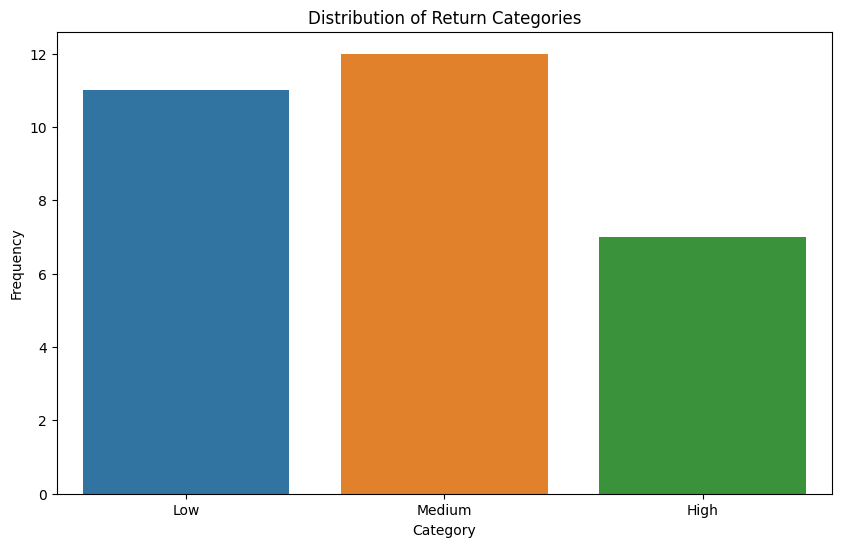

In [14]:
import matplotlib.pyplot as plt
def categorize_returns(return_value):
    if return_value >= 0.08:  # Adjust this value to change the threshold for 'High'
        return 'High'
    elif return_value >= 0.05:  # Adjust this value to change the threshold for 'Medium'
        return 'Medium'
    else:
        return 'Low'


# Apply the categorize_returns function to the 'Mean Daily Return' column
rounded_mean_daily_returns_df['Category'] = rounded_mean_daily_returns_df['Mean Daily Return'].apply(categorize_returns)

# Display the updated DataFrame as a formatted table
print(tabulate(rounded_mean_daily_returns_df, headers='keys', tablefmt='pretty'))

plt.figure(figsize=(10, 6)) 
sns.countplot(x='Category', data=rounded_mean_daily_returns_df, order=['Low', 'Medium', 'High'])
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.title('Distribution of Return Categories')
plt.show()


## <b><u>Interpretation </b></u>
- This table displays the stocks along with their mean daily returns and their respective categories based on the return values. The stocks are grouped into three categories: High, Medium, and Low returns. 
- The high return category is dominated by technology companies, such as AMD, NVDA, AAPL, and MSFT. Suggesting that the technology sector has been performing well. 
- The low return category includes a mix of sectors.Interestingly some large technology companies, such as IBM and INTC, have lower returns. This may be due to company-specific issues or challenges faced in their respective market segments.
- The presence of financial institutions (JPM, BAC, HSBC) in the low return category could indicate that the financial sector has faced signicant challenges during the given period.


# Calculating and visualising mean monthly returns

Mean Monthly Returns:
+----+--------+---------------------+
|    | Ticker | Mean Monthly Return |
+----+--------+---------------------+
| 0  |  AMD   |       6.14353       |
| 1  |  NVDA  |       4.20289       |
| 2  |  AAPL  |       3.42216       |
| 3  |  MSFT  |       3.16471       |
| 4  |  TGT   |       2.89062       |
| 5  |   MA   |       2.69377       |
| 6  |  COST  |       2.6285        |
| 7  |  NFLX  |       2.31828       |
| 8  |  DELL  |       2.28916       |
| 9  |  NOC   |       2.07295       |
| 10 |  ORCL  |       2.06214       |
| 11 |   HD   |       2.01741       |
| 12 |   V    |       2.01302       |
| 13 |  AXP   |       1.95195       |
| 14 |   KR   |       1.9276        |
| 15 |  PFE   |       1.78066       |
| 16 | GOOGL  |       1.77322       |
| 17 |  LMT   |       1.7598        |
| 18 |  AMZN  |       1.58724       |
| 19 |  JPM   |       1.4736        |
| 20 |  CRM   |       1.47327       |
| 21 |  RTX   |       1.46883       |
| 22 |  WMT   |       1.4139

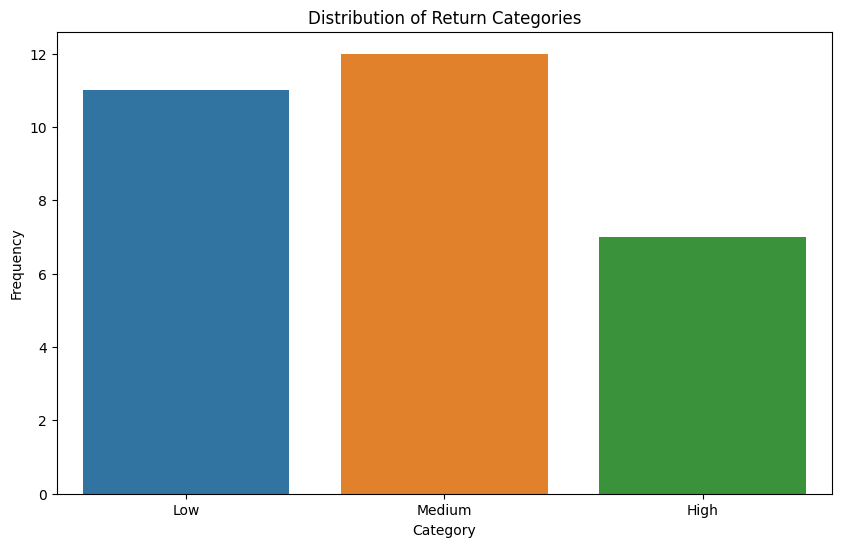

In [15]:
# Create a dictionary to store the mean monthly returns for each stock
mean_monthly_returns = {}

# Calculate mean monthly returns for each stock in each sector
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change()
    returns = returns.dropna()
    
    for ticker in tickers:
        mean_monthly_returns[ticker] = returns[ticker].mean() * 100 * 30  # Multiply by 30 for monthly returns

# Create a DataFrame from the mean monthly returns dictionary
mean_monthly_returns_df = pd.DataFrame(list(mean_monthly_returns.items()), columns=['Ticker', 'Mean Monthly Return'])

# Sort the DataFrame by the mean monthly returns in descending order
sorted_mean_monthly_returns_df = mean_monthly_returns_df.sort_values(by='Mean Monthly Return', ascending=False)

# Reset the index of the sorted DataFrame
sorted_mean_monthly_returns_df.reset_index(drop=True, inplace=True)

# Round the values in the DataFrame to 5 decimal places
rounded_mean_monthly_returns_df = sorted_mean_monthly_returns_df.round(5)

# Display the rounded DataFrame as a formatted table
print("Mean Monthly Returns:")
print(tabulate(rounded_mean_monthly_returns_df, headers='keys', tablefmt='pretty'))


plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
sns.countplot(x='Category', data=rounded_mean_daily_returns_df, order=['Low', 'Medium', 'High'])
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.title('Distribution of Return Categories')
plt.show()

# Calculating and visualizing mean annual returns


Mean Annual Returns:
+----+--------+--------------------+
|    | Ticker | Mean Annual Return |
+----+--------+--------------------+
| 0  |  AMD   |      51.60563      |
| 1  |  NVDA  |      35.30425      |
| 2  |  AAPL  |      28.74613      |
| 3  |  MSFT  |      26.58358      |
| 4  |  TGT   |      24.28123      |
| 5  |   MA   |      22.62766      |
| 6  |  COST  |      22.07937      |
| 7  |  NFLX  |      19.47351      |
| 8  |  DELL  |      19.2289       |
| 9  |  NOC   |      17.41278      |
| 10 |  ORCL  |      17.32199      |
| 11 |   HD   |      16.94626      |
| 12 |   V    |      16.90937      |
| 13 |  AXP   |      16.39634      |
| 14 |   KR   |      16.19183      |
| 15 |  PFE   |      14.95759      |
| 16 | GOOGL  |      14.89503      |
| 17 |  LMT   |      14.78235      |
| 18 |  AMZN  |      13.33282      |
| 19 |  JPM   |      12.37827      |
| 20 |  CRM   |      12.37545      |
| 21 |  RTX   |      12.33816      |
| 22 |  WMT   |      11.87707      |
| 23 |  BAC   | 

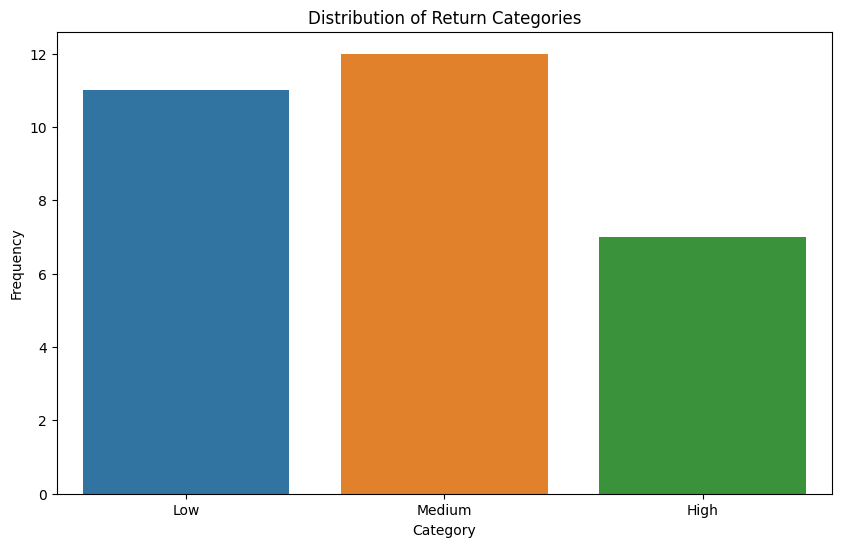

In [16]:
# Create a dictionary to store the mean annual returns for each stock
mean_annual_returns = {}

# Calculate mean annual returns for each stock in each sector
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change()
    returns = returns.dropna()
    
    for ticker in tickers:
        mean_annual_returns[ticker] = returns[ticker].mean() * 100 * 252  # Multiply by 252 for annual returns

# Create a DataFrame from the mean annual returns dictionary
mean_annual_returns_df = pd.DataFrame(list(mean_annual_returns.items()), columns=['Ticker', 'Mean Annual Return'])

# Sort the DataFrame by the mean annual returns in descending order
sorted_mean_annual_returns_df = mean_annual_returns_df.sort_values(by='Mean Annual Return', ascending=False)

# Reset the index of the sorted DataFrame
sorted_mean_annual_returns_df.reset_index(drop=True, inplace=True)

# Round the values in the DataFrame to 5 decimal places
rounded_mean_annual_returns_df = sorted_mean_annual_returns_df.round(5)

# Display the rounded DataFrame as a formatted table
print("\nMean Annual Returns:")
print(tabulate(rounded_mean_annual_returns_df, headers='keys', tablefmt='pretty'))

plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
sns.countplot(x='Category', data=rounded_mean_daily_returns_df, order=['Low', 'Medium', 'High'])
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.title('Distribution of Return Categories')
plt.show()

# Calculating and visualizing the mean annual returns across different sectors

+---+---------------------+--------------------+-------------------+
|   |       Sector        | Mean Annual Return | Percentage Return |
+---+---------------------+--------------------+-------------------+
| 0 | Technology/Hardware |       0.1059       |       10.59       |
| 1 |       Retail        |      0.07252       |       7.252       |
| 2 | Technology/Software |      0.06331       |       6.331       |
| 3 |       Defense       |      0.04917       |       4.917       |
| 4 |     Healthcare      |      0.04873       |       4.873       |
| 5 |       Finance       |      0.04856       |       4.856       |
+---+---------------------+--------------------+-------------------+


C:\Users\kahwa\AppData\Local\Temp\ipykernel_44984\3861352298.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Percentage Return', y='Sector', data=rounded_mean_annual_returns_df, ci=None)


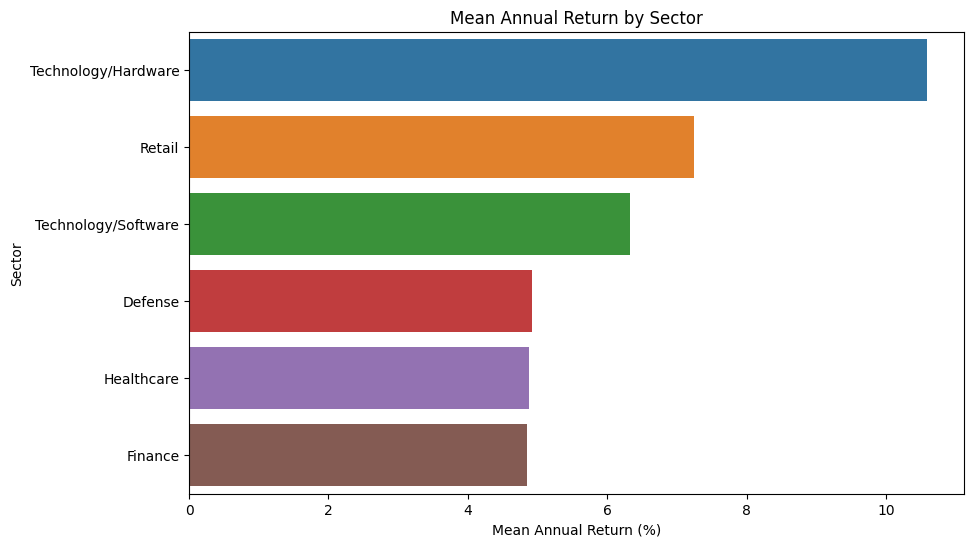

In [17]:
from tabulate import tabulate

# Create a dictionary to store the mean annual returns for each sector
mean_annual_returns = {}

# Calculate mean annual returns for each sector
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change()
    returns = returns.dropna()
    sector_return = returns.mean(axis=1) * 100
    mean_annual_returns[category] = sector_return.mean()

# Create a DataFrame from the mean_annual_returns dictionary
mean_annual_returns_df = pd.DataFrame(list(mean_annual_returns.items()), columns=['Sector', 'Mean Annual Return'])

# Sort the DataFrame by the mean annual returns in descending order
sorted_mean_annual_returns_df = mean_annual_returns_df.sort_values(by='Mean Annual Return', ascending=False)

# Reset the index of the sorted DataFrame
sorted_mean_annual_returns_df.reset_index(drop=True, inplace=True)

# Round the values in the DataFrame to 5 decimal places
rounded_mean_annual_returns_df = sorted_mean_annual_returns_df.round(5)

# Add a 'Percentage Return' column
rounded_mean_annual_returns_df['Percentage Return'] = rounded_mean_annual_returns_df['Mean Annual Return'] * 100

# Display the rounded DataFrame as a formatted table
print(tabulate(rounded_mean_annual_returns_df, headers='keys', tablefmt='pretty'))


# Plot the data
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.barplot(x='Percentage Return', y='Sector', data=rounded_mean_annual_returns_df, ci=None)
plt.xlabel('Mean Annual Return (%)')
plt.ylabel('Sector')
plt.title('Mean Annual Return by Sector')
plt.show()




## <b><u>Interpretation </b></u>

-  The companies in the Technology/ Hardware sector have the highest return in the five years that we analysed. The sector had a return of 10% which is double the returns of the lowest ranked categories i.e Defense, Healthcare and Finance. 

- The lowest ranked categories i.e Defense, Healthcare and Finance have very similar returns in the five years that we analysed. 

# Visualizing the distribution of mean daily returns

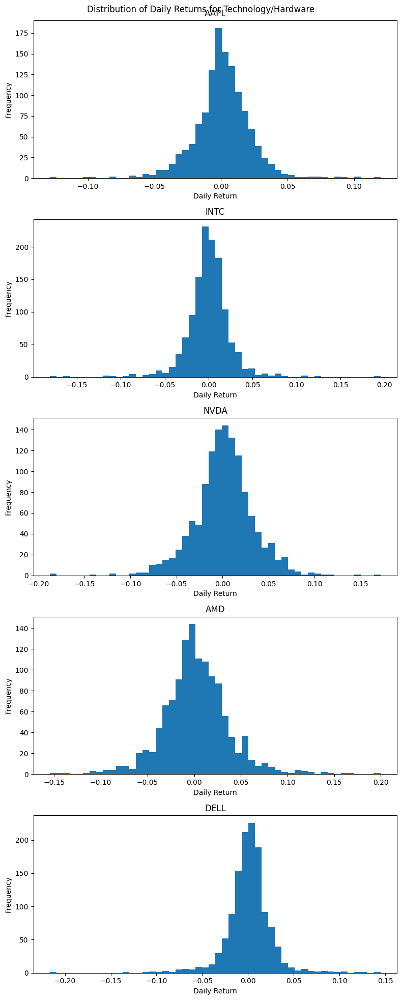

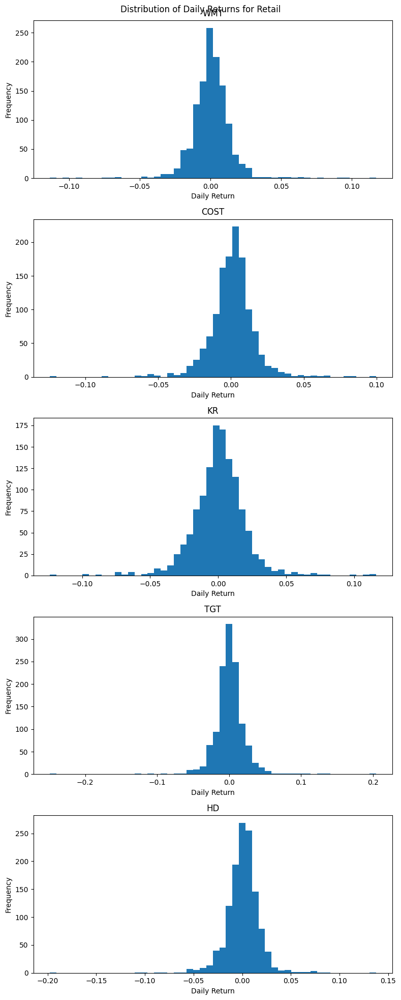

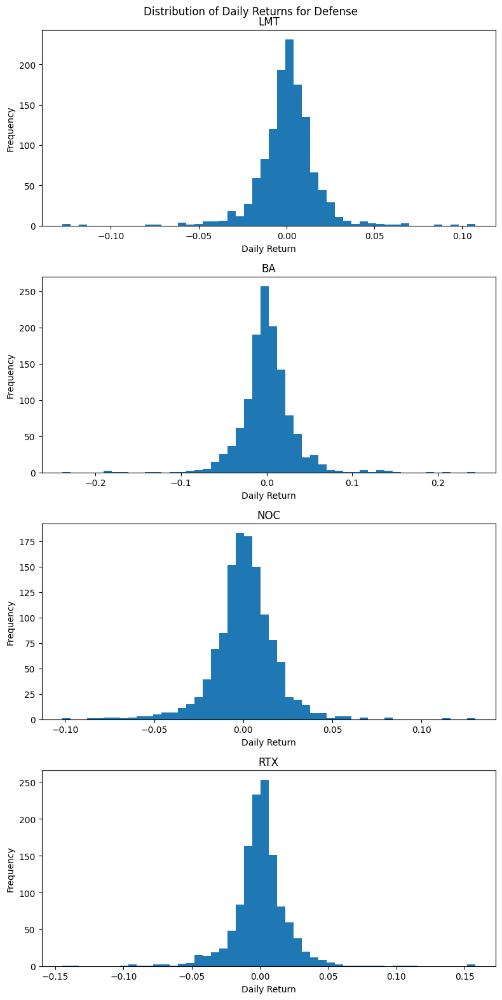

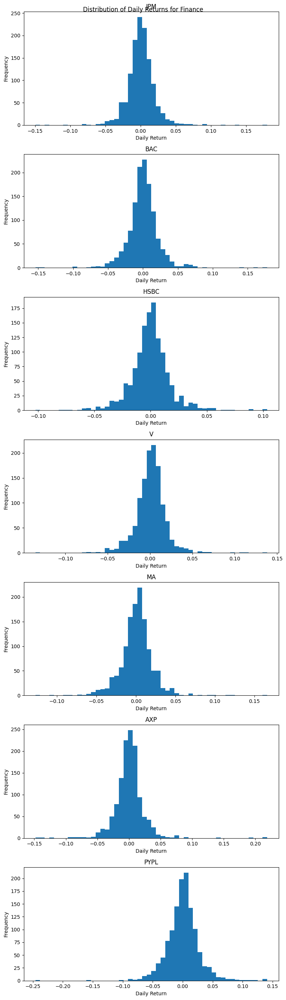

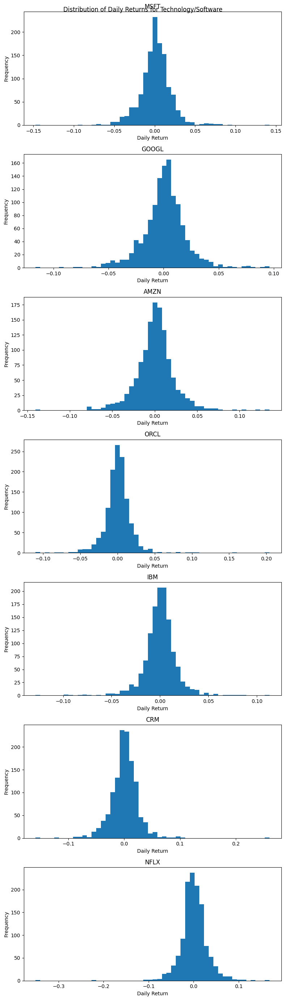

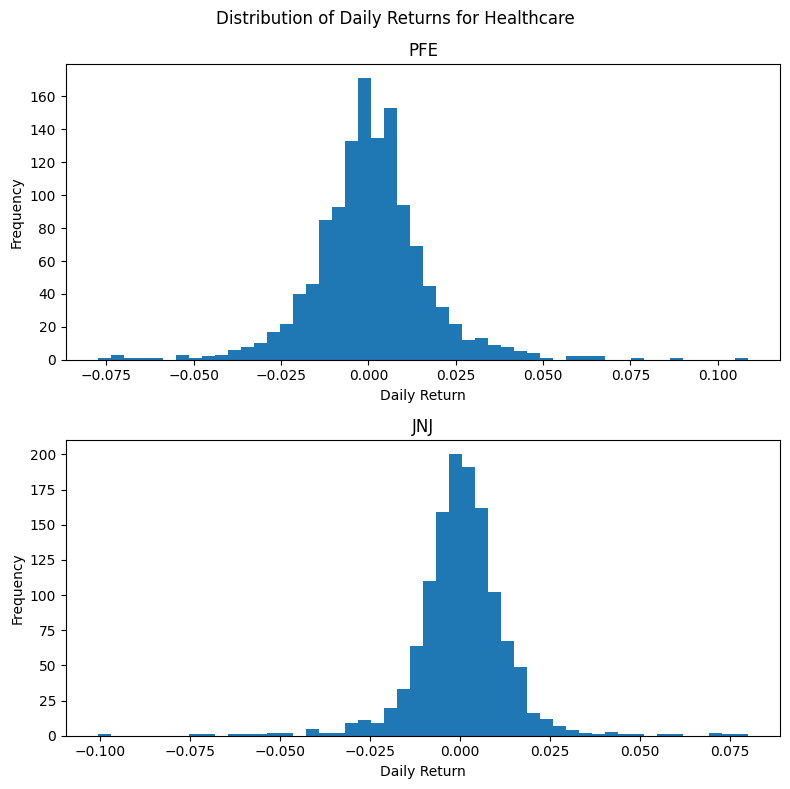

In [18]:
# Create a figure for each category
for category, tickers in categories.items():
    # Calculate daily returns for each stock in the category
    returns = stock_prices.loc[:, tickers].pct_change()
    # Remove the first row (which has a NaN value)
    returns = returns.dropna()
    
    # Create a figure with subplots for each stock
    fig, axes = plt.subplots(nrows=len(tickers), ncols=1, figsize=(8, 4*len(tickers)))
    fig.suptitle(f"Distribution of Daily Returns for {category}")
    
    # Plot the distribution of returns for each stock
    for i, ticker in enumerate(tickers):
        axes[i].hist(returns[ticker], bins=50)
        axes[i].set_title(ticker)
        axes[i].set_xlabel("Daily Return")
        axes[i].set_ylabel("Frequency")
    
    # Adjust the layout of the subplots
    plt.tight_layout()
    plt.show()

# Visualizing the correlation matrix

In [19]:
# Calculate the daily returns for each category
returns_by_category = {}
for category, tickers in categories.items():
    returns_by_category[category] = stock_prices[tickers].pct_change()

# Create a correlation matrix for each category
corr_matrices = {}
for category, returns in returns_by_category.items():
    corr_matrices[category] = returns.corr()

# Print each correlation matrix
for category, corr_matrix in corr_matrices.items():
    print(f"Correlation Matrix for {category}:")
    print(corr_matrix)
    print("\n")

Correlation Matrix for Technology/Hardware:
          AAPL      INTC      NVDA       AMD      DELL
AAPL  1.000000  0.593042  0.665125  0.561202  0.494897
INTC  0.593042  1.000000  0.610190  0.472652  0.481362
NVDA  0.665125  0.610190  1.000000  0.721197  0.486945
AMD   0.561202  0.472652  0.721197  1.000000  0.417086
DELL  0.494897  0.481362  0.486945  0.417086  1.000000


Correlation Matrix for Retail:
           WMT      COST        KR       TGT        HD
WMT   1.000000  0.612341  0.402888  0.474322  0.443334
COST  0.612341  1.000000  0.371910  0.539494  0.588181
KR    0.402888  0.371910  1.000000  0.299508  0.237023
TGT   0.474322  0.539494  0.299508  1.000000  0.520523
HD    0.443334  0.588181  0.237023  0.520523  1.000000


Correlation Matrix for Defense:
          LMT        BA       NOC       RTX
LMT  1.000000  0.448690  0.821223  0.586871
BA   0.448690  1.000000  0.366442  0.684145
NOC  0.821223  0.366442  1.000000  0.547234
RTX  0.586871  0.684145  0.547234  1.000000


Correla

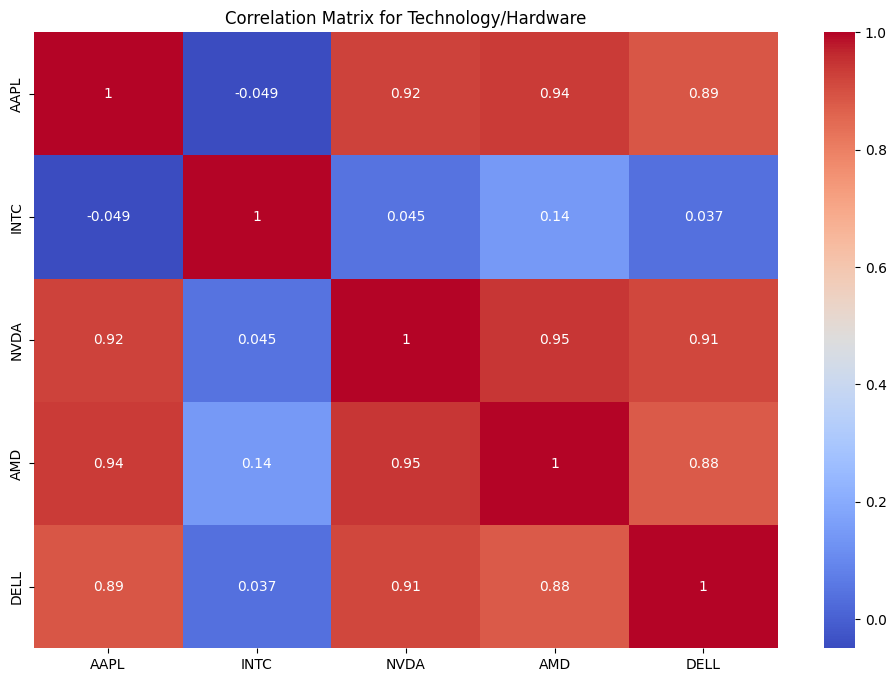

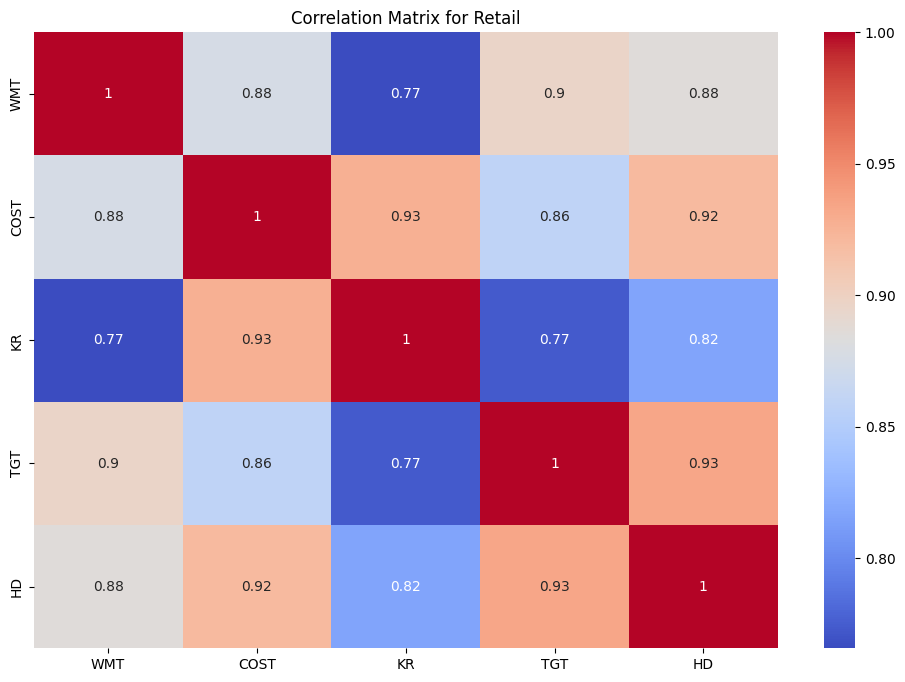

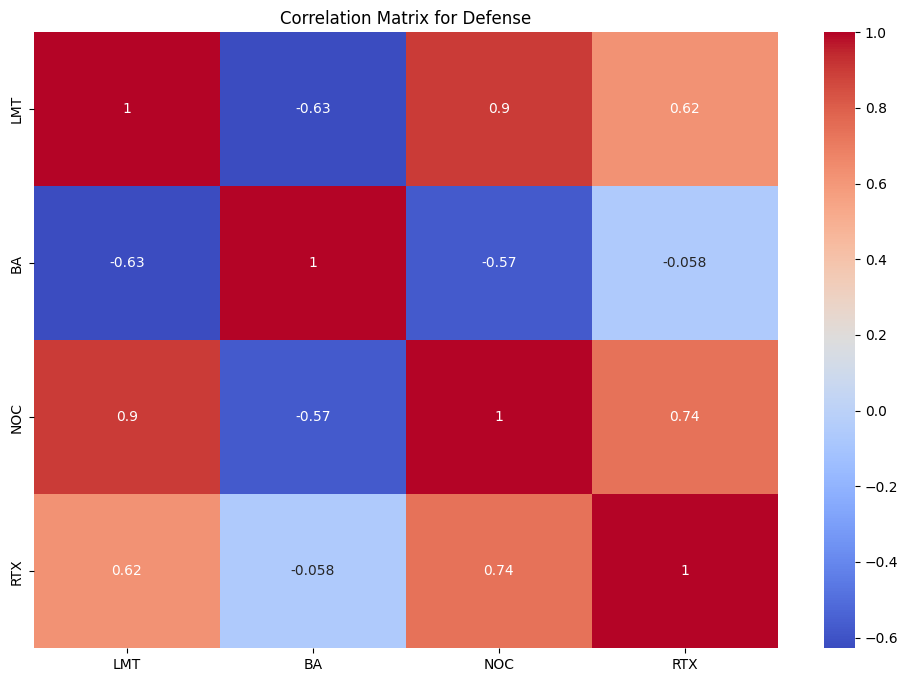

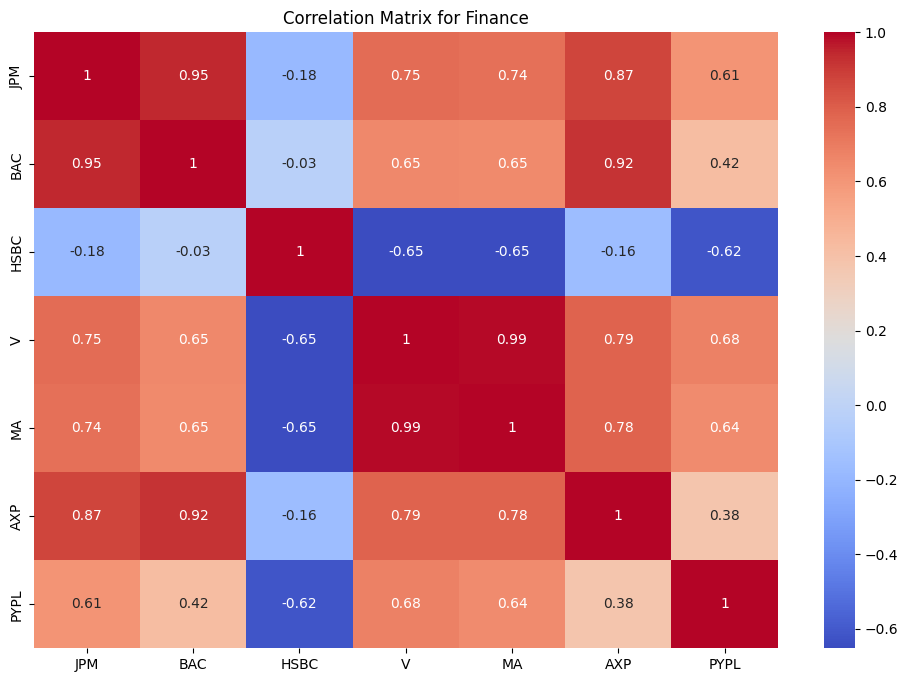

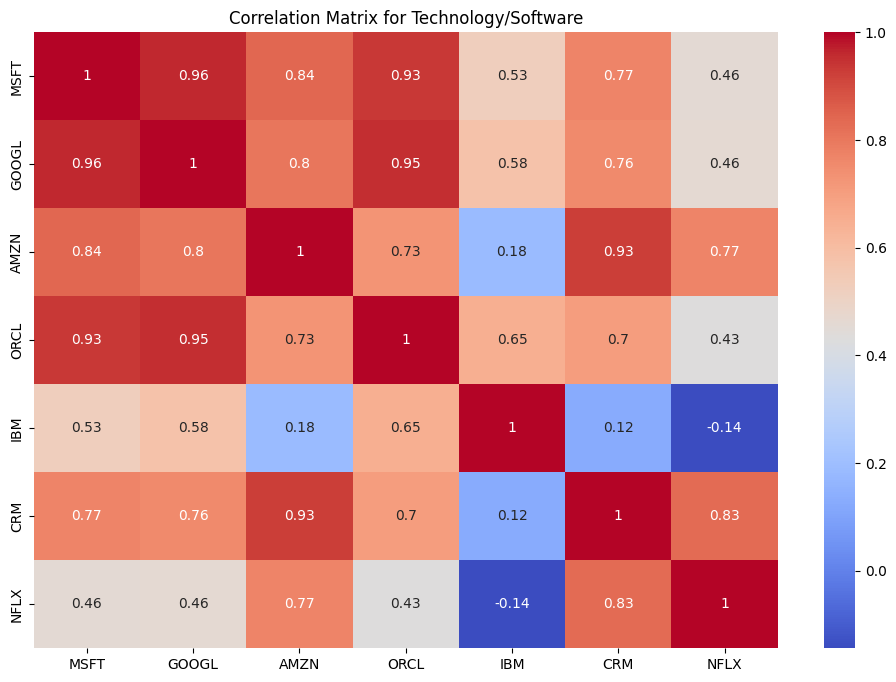

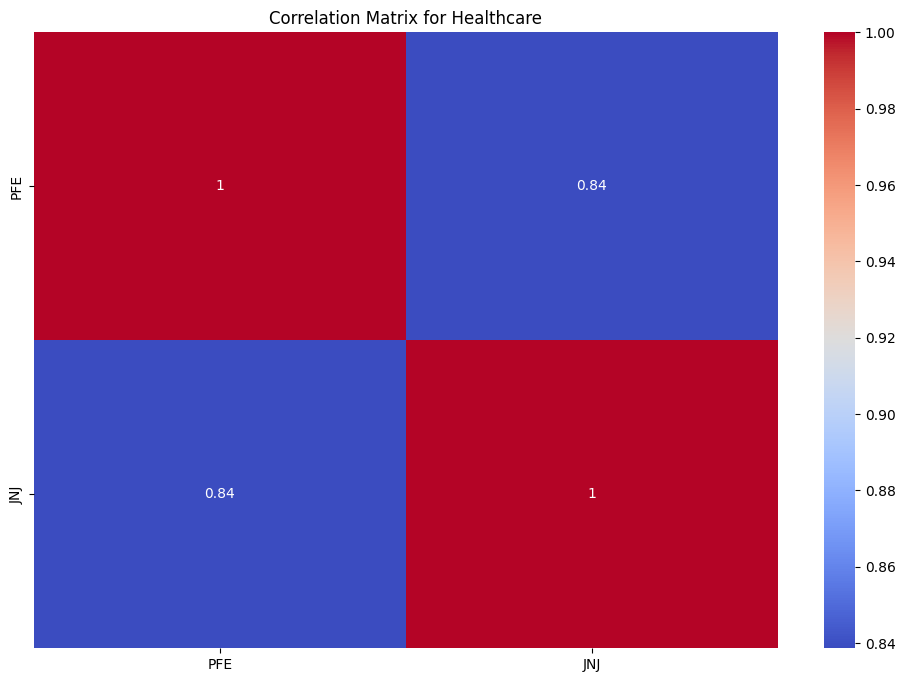

In [20]:
# Calculate the correlation matrix for each category
corr_matrices = {}
for category, tickers in categories.items():
    corr_matrices[category] = stock_prices.loc[:, tickers].corr()

# Plot the heatmap for each category
for category, corr_matrix in corr_matrices.items():
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
    plt.title(f"Correlation Matrix for {category}")
    plt.show()

## Interpretation

1. Technology/ Hardware :
    - The technology/hardware sector has moderate to strong positive correlations between its stocks. This means that when one stock in the sector performs well, the other stocks in the sector are likely to perform well as well. 
    - Stocks like Nvidia and Advanced Micro Devices have relatively higher correlations with other stocks in the sector, indicating a stronger relationship between these stocks. 
    - The highest correlation coefficient is observed between Nvidia and Apple (0.665125), suggesting a relatively strong positive relationship between these two stocks.
    
2. Retail :
    - The retail sector has positive correlations between its stocks, but the correlations are generally weaker than those in the technology/hardware sector. This means that when one stock in the sector performs well, the other stocks in the sector are also likely to perform well, but the relationship is not as strong.
    - Stocks like Walmart and Costco have a relatively higher correlation (0.612341), indicating a stronger relationship between these two stocks. 
    
3. Defence :
    - The defense sector has a mixed bag of correlations between its stocks. Some correlations are strong, while others are moderate. For example, Lockheed Martin (LMT) and Northrop Grumman (NOC) have a strong positive correlation of 0.821223. This means that these two stocks tend to move in the same direction. 
    - However, other correlations within the sector are not as strong.Overall, the correlations within the defense sector suggest that there are some interdependencies between stocks, but the relationships are not as strong as those observed in the technology/hardware sector.
    
4. Finance :
    - The finance sector has strong positive correlations between its stocks. This means that when one stock in the sector performs well, the other stocks in the sector are likely to perform well as well. For example, JPMorgan Chase (JPM) and Bank of America (BAC) have a very high correlation coefficient of 0.928265. This means that these two stocks tend to move in the same direction. The correlations within this sector are generally high, suggesting that the stocks tend to move together.
    
5. Technology/ Software : 

    - The technology/software sector has positive correlations between its stocks, but these correlations are relatively lower than those in other sectors. This means that when one stock in the sector performs well, the other stocks in the sector are also likely to perform well, but the relationship is not as strong. For example, Microsoft (MSFT) and Google (GOOGL) have the highest correlation coefficient of 0.808735, indicating a relatively stronger positive relationship between these two stocks. The correlations within this sector are generally moderate, suggesting some level of interdependence but not as strong as in other sectors.
    
6. Healthcare :

    - The healthcare sector has moderate positive correlations between its stocks. 

# Visualizing the distribution of daily returns of each sector

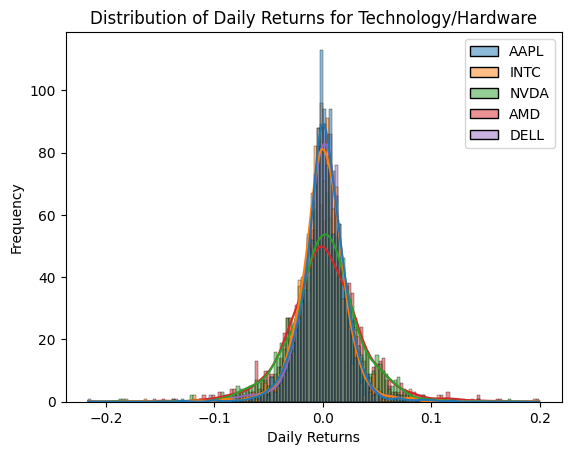

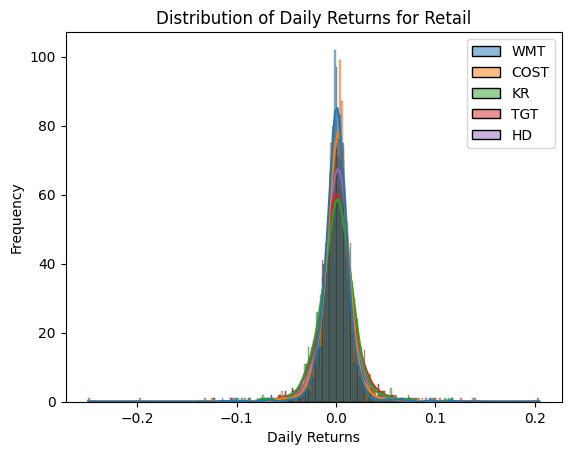

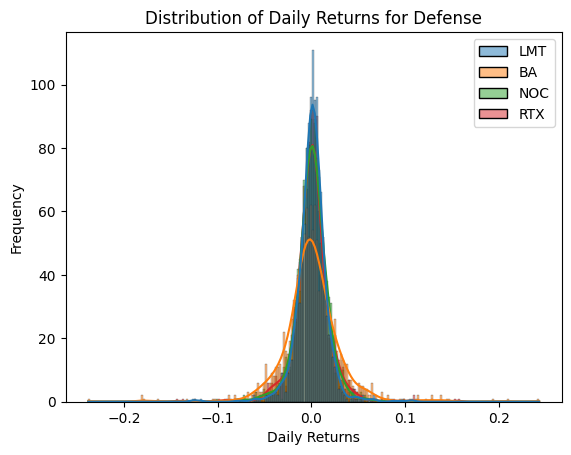

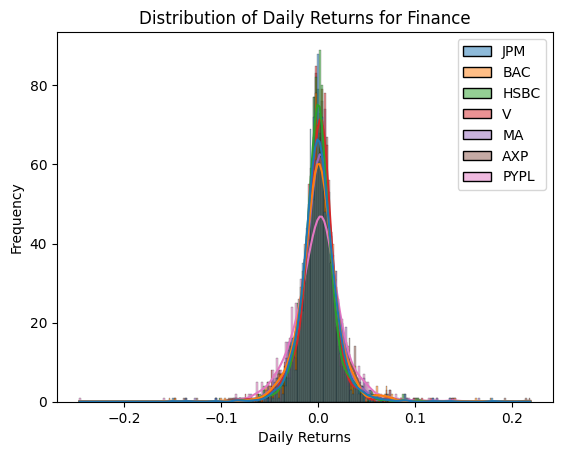

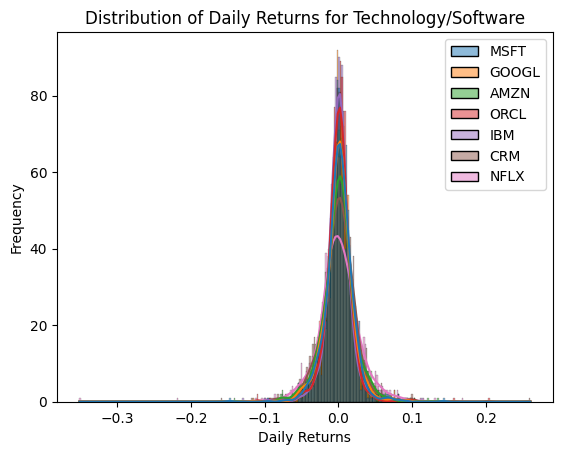

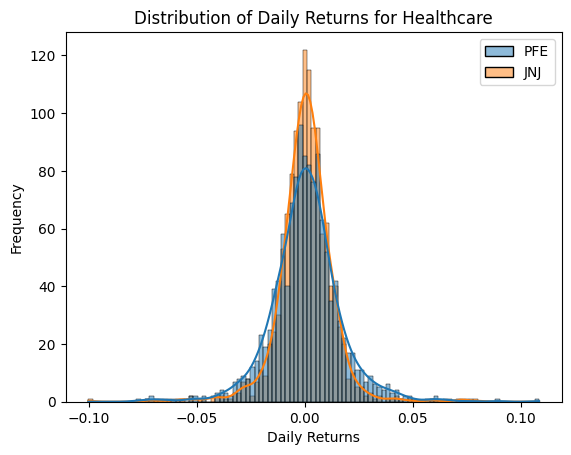

In [21]:
# Create a dictionary to store daily returns for each category
returns_by_category = {}

# Calculate daily returns for each category
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change().dropna()
    returns_by_category[category] = returns

# Plot the distribution of daily returns for each category
for category, returns in returns_by_category.items():
    sns.histplot(data=returns, kde=True)
    plt.title(f"Distribution of Daily Returns for {category}")
    plt.xlabel("Daily Returns")
    plt.ylabel("Frequency")
    plt.show()


## Visualizing the box plot for daily returns of each sector

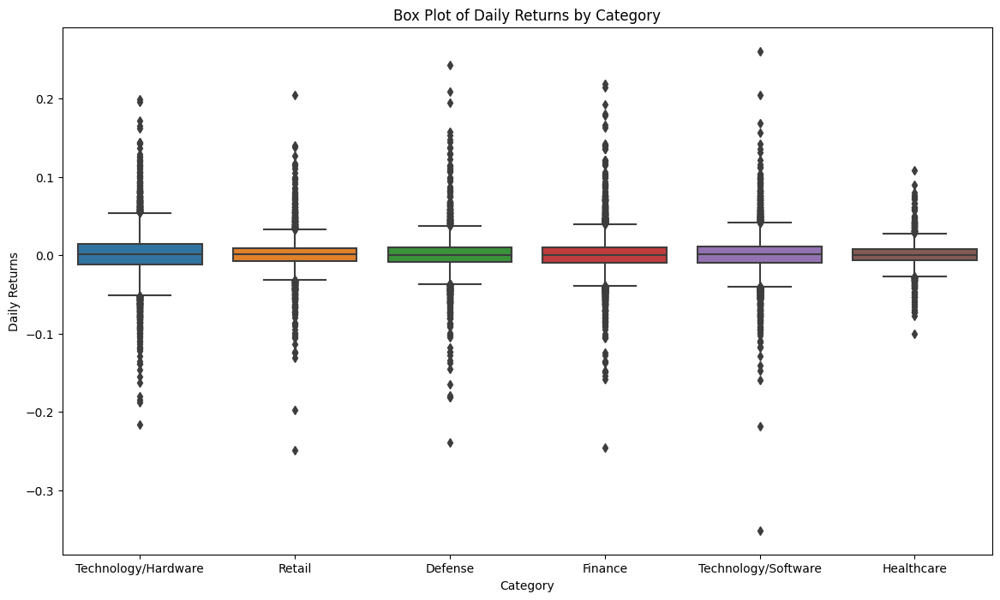

In [22]:
# Create a list to store daily returns for all categories
all_returns = []

# Calculate daily returns for each category and store in the list
for category, tickers in categories.items():
    returns = stock_prices.loc[:, tickers].pct_change().dropna()
    all_returns.append(returns)

# Create subplots with larger figure size
fig, ax = plt.subplots(figsize=(14, 8))
# Plot a box plot of daily returns for each category
sns.boxplot(data=all_returns)
plt.title("Box Plot of Daily Returns by Category")
plt.xlabel("Category")
plt.ylabel("Daily Returns")
plt.xticks(range(len(categories)), categories.keys())
plt.show()

# Visualizing the correlation matrixes for all the sectors

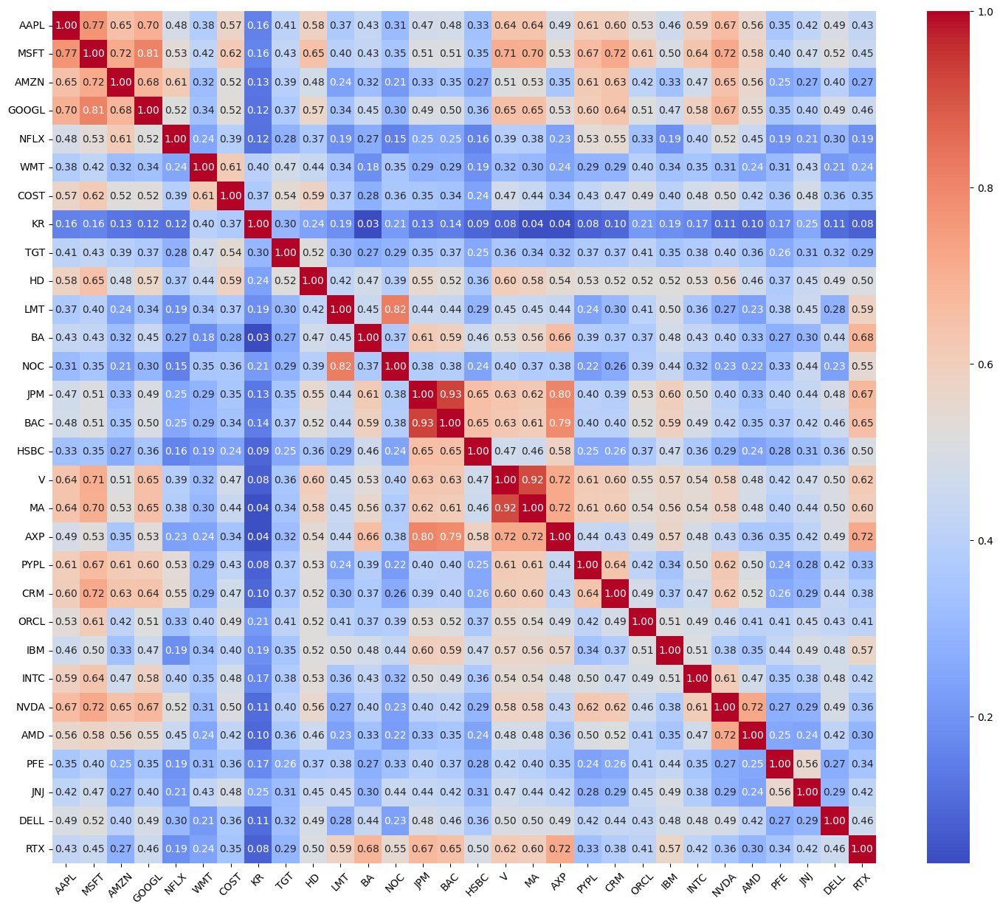

In [23]:
# Calculate the correlation matrix for all sectors
corr_matrix = stock_prices.iloc[:, 1:].pct_change().corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.xticks(rotation=45)
plt.show()


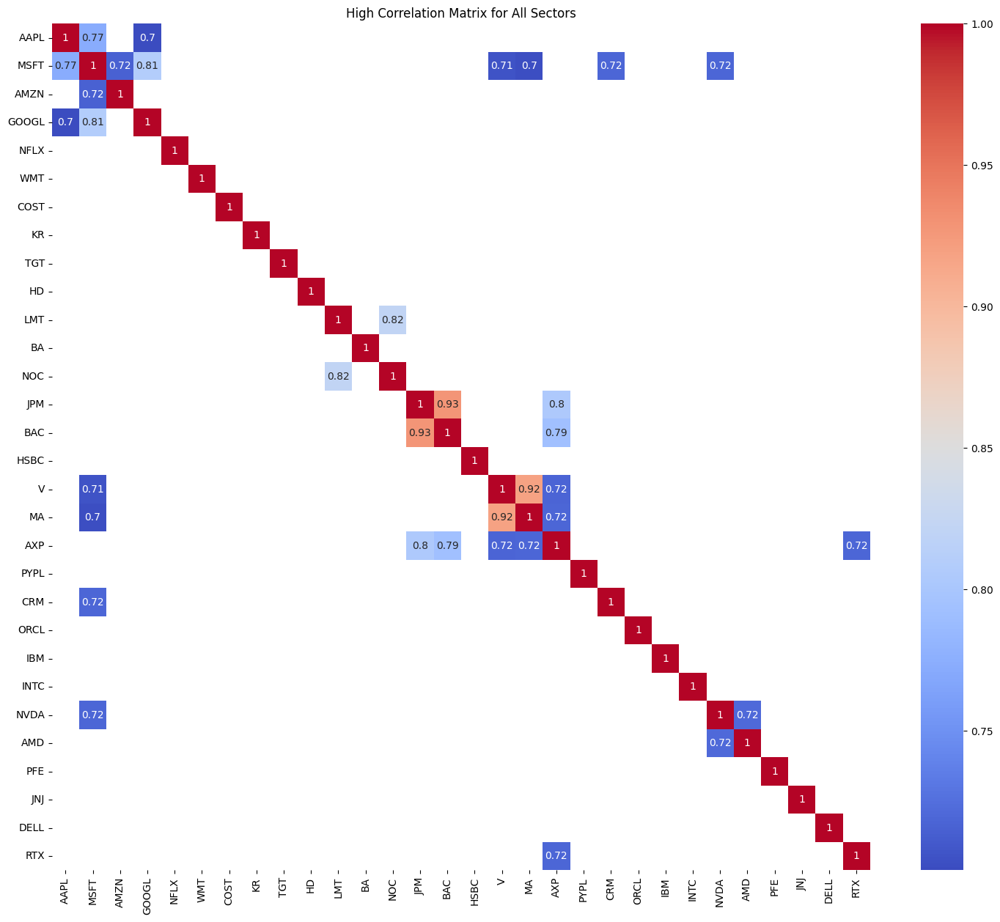

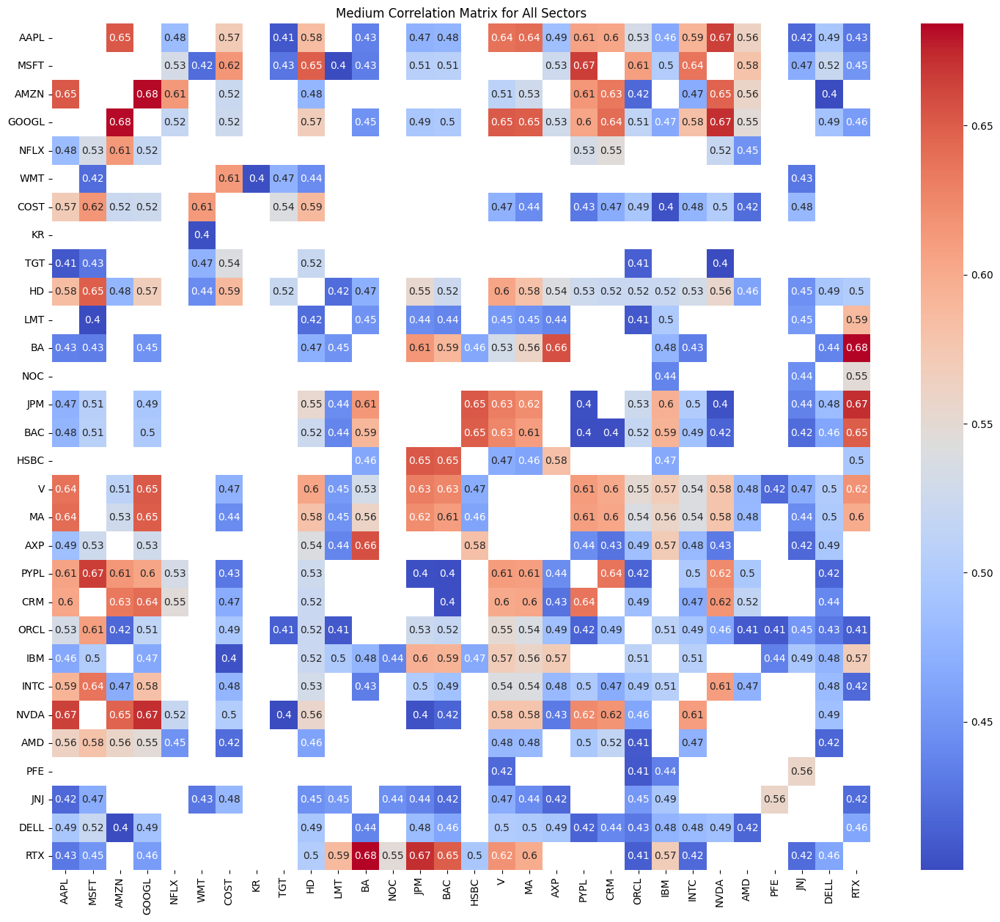

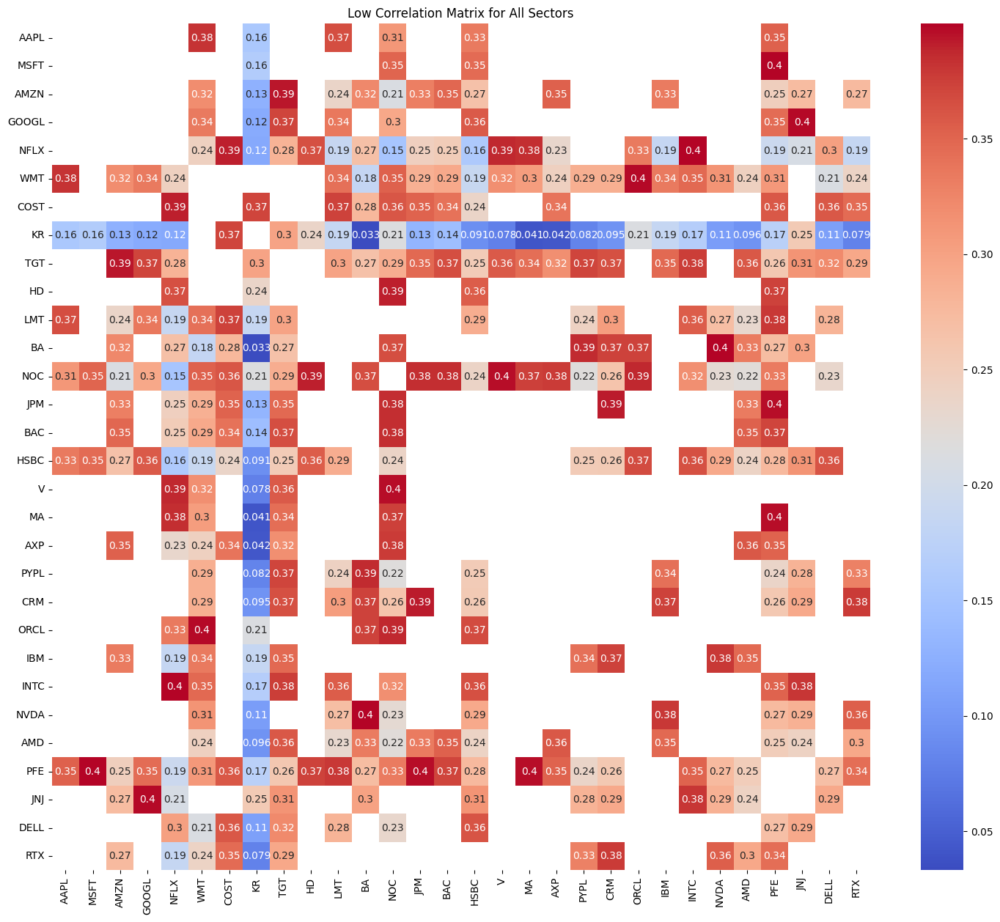

In [24]:
# Calculate the correlation matrix for all sectors
corr_matrix = stock_prices.iloc[:, 1:].pct_change().corr()

# Divide correlation matrix into three parts
high_corr = corr_matrix[corr_matrix > 0.7]
med_corr = corr_matrix[(corr_matrix > 0.4) & (corr_matrix <= 0.7)]
low_corr = corr_matrix[corr_matrix <= 0.4]

# Plot high correlation matrix as a heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(high_corr, cmap="coolwarm", annot=True)
plt.title("High Correlation Matrix for All Sectors")
plt.show()

# Plot medium correlation matrix as a heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(med_corr, cmap="coolwarm", annot=True)
plt.title("Medium Correlation Matrix for All Sectors")
plt.show()

# Plot low correlation matrix as a heatmap
plt.figure(figsize=(18, 15))
sns.heatmap(low_corr, cmap="coolwarm", annot=True)
plt.title("Low Correlation Matrix for All Sectors")
plt.show()


# Visualising the scatter plots of each sector

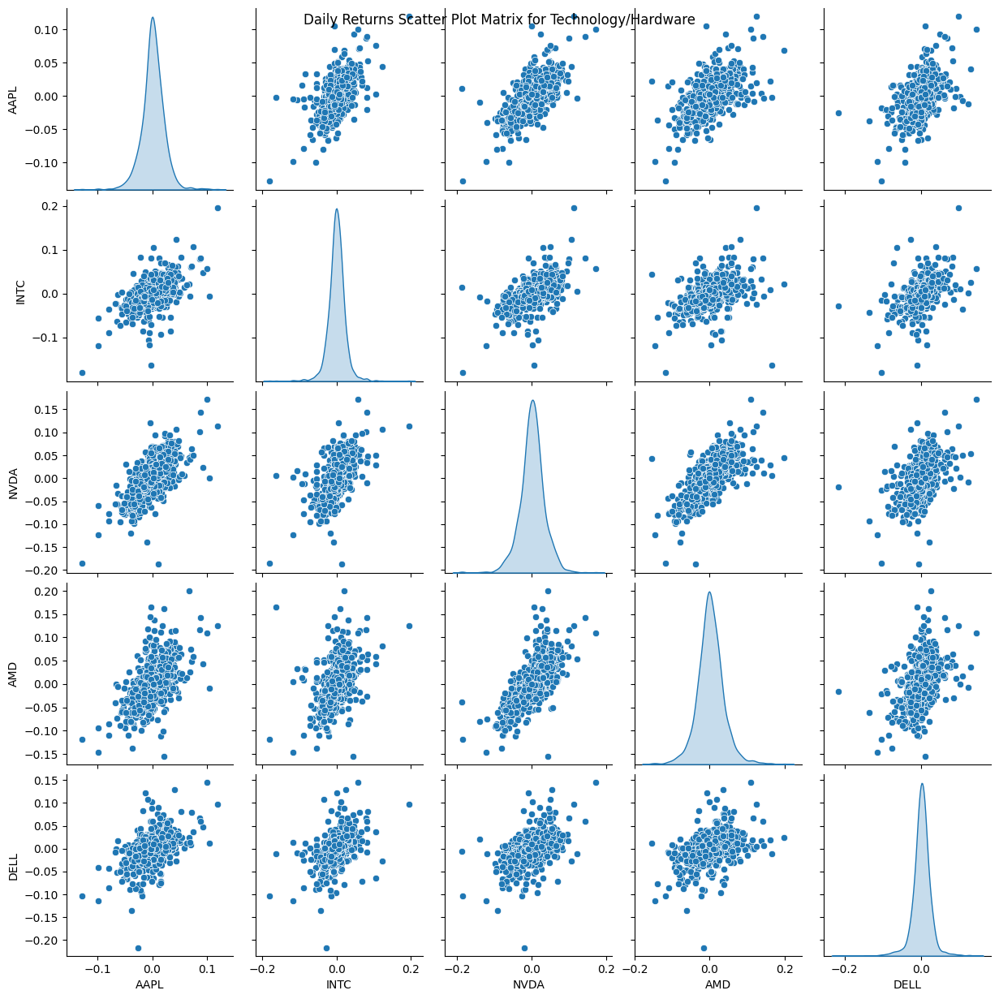

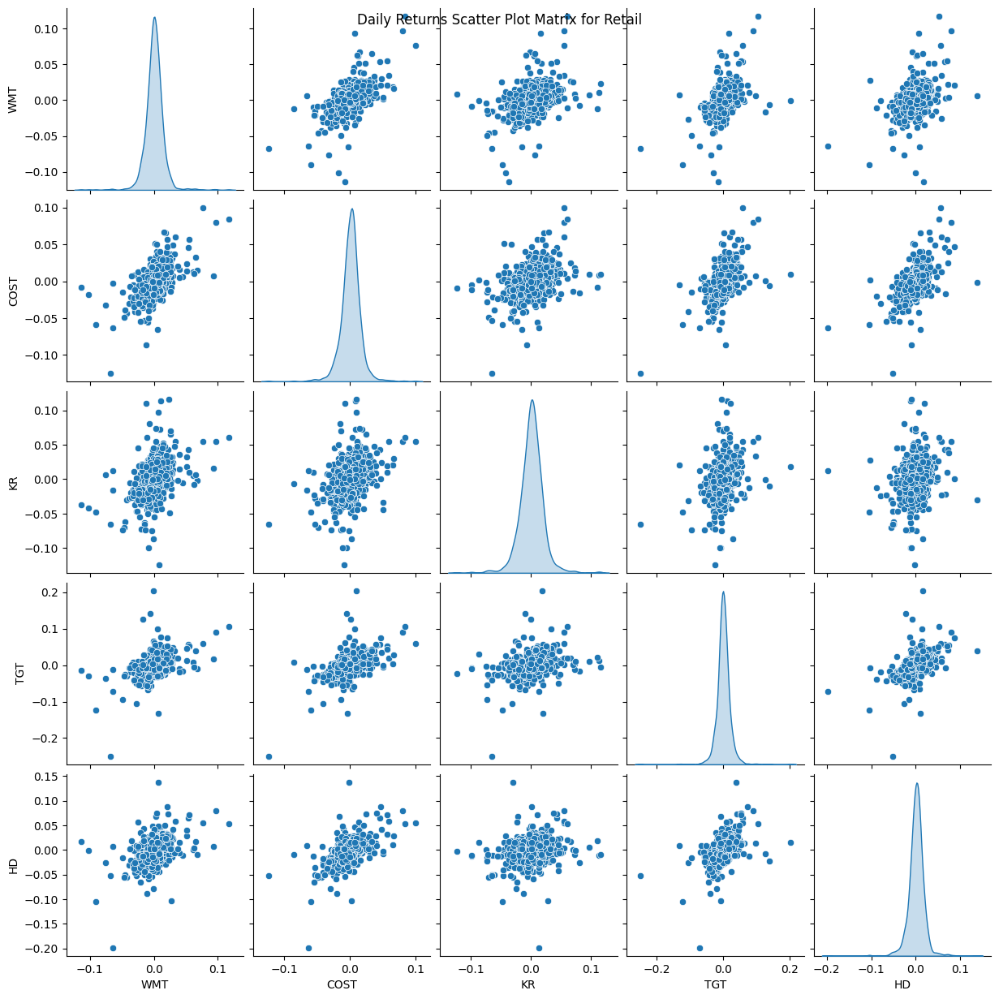

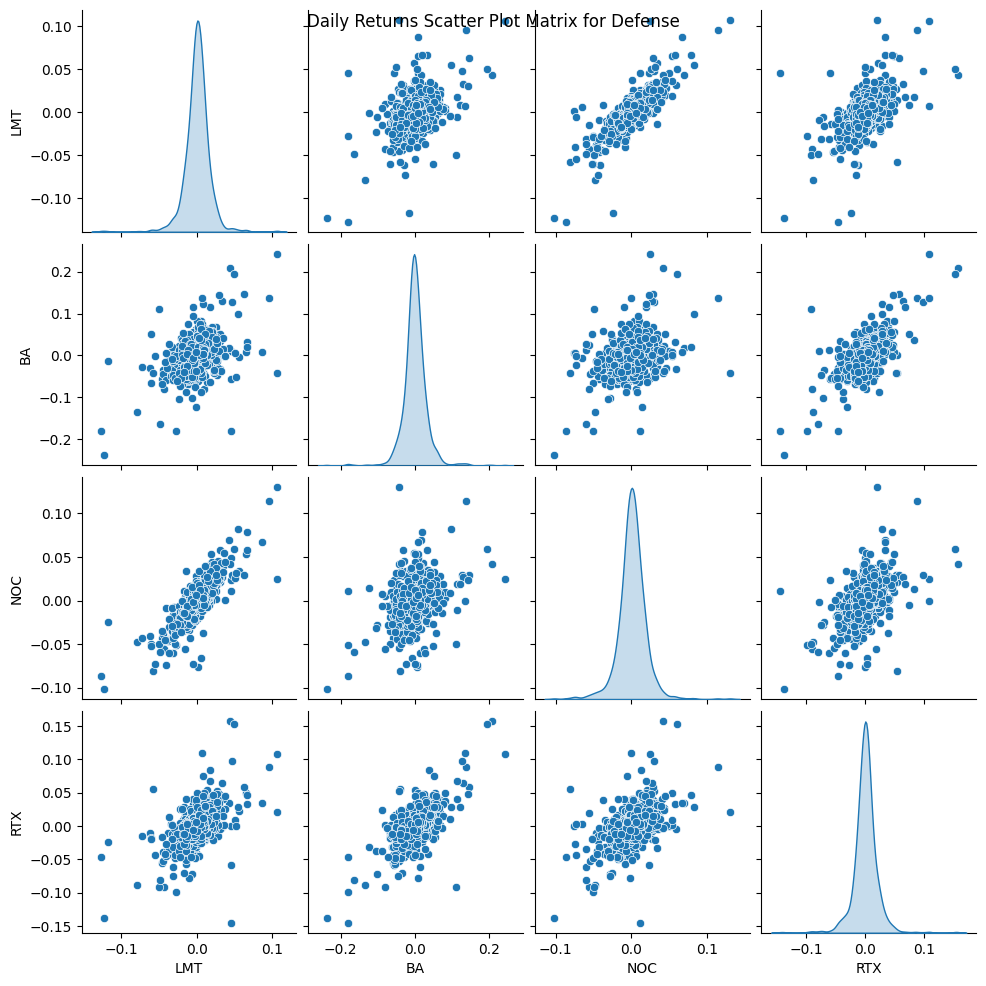

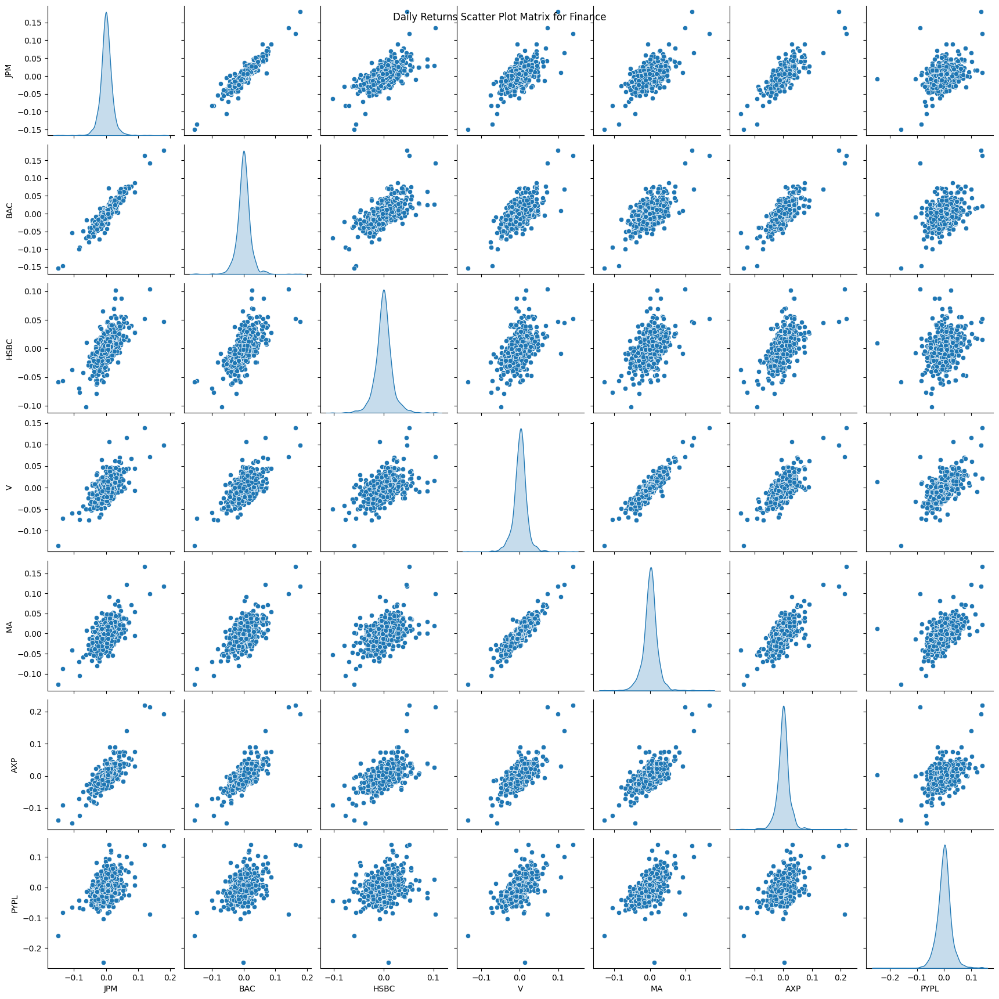

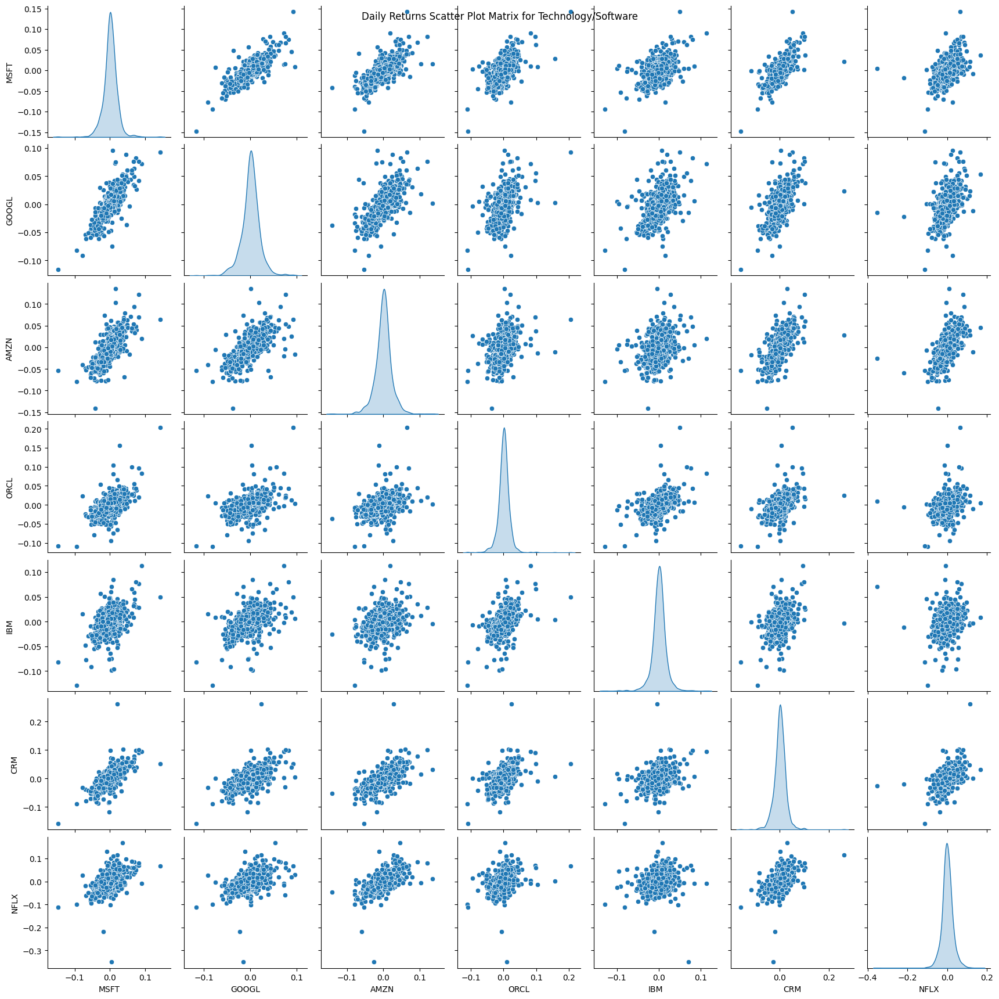

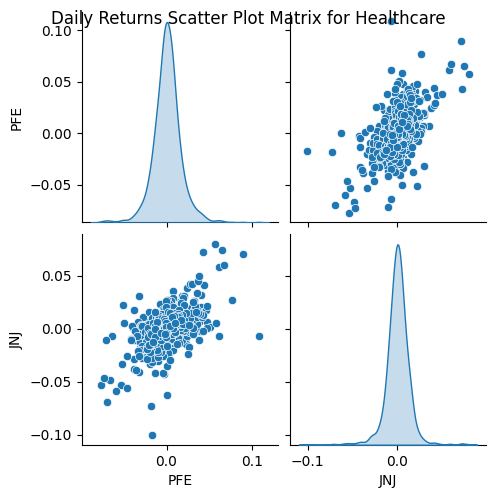

In [25]:
# Iterate over each category
for category, tickers in categories.items():
    # Calculate daily returns for each ticker in the category
    returns = stock_prices.loc[:, tickers].pct_change().dropna()
    # Create scatter plot matrix
    sns.pairplot(data=returns, kind='scatter', diag_kind='kde')
    # Set title
    plt.suptitle(f"Daily Returns Scatter Plot Matrix for {category}")
    plt.show()


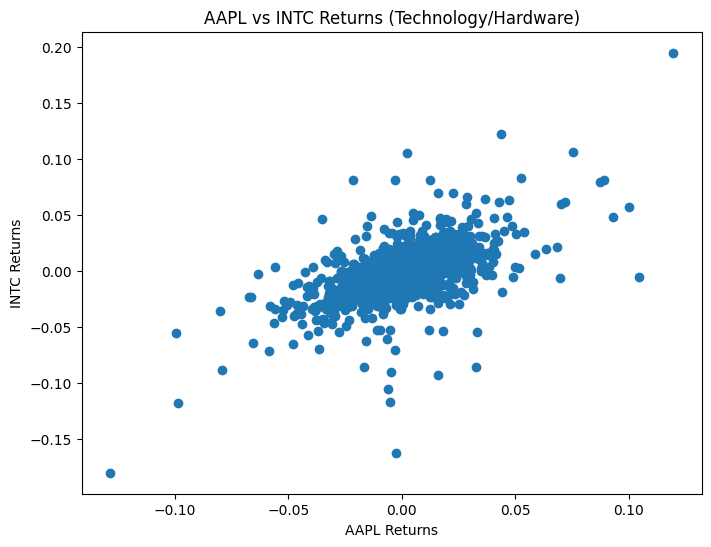

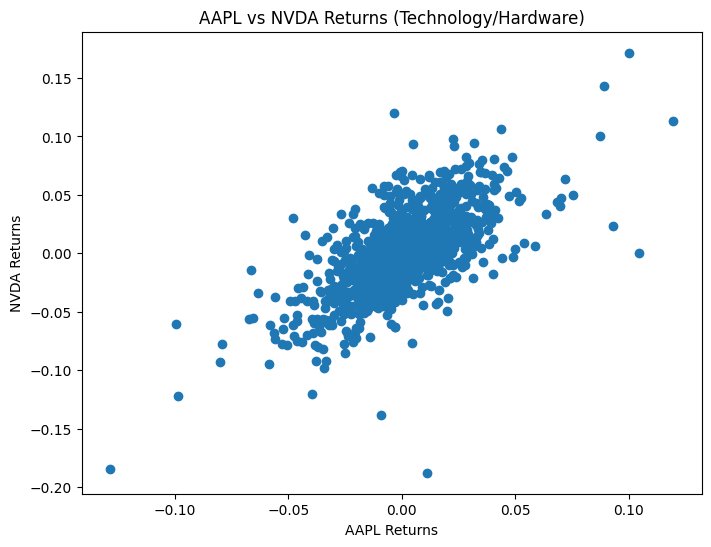

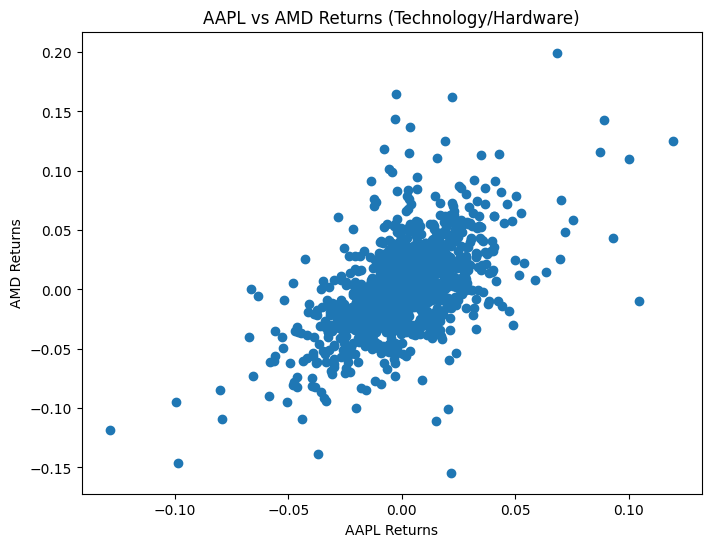

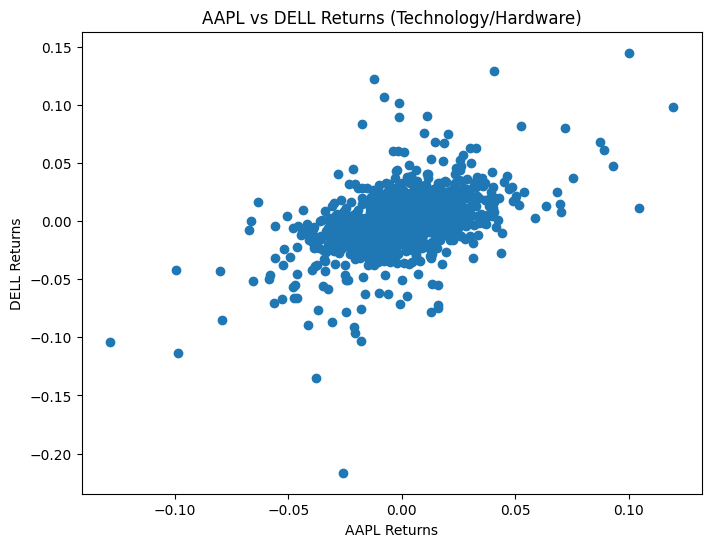

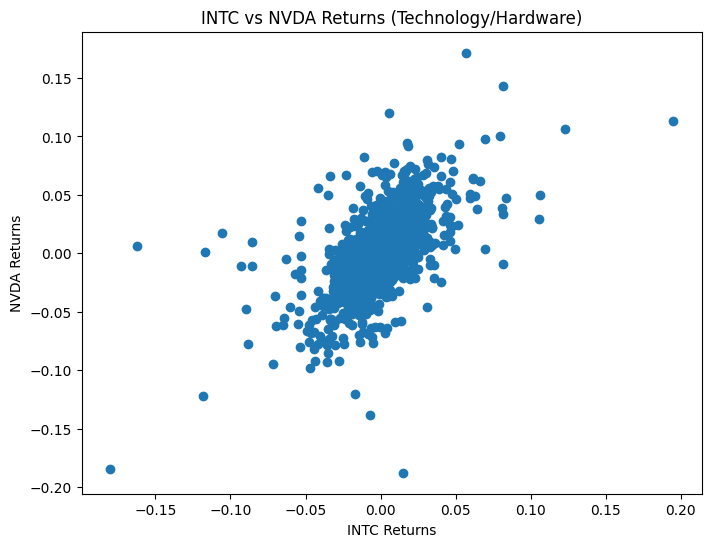

...

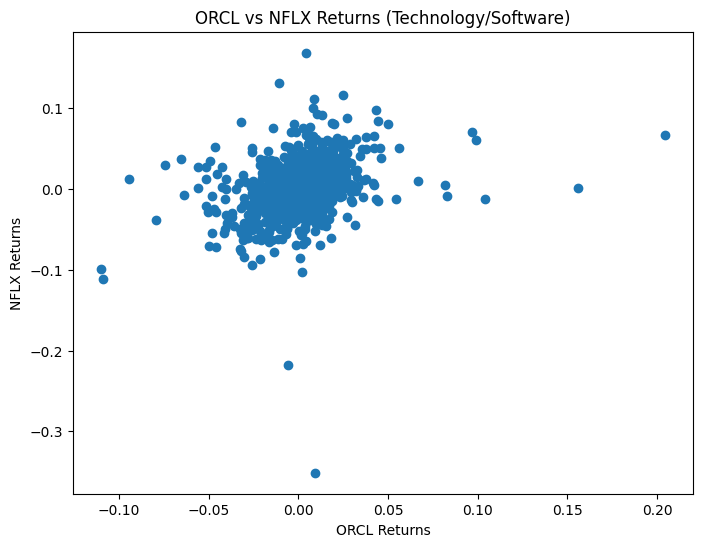

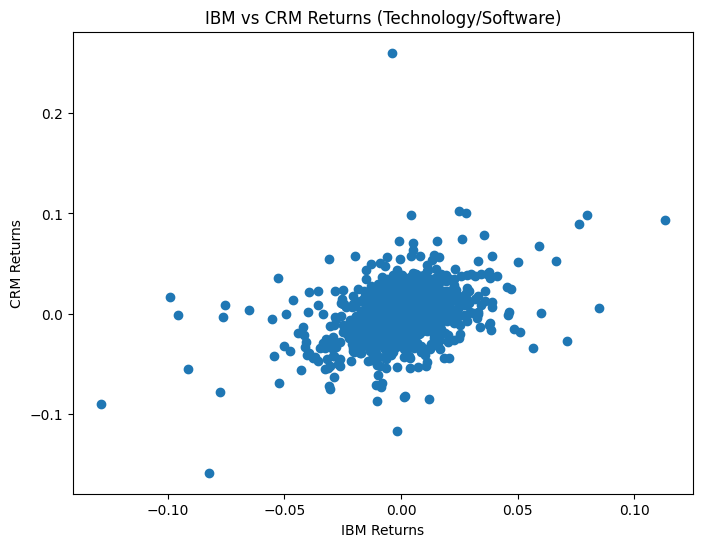

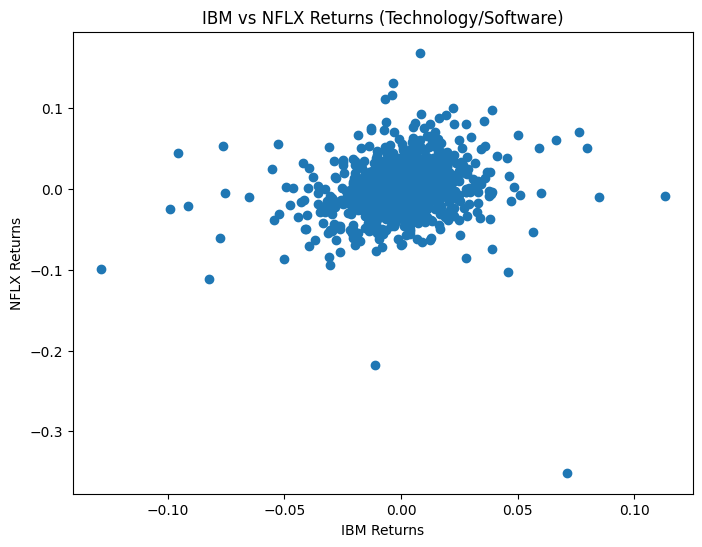

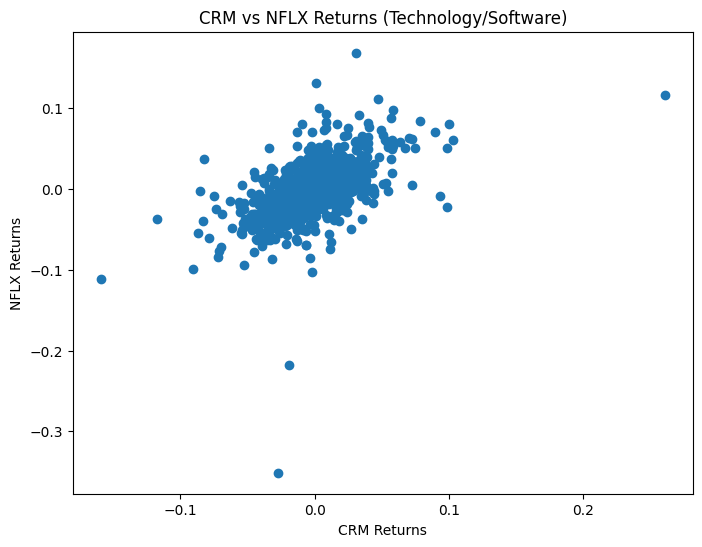

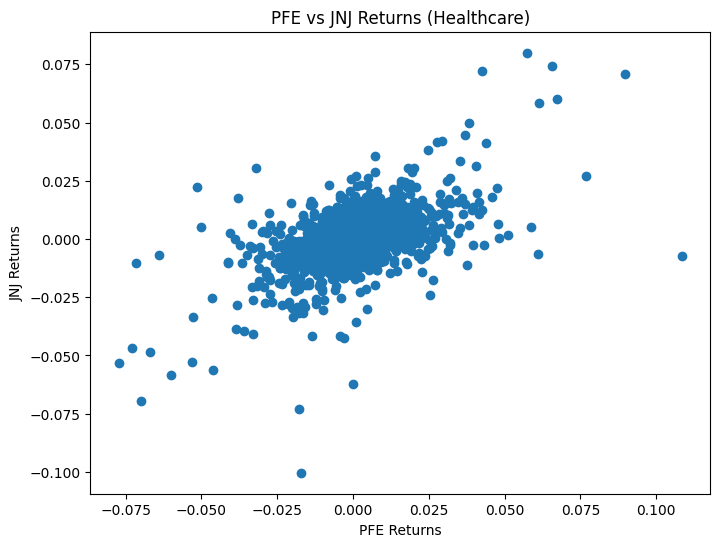

In [26]:
import itertools

# Create a list to store all scatter plots
all_scatterplots = []

# Iterate over each category
for category, tickers in categories.items():
    # Calculate daily returns for each ticker
    returns = stock_prices.loc[:, tickers].pct_change().dropna()
    # Create a list to store scatter plots for this category
    category_scatterplots = []
    # Iterate over each pair of tickers in this category
    for pair in itertools.combinations(tickers, 2):
        # Create a scatter plot of returns between the pair of tickers
        plt.figure(figsize=(8, 6))
        plt.scatter(returns[pair[0]], returns[pair[1]])
        plt.xlabel(f"{pair[0]} Returns")
        plt.ylabel(f"{pair[1]} Returns")
        plt.title(f"{pair[0]} vs {pair[1]} Returns ({category})")
        plt.show()
        # Add the scatter plot to the list of scatter plots for this category
        category_scatterplots.append(plt)
    # Add the list of scatter plots for this category to the overall list
    all_scatterplots.append(category_scatterplots)

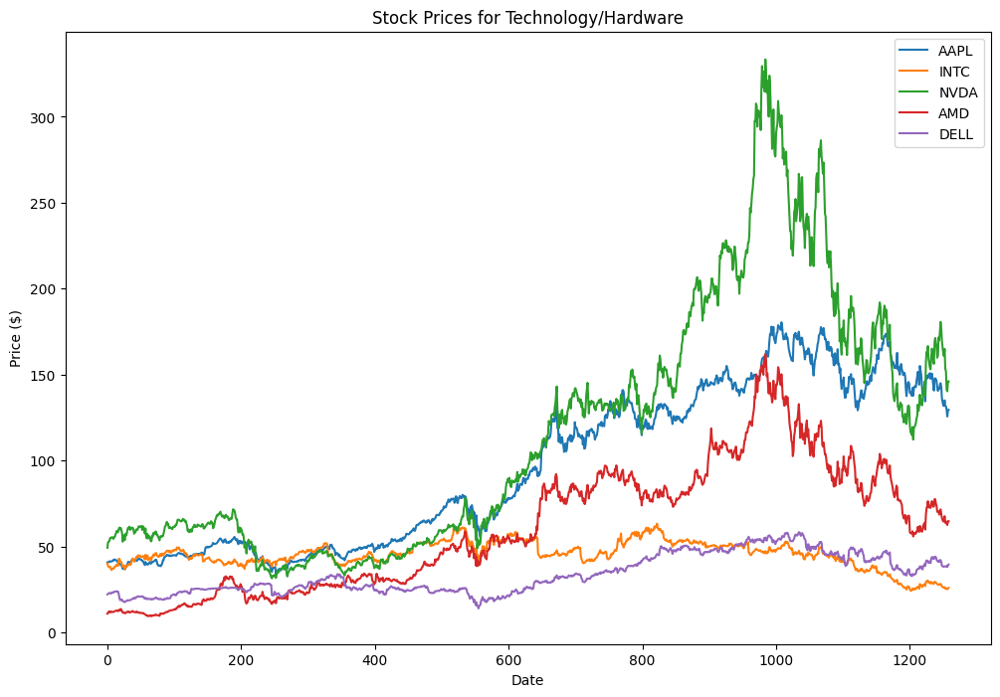

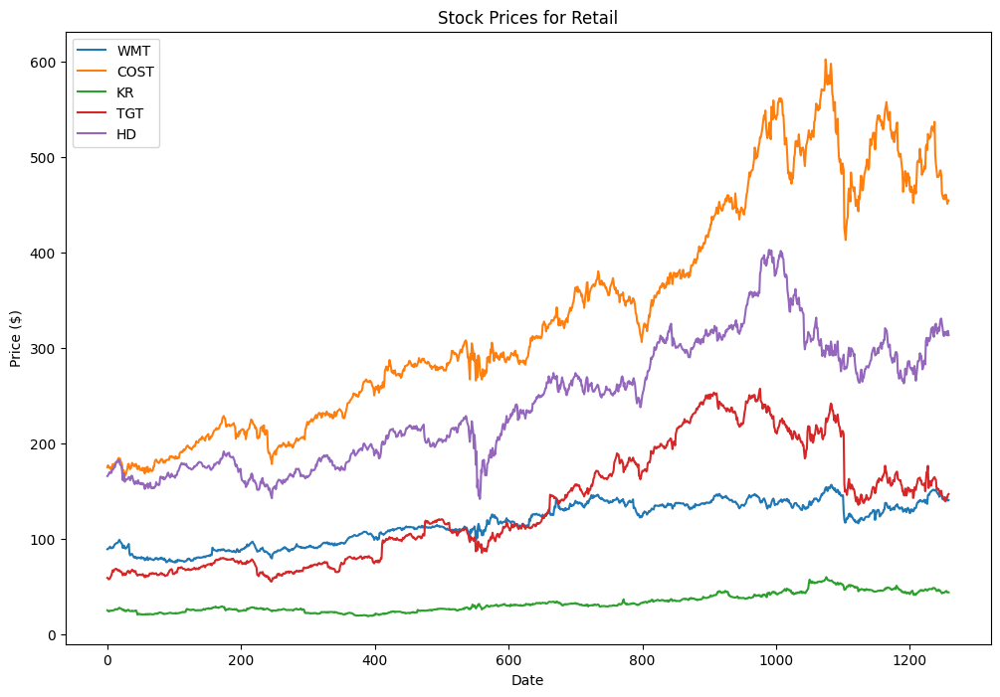

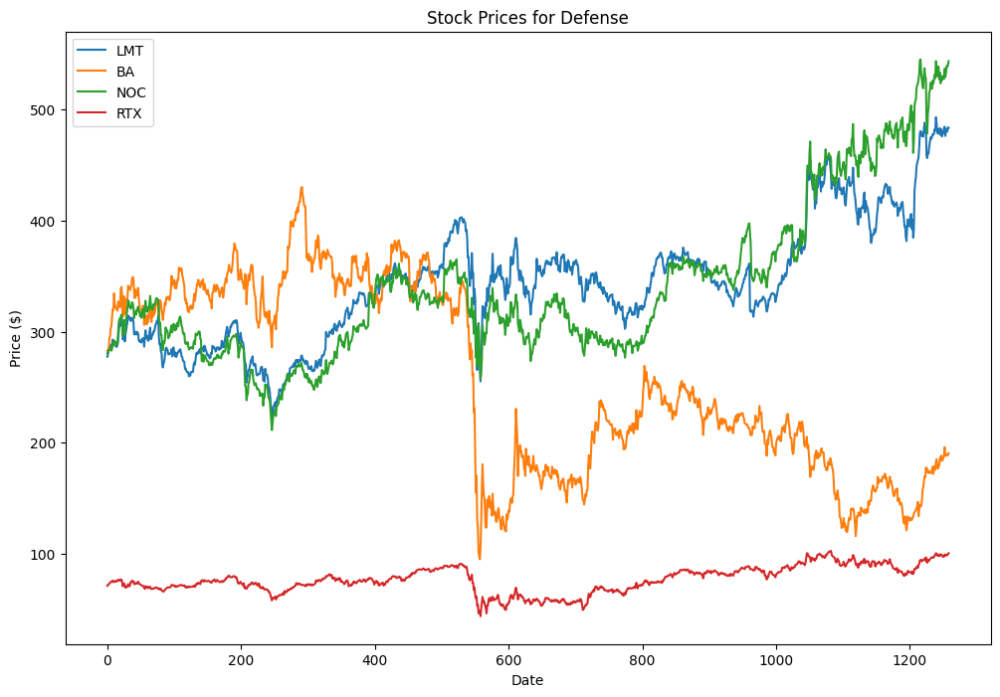

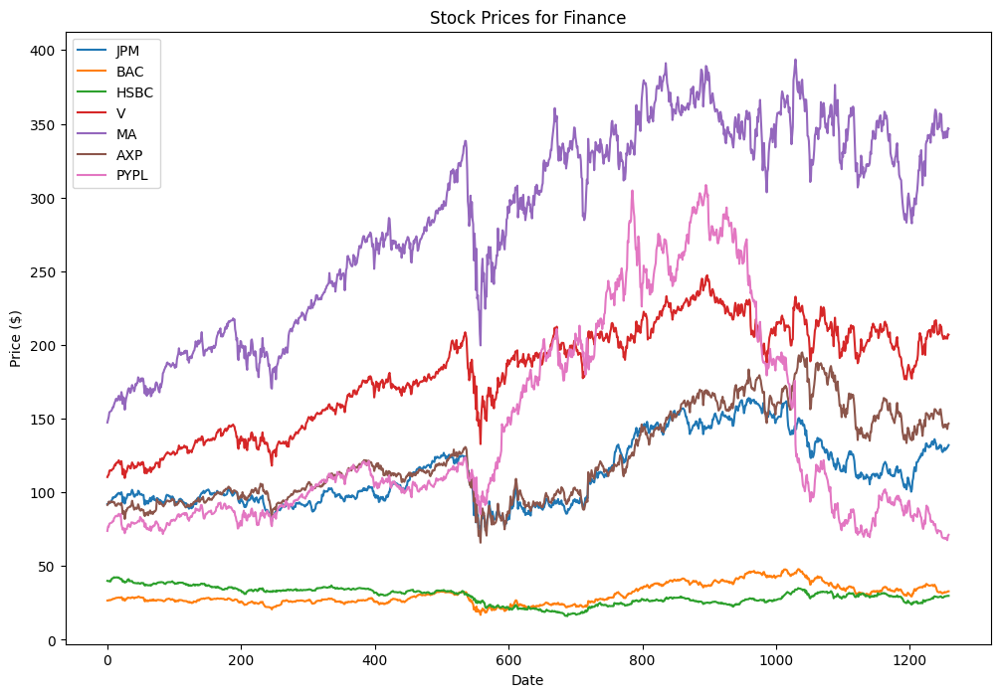

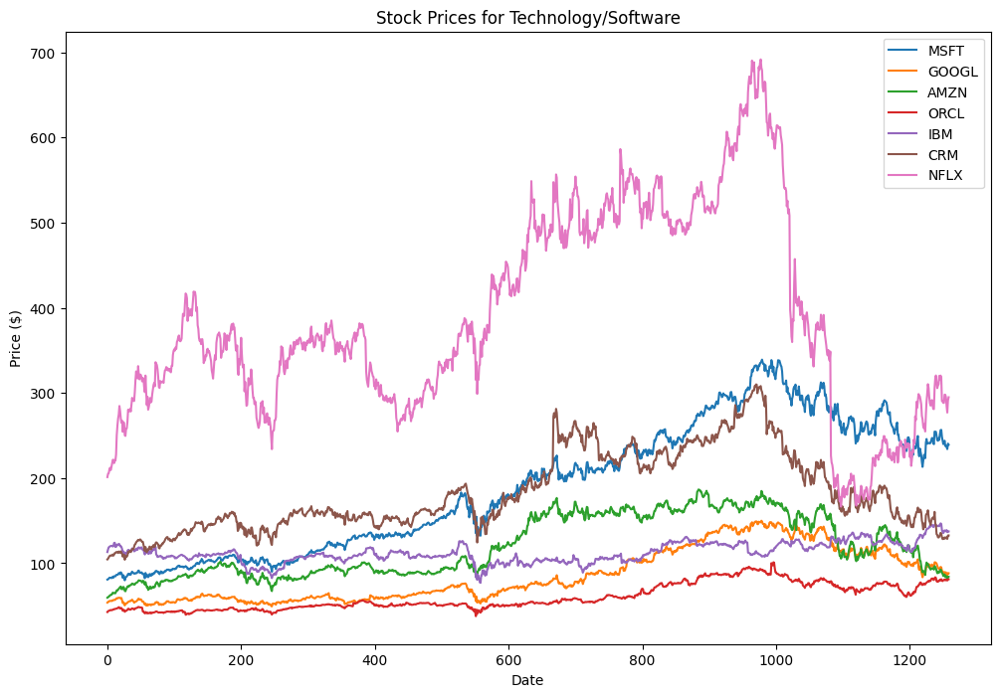

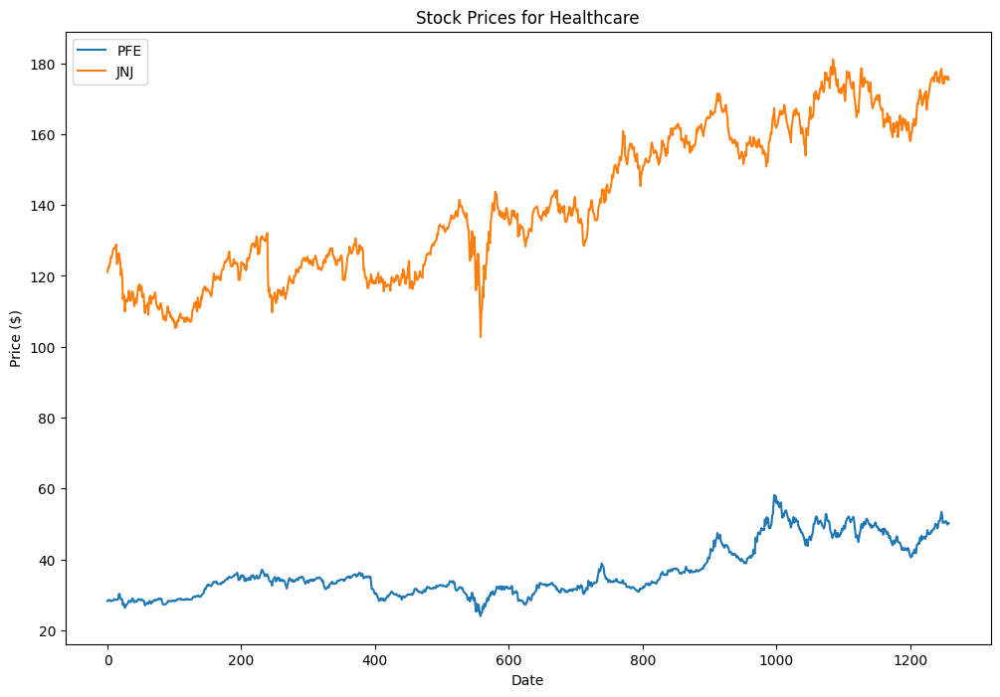

In [27]:
# Plot the stock prices for each ticker in each category
for category, tickers in categories.items():
    plt.figure(figsize=(12, 8))
    for ticker in tickers:
        plt.plot(stock_prices[ticker], label=ticker)
    plt.legend()
    plt.title(f"Stock Prices for {category}")
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.show()

# Portfolio Maximization methods

In this section, I will demonstrate various traditional portfolio maximization methods that are commonly used by financial analysts. 

# Modern Portfolio Theory

Modern Portfolio Theory (MPT) is an investment strategy that seeks to maximize a portfolio's expected return for a given level of risk or minimize risk for a given level of expected return. It was developed by Harry Markowitz in 1952.

# Monte Carlo Simulation for portfolio optimization. 

This technique uses repeated random sampling to generate a large number of portfolio allocations (i.e., weights for each asset in the portfolio), calculates the expected return and volatility (or risk) for each allocation, and then identifies the optimal portfolio based on some metric, typically the Sharpe Ratio.

The efficient frontier is a set of optimal portfolios that offer the highest expected return for a defined level of risk or the lowest risk for a given expected return. It is central to MPT.

In this specific implementation, the code uses Monte Carlo simulation to generate a large number of portfolios with random asset allocations. Then, it calculates the portfolio returns, risks, and Sharpe ratios (which measure the risk-adjusted return of a portfolio). The optimal portfolio is selected based on the highest Sharpe ratio, indicating the best risk-adjusted return.

Finally, the optimal portfolio and the efficient frontier curve are plotted on a graph, with portfolio risk on the x-axis and portfolio return on the y-axis. This visual representation helps investors understand the trade-offs between risk and return and make informed decisions about their investment allocations.

Optimal Portfolio Return: 0.1891
Optimal Portfolio Risk: 0.2110

Optimal Portfolio Allocation:
Ticker   Weight Allocation
  AAPL 0.029793 $29,793.32
  MSFT 0.073931 $73,931.36
  AMZN 0.002397  $2,396.99
 GOOGL 0.001152  $1,151.75
  NFLX 0.001772  $1,772.20
   WMT 0.009306  $9,305.52
  COST 0.077997 $77,997.26
    KR 0.059574 $59,573.88
   TGT 0.063839 $63,839.50
    HD 0.020168 $20,168.23
   LMT 0.072396 $72,396.41
    BA 0.018246 $18,245.50
   NOC 0.055409 $55,408.84
   JPM 0.010893 $10,892.58
   BAC 0.002207  $2,207.40
  HSBC 0.023059 $23,059.23
     V 0.007575  $7,574.93
    MA 0.066271 $66,270.89
   AXP 0.049942 $49,941.68
  PYPL 0.000413    $412.99
   CRM 0.007195  $7,195.50
  ORCL 0.045185 $45,184.95
   IBM 0.041903 $41,902.68
  INTC 0.018920 $18,920.44
  NVDA 0.023726 $23,725.77
   AMD 0.045215 $45,214.95
   PFE 0.054601 $54,600.96
   JNJ 0.078733 $78,732.96
  DELL 0.034730 $34,730.48
   RTX 0.003451  $3,450.83

Category Allocation Details:
              Category    Weight
0  Te

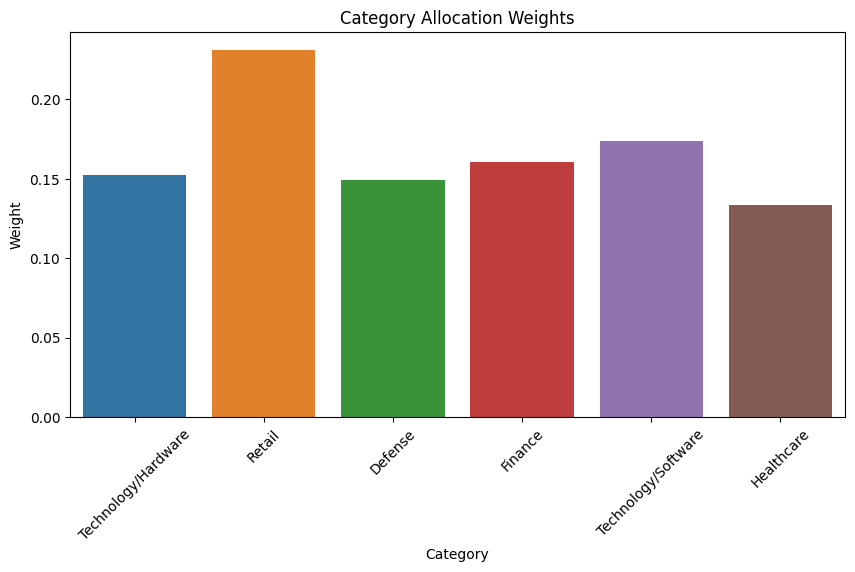

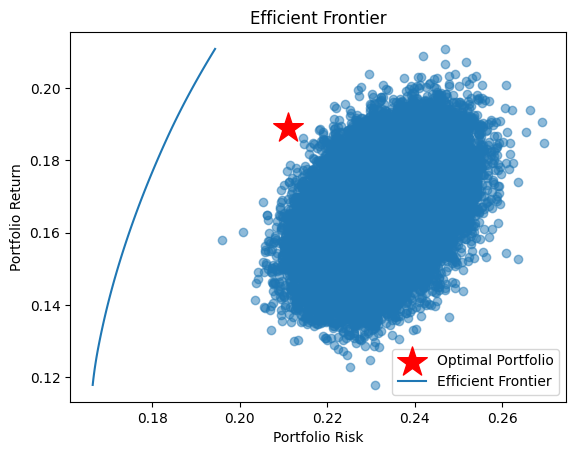

In [28]:
from scipy.optimize import minimize

# Define the tickers list
tickers = ["AAPL","MSFT", "AMZN", "GOOGL", "NFLX", "WMT", "COST", "KR", "TGT", "HD", "LMT", "BA", "NOC", "JPM", "BAC", "HSBC", "V", "MA", "AXP", "PYPL", "CRM", "ORCL", "IBM", "INTC", "NVDA", "AMD", "PFE", "JNJ", "DELL", "RTX"]

# Read in the stock prices
stock_prices = stock_prices[tickers]

# Calculate the mean daily returns of each stock
mean_daily_returns_series = stock_prices.pct_change().mean()

# Convert the mean daily returns series to a numpy array
mean_daily_returns_array = mean_daily_returns_series.to_numpy()

# Calculate the covariance matrix
covariance_matrix = np.cov(stock_prices.pct_change().iloc[1:].T)

# Set the number of portfolios to simulate
num_portfolios = 50000

# Initialize lists to store portfolio returns, risks, and weights
portfolio_returns = []
portfolio_risks = []
portfolio_weights = []

# Randomly generate portfolio weights and calculate portfolio returns and risks
for _ in range(num_portfolios):
    weights = np.random.random(len(tickers))
    weights /= np.sum(weights)
    portfolio_returns.append(np.dot(weights, mean_daily_returns_array) * 252)
    portfolio_risks.append(np.sqrt(np.dot(weights.T, np.dot(covariance_matrix, weights))) * np.sqrt(252))
    portfolio_weights.append(weights)

# Convert the lists to numpy arrays
portfolio_returns = np.array(portfolio_returns)
portfolio_risks = np.array(portfolio_risks)
portfolio_weights = np.array(portfolio_weights)

# Calculate the Sharpe ratio for each portfolio
risk_free_rate = 0.01
sharpe_ratios = (portfolio_returns - risk_free_rate) / portfolio_risks

# Find the index of the portfolio with the highest Sharpe ratio
max_sharpe_ratio_index = np.argmax(sharpe_ratios)

# Extract the optimal portfolio return, risk, and weights
optimal_portfolio_return = portfolio_returns[max_sharpe_ratio_index]
optimal_portfolio_risk = portfolio_risks[max_sharpe_ratio_index]
optimal_portfolio_weights = portfolio_weights[max_sharpe_ratio_index]

# Create a DataFrame for the optimal portfolio weights and allocations
optimal_portfolio_df = pd.DataFrame({"Ticker": tickers, "Weight": optimal_portfolio_weights, "Allocation": optimal_portfolio_weights * 1000000})
optimal_portfolio_df["Allocation"] = optimal_portfolio_df["Allocation"].map("${:,.2f}".format)

# Category allocation details
category_allocation = pd.DataFrame({"Category": categories.keys(), "Weight": 0})
for category, category_tickers in categories.items():
    category_weight = np.sum(optimal_portfolio_weights[np.isin(tickers, category_tickers)])
    category_allocation.loc[category_allocation["Category"] == category, "Weight"] = category_weight

category_allocation = category_allocation.round(6)

# Print the optimal portfolio return and risk
print(f"Optimal Portfolio Return: {optimal_portfolio_return:.4f}")
print(f"Optimal Portfolio Risk: {optimal_portfolio_risk:.4f}\n")

# Print the optimal portfolio weights and allocations
print("Optimal Portfolio Allocation:")
print(optimal_portfolio_df.to_string(index=False))

# Print category allocation details
print("\nCategory Allocation Details:")
print(category_allocation)

# Visualization of category allocation
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x='Category', y='Weight', data=category_allocation, ax=ax)
ax.set_title("Category Allocation Weights")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Plot the efficient frontier
plt.scatter(portfolio_risks, portfolio_returns, alpha=0.5)
plt.scatter(optimal_portfolio_risk, optimal_portfolio_return, marker='*', s=500, color='red', label='Optimal Portfolio')

# Generate a range of target returns for the efficient frontier curve
target_returns = np.linspace(portfolio_returns.min(), portfolio_returns.max(), 100)  # Increase the range of target returns

# Initialize a list to store the corresponding target risks
target_risks = []

# Calculate the target risk for each target return
for target_return in target_returns:
    constraints = ({'type':'eq', 'fun': lambda x: np.sum(x) - 1},
                   {'type': 'eq', 'fun': lambda x: np.dot(x, mean_daily_returns_array) * 252 - target_return})
    bounds = tuple((0, 1) for _ in range(len(tickers)))
    result = minimize(lambda x: np.sqrt(np.dot(x.T, np.dot(covariance_matrix, x))) * np.sqrt(252),
                      np.random.random(len(tickers)), method='SLSQP', bounds=bounds, constraints=constraints)
    target_risks.append(result.fun)

# Plot the efficient frontier curve
plt.plot(target_risks, target_returns, label='Efficient Frontier')

# Set the x and y axis labels
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')

# Set the plot title
plt.title('Efficient Frontier')

# Display the legend
plt.legend()

# Show the plot
plt.show()



<b> Interpretation </b>

- Optimal Portfolio Return: 0.1981. This represents the expected return of the optimal portfolio, which is 19.81%.
- Optimal Portfolio Risk: 0.2201. This indicates the risk or volatility of the optimal portfolio, which is 22.01%

# Risk Parity Method

Risk parity is an investment strategy that balances risk across a portfolio by allocating assets based on their risk contribution. This means that each asset class in the portfolio is assigned a weight that is proportional to its contribution to the overall risk of the portfolio.

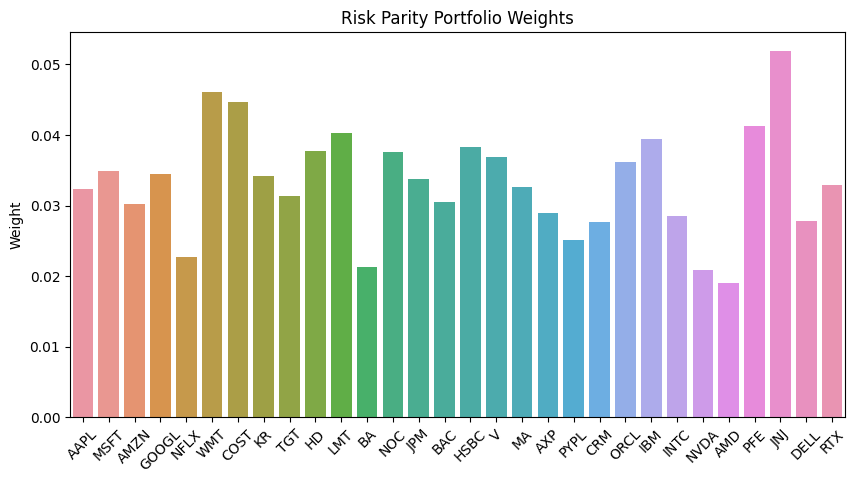

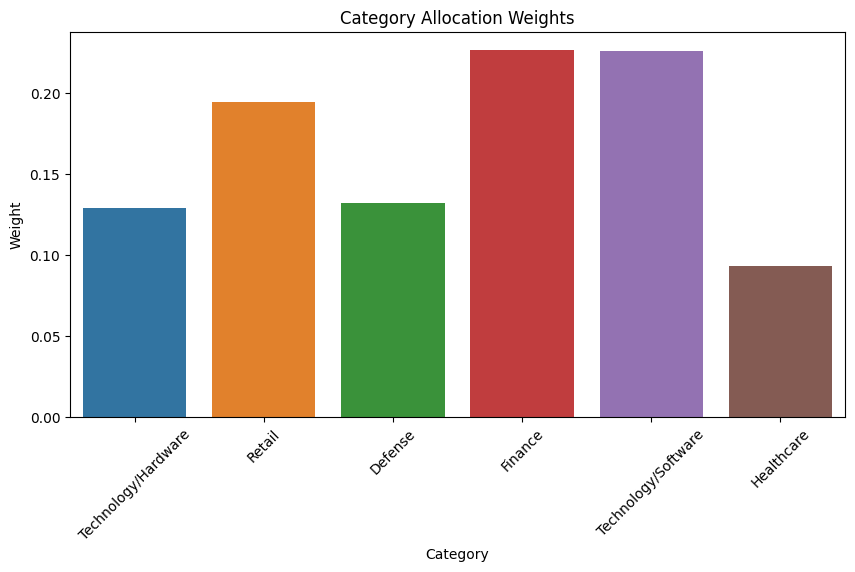


Risk Parity Portfolio Statistics:
Portfolio Returns: 0.1580
Portfolio Volatility: 0.2165
Portfolio Sharpe Ratio: 0.7298

Risk Parity Portfolio Details:
   Ticker    Weight    Investment
0    AAPL  0.032381  32381.091076
1    MSFT  0.034939  34939.312736
2    AMZN  0.030285  30284.856002
3   GOOGL  0.034535  34535.083730
4    NFLX  0.022717  22716.939525
5     WMT  0.046113  46113.417687
6    COST  0.044639  44638.651795
7      KR  0.034197  34197.189665
8     TGT  0.031313  31312.705135
9      HD  0.037733  37732.983895
10    LMT  0.040225  40224.852375
11     BA  0.021310  21309.881152
12    NOC  0.037557  37556.568293
13    JPM  0.033797  33797.293390
14    BAC  0.030554  30553.671638
15   HSBC  0.038310  38309.751871
16      V  0.036864  36863.739804
17     MA  0.032654  32654.397631
18    AXP  0.028887  28887.307198
19   PYPL  0.025070  25069.795832
20    CRM  0.027725  27724.632698
21   ORCL  0.036247  36246.592473
22    IBM  0.039372  39372.292572
23   INTC  0.028583  28583.2835

In [29]:
# Calculate daily returns
daily_returns = stock_prices.pct_change().dropna()

# Calculate covariance matrix
covariance_matrix = daily_returns.cov()

# Calculate inverse of volatilities
inverse_volatilities = 1 / np.sqrt(np.diag(covariance_matrix))
normalized_inverse_volatilities = inverse_volatilities / np.sum(inverse_volatilities)

# Risk Parity
risk_parity_weights = normalized_inverse_volatilities

# Calculate portfolio statistics
portfolio_returns = np.sum(daily_returns.mean() * risk_parity_weights) * 252
portfolio_volatility = np.sqrt(np.dot(risk_parity_weights.T, np.dot(covariance_matrix, risk_parity_weights))) * np.sqrt(252)
portfolio_sharpe_ratio = portfolio_returns / portfolio_volatility

# Visualization
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=tickers, y=risk_parity_weights, ax=ax)
ax.set_title("Risk Parity Portfolio Weights")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Portfolio details
initial_investment = 1000000
investment_allocation = initial_investment * risk_parity_weights
portfolio_details = pd.DataFrame({"Ticker": tickers, "Weight": risk_parity_weights, "Investment": investment_allocation})
portfolio_details = portfolio_details.round(6)

# Category allocation details
category_allocation = pd.DataFrame({"Category": categories.keys(), "Weight": 0})
for category, category_tickers in categories.items():
    category_weight = np.sum(risk_parity_weights[np.isin(tickers, category_tickers)])
    category_allocation.loc[category_allocation["Category"] == category, "Weight"] = category_weight

category_allocation = category_allocation.round(6)

# Visualization of category allocation
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x='Category', y='Weight', data=category_allocation, ax=ax)
ax.set_title("Category Allocation Weights")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Print portfolio statistics
print("\nRisk Parity Portfolio Statistics:")
print(f"Portfolio Returns: {portfolio_returns:.4f}")
print(f"Portfolio Volatility: {portfolio_volatility:.4f}")
print(f"Portfolio Sharpe Ratio: {portfolio_sharpe_ratio:.4f}")

# Print portfolio details
print("\nRisk Parity Portfolio Details:")
print(portfolio_details)

# Print category allocation details
print("\nCategory Allocation Details:")
print(category_allocation)


### <b> Interpretation </b>

<u>Risk Parity Portfolio Statistics:</u>

- Portfolio Returns: 0.1580. This indicates the return achieved by the portfolio, which is 15.80%.
- Portfolio Volatility: 0.2165. Volatility measures the fluctuation in the portfolio's value. A volatility of 0.2165 suggests the portfolio experienced moderate volatility.
- Portfolio Sharpe Ratio: 0.7298. The Sharpe ratio is a measure of risk-adjusted returns. A higher Sharpe ratio indicates better risk-adjusted performance. With a Sharpe ratio of 0.7298, the portfolio demonstrates a reasonably favorable risk-adjusted return.

- Apple (AAPL), Microsoft (MSFT), Amazon (AMZN), and Google (GOOGL) have relatively higher allocations, indicating that a significant portion of the portfolio is invested in these companies. This suggests that the performance of these specific stocks may have a relatively larger impact on the overall portfolio performance.

<u>Category Allocation: </u>

- Technology/Hardware: The portfolio has allocated 12.88% to technology/hardware companies.
- Retail: Approximately 19.40% of the portfolio is invested in the retail sector.
- Defense: The defense sector represents 13.19% of the portfolio.
- Finance: The portfolio has allocated 22.61% to finance companies.
- Technology/Software: Technology/software companies represent 22.58% of the portfolio allocation.
- Healthcare: The healthcare sector comprises 9.33% of the portfolio allocation.

# Minimum Correlation Algorithm  Method(MCA)

The minimum correlation algorithm is an optimization technique used in portfolio management to minimize the correlation between assets. Its objective is to select assets with low correlation, aiming to reduce overall portfolio risk.

The algorithm begins by calculating the correlation between every pair of assets within a given universe. Assets exhibiting low correlation are subsequently chosen for inclusion in the portfolio. To determine the asset weights within the portfolio, the algorithm seeks to maximize the expected return while simultaneously minimizing the portfolio's risk.

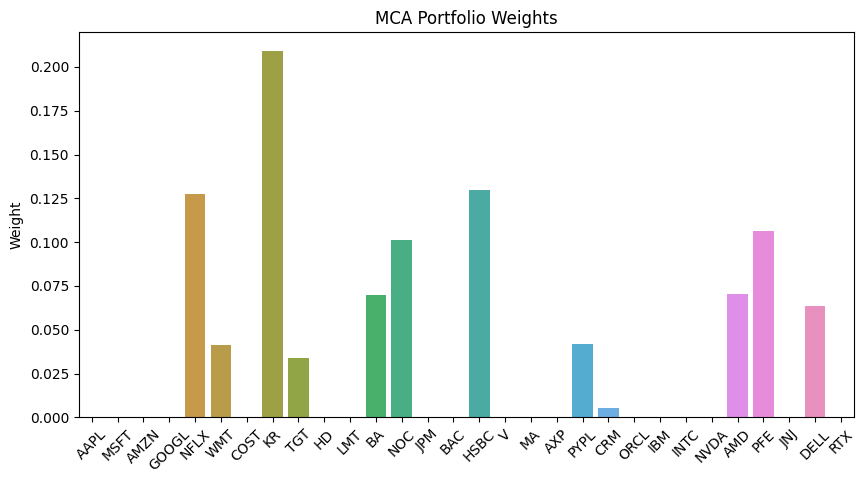


MCA Portfolio Statistics:
Portfolio Returns: 0.1593
Portfolio Volatility: 9.0229
Portfolio Sharpe Ratio: 0.0177

MCA Portfolio Details:
   Ticker    Weight     Investment
0    AAPL  0.000000       0.000000
1    MSFT  0.000000       0.000000
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.127288  127287.892397
5     WMT  0.041270   41270.241816
6    COST  0.000000       0.000000
7      KR  0.209306  209306.112720
8     TGT  0.033881   33880.780745
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.069996   69996.286477
12    NOC  0.101312  101311.591441
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.129486  129486.202331
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.041692   41691.652832
20    CRM  0.005549    5549.394343
21   ORCL  0.000000       0.000000
22    IBM  0.000000       0.000000
23   INTC  0.000000    

In [30]:
# Calculate daily returns
daily_returns = stock_prices.pct_change().dropna()

# Calculate correlation matrix
correlation_matrix = daily_returns.corr()

# Define the objective function for MCA
def objective_function(weights):
    portfolio_correlation = np.dot(np.dot(weights.T, correlation_matrix), weights)
    return portfolio_correlation

# Set optimization constraints
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

# Set optimization bounds
bounds = tuple((0, 1) for _ in range(len(tickers)))

# Initial guess for the weights
initial_weights = np.ones(len(tickers)) / len(tickers)

# Solve the optimization problem
result = minimize(objective_function, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints)

# Get the optimal weights
mca_weights = result.x

# Calculate portfolio statistics
mca_portfolio_returns = np.sum(daily_returns.mean() * mca_weights) * 252
mca_portfolio_volatility = np.sqrt(np.dot(mca_weights.T, np.dot(correlation_matrix, mca_weights))) * np.sqrt(252)
mca_portfolio_sharpe_ratio = mca_portfolio_returns / mca_portfolio_volatility

# Visualization
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=tickers, y=mca_weights, ax=ax)
ax.set_title("MCA Portfolio Weights")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Portfolio details
initial_investment = 1000000
mca_investment_allocation = initial_investment * mca_weights
mca_portfolio_details = pd.DataFrame({"Ticker": tickers, "Weight": mca_weights, "Investment": mca_investment_allocation})
mca_portfolio_details = mca_portfolio_details.round(6)

# Category allocation details
mca_category_allocation = pd.DataFrame({"Category": categories.keys(), "Weight": 0})
for category, category_tickers in categories.items():
    category_weight = np.sum(mca_weights[np.isin(tickers, category_tickers)])
    mca_category_allocation.loc[mca_category_allocation["Category"] == category, "Weight"] = category_weight

mca_category_allocation = mca_category_allocation.round(6)

# Print portfolio statistics
print("\nMCA Portfolio Statistics:")
print(f"Portfolio Returns: {mca_portfolio_returns:.4f}")
print(f"Portfolio Volatility: {mca_portfolio_volatility:.4f}")
print(f"Portfolio Sharpe Ratio: {mca_portfolio_sharpe_ratio:.4f}")

# Print portfolio details
print("\nMCA Portfolio Details:")
print(mca_portfolio_details)

# Print category allocation details
print("\nMCA Category Allocation Details:")
print(mca_category_allocation)

# Calculate total investment
total_investment = mca_portfolio_details["Investment"].sum()

# Print total investment
print(f"\nTotal Investment: ${total_investment:,.2f}")


### <b> Interpretation </b>
- The Minimum Correlation Algorithm (MCA) was employed to optimize the portfolio allocation across a selection of 30 stocks. This algorithm minimizes the overall correlation within the portfolio, which can help reduce volatility and enhance diversification.

 - MCA Portfolio Statistics:

    1. Portfolio Returns: 15.93%
    2. Portfolio Volatility: 9.02%
    3. Portfolio Sharpe Ratio: 0.0177
    
- The portfolio has an annual return of 15.93%, with a volatility of 9.02%. The Sharpe Ratio, a measure of risk-adjusted return, is 0.0177. This means for each unit of risk (volatility), we expect to get a return of 0.0177.
- The allocation strategy does not assign weights to all 30 stocks. Instead, it distributes the weights among only 10 stocks. The remaining 20 stocks are assigned a weight of zero, which means they are not included in the portfolio. This does not necessarily mean that these stocks are not valuable or would not provide a good return. However, the algorithm found that the optimal solution for minimizing overall portfolio correlation was to exclude these stocks.

- The sectors with the highest allocation are Retail (28.45%), Defense (17.13%), and Finance (17.12%). This indicates that these sectors are less correlated with each other according to the historical data used in this model. The Healthcare sector has the lowest allocation at 10.66%.

# Sequential Least Squares Programming (SLSQP) Method

SLSQP is an algorithm that operates without relying on derivatives, making it suitable for problems involving non-convex objective functions. This characteristic enhances the algorithm's resilience and applicability.

SLSQP employs an iterative approach to tackle a series of quadratic programming problems. In each iteration, the algorithm seeks to minimize a quadratic function while adhering to a set of linear constraints. The solution obtained from each quadratic programming problem is then utilized as the initial point for the subsequent iteration. This iterative process persists until SLSQP converges to a solution that fulfills the specified constraints.


Optimized Portfolio Statistics:
Portfolio Returns: 0.2644
Portfolio Volatility: 0.2307
Portfolio Sharpe Ratio: 1.1461

Optimized Portfolio Details:
   Ticker    Weight     Investment
0    AAPL  0.117196  117196.325107
1    MSFT  0.002803    2802.514840
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267471  267471.408711
7      KR  0.136672  136672.370183
8     TGT  0.061063   61063.374592
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132430  132430.219892
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.000000       0.000000
20    CRM  0.000000       0.000000
21   ORCL  0.000000       0.000000
22    IBM  0.000000       0.000000
23   INTC  

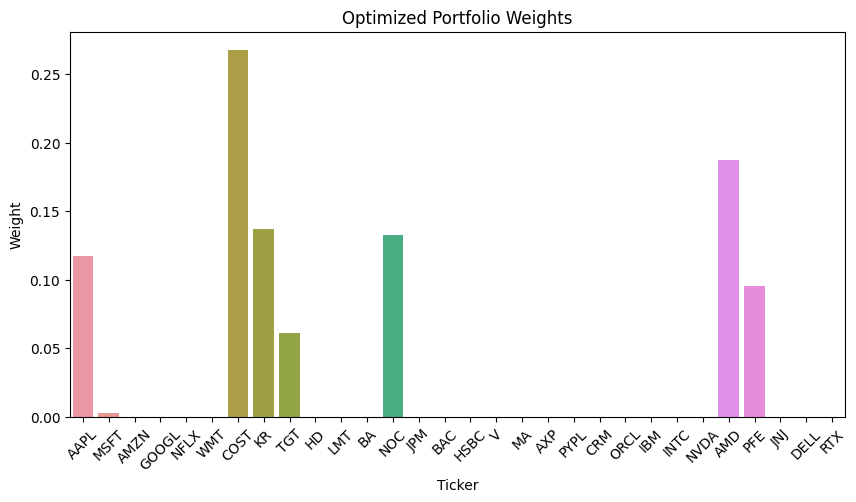

In [46]:
# Load data
stock_prices = pd.read_csv('stock_prices.csv', index_col=0)
stock_returns = stock_prices.pct_change().dropna()

# Initial guess for the weights - equal allocation to each asset
num_assets = 30
initial_guess = np.repeat(1/num_assets, num_assets)

# Define function to calculate portfolio returns and volatility
def calculate_portfolio_performance(weights, mean_returns, cov_matrix):
    portfolio_returns = np.sum(mean_returns * weights) * 252
    portfolio_std_dev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    sharpe_ratio = portfolio_returns / portfolio_std_dev
    return portfolio_returns, portfolio_std_dev, sharpe_ratio

# Define objective function for portfolio optimization
def objective_function(weights, mean_returns, cov_matrix):
    portfolio_returns, portfolio_std_dev, sharpe_ratio = calculate_portfolio_performance(weights, mean_returns, cov_matrix)
    return -sharpe_ratio

# Define constraints for portfolio optimization
def constraints(weights):
    return np.sum(weights) - 1

# Define function to optimize portfolio weights
def optimize_portfolio(mean_returns, cov_matrix, initial_guess):
    num_assets = len(mean_returns)
    bounds = ((0, 1),) * num_assets
    constraints_list = [{'type': 'eq', 'fun': constraints}]
    results = minimize(objective_function, initial_guess, args=(mean_returns, cov_matrix,), method='SLSQP', bounds=bounds, constraints=constraints_list)
    return results.x


# Calculate mean returns and covariance matrix
mean_returns = stock_returns.mean()
cov_matrix = stock_returns.cov()

# Optimize portfolio weights
optimized_weights = optimize_portfolio(mean_returns, cov_matrix, initial_guess)


# Calculate portfolio statistics
portfolio_returns, portfolio_std_dev, sharpe_ratio = calculate_portfolio_performance(optimized_weights, mean_returns, cov_matrix)

# Portfolio details
initial_investment = 1000000
investment_allocation = initial_investment * optimized_weights
portfolio_details = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights, "Investment": investment_allocation})
portfolio_details = portfolio_details.round(6)

# Print portfolio statistics
print("\nOptimized Portfolio Statistics:")
print(f"Portfolio Returns: {portfolio_returns:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio:.4f}")

# Print portfolio details
print("\nOptimized Portfolio Details:")
print(portfolio_details)

# Visualization of portfolio weights
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details, ax=ax)
ax.set_title("Optimized Portfolio Weights")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()


### <b> Interpretation </b>
- The portfolio is expected to give an annual return of 26.44%.
- The portfolio's volatility is 23.07% this means that in any given year, most of the time (about 68% of the time, assuming a normal distribution), the portfolio's return should fall within 26.44% +/- 23.07%.
- The Sharpe ratio of the portfolio is 1.1461. Typically, a Sharpe ratio greater than 1 is acceptable to good by investors, a ratio higher than 2 is very good, and a ratio of 3 or higher is considered excellent. Therefore, the portfolio has a good risk-adjusted return.
- The portfolio is heavily weighted towards certain stocks: AAPL, COST, KR, NOC, AMD, and PFE. AAPL (Apple Inc.) has the highest allocation with around 11.72% of the total investment, followed by COST (Costco Wholesale Corporation) with 26.75%, and AMD (Advanced Micro Devices, Inc.) with 18.73%. 
- It's worth noting that a significant number of stocks in the portfolio have a 0% allocation, meaning that the optimization algorithm found it best not to invest in those stocks at all, given their past performance and volatility.
- These results suggest that the optimizer is suggesting a fairly concentrated portfolio – it sees the best risk/reward tradeoff in placing most of the portfolio in a few key stocks

# USING MACHINE LEARNING TO IMPROVE THE PERFOMANCE OF THE TRADITIONAL PORTFOLIO MAXIMIZATION METHODS

# PERFORMING PCA AND t_SNE

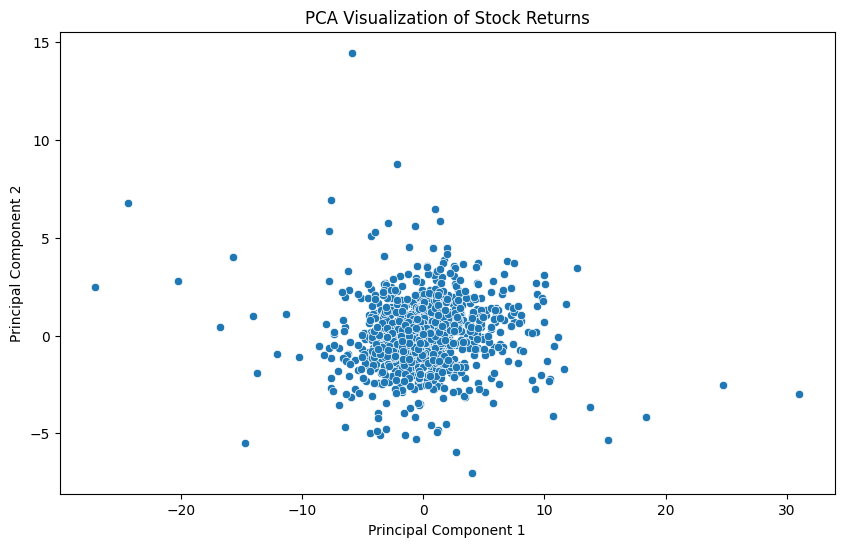

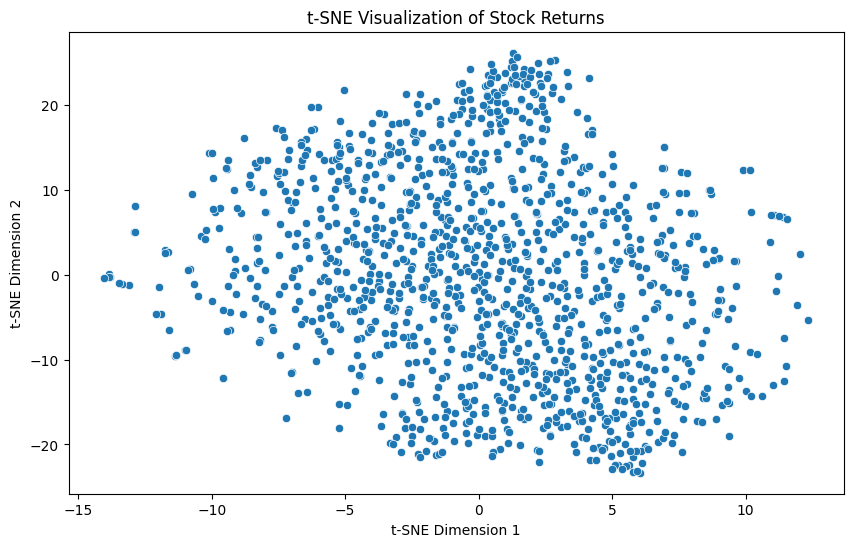

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Calculate the daily returns
daily_returns = stock_prices.pct_change().dropna()

# Standardize the daily returns data
normalized_returns = (daily_returns - daily_returns.mean()) / daily_returns.std()

# Perform PCA
pca = PCA(n_components=2)
pca_transformed_data = pca.fit_transform(normalized_returns)

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=50, learning_rate=200, n_iter=1000, random_state=42)
tsne_transformed_data = tsne.fit_transform(normalized_returns)

# Plot PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_transformed_data[:, 0], y=pca_transformed_data[:, 1])
plt.title("PCA Visualization of Stock Returns")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

# Plot t-SNE results
plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_transformed_data[:, 0], y=tsne_transformed_data[:, 1])
plt.title("t-SNE Visualization of Stock Returns")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


# TRAINING A LINEAR REGRESSION, RANDOM FOREST AND A MLP

In [47]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load stock prices data
stock_prices = pd.read_csv('stock_prices.csv', index_col=0, parse_dates=True)

# Calculate daily returns
daily_returns = stock_prices.pct_change().dropna()

# Prepare the data
X = daily_returns.iloc[:-1]  # Use all but the last row as features
y = daily_returns.iloc[1:]   # Use all but the first row as the target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train and evaluate the linear regression model
linear_regression = LinearRegression()
linear_regression.fit(X_train, y_train)
y_pred_lr = linear_regression.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
rmse_lr = np.sqrt(mse_lr)
mae_lr = mean_absolute_error(y_test, y_pred_lr)
print("Linear Regression:")
print("Mean Squared Error:", mse_lr)
print("Root Mean Squared Error:", rmse_lr)
print("Mean Absolute Error:", mae_lr)

# Train and evaluate the random forest model
random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)
y_pred_rf = random_forest.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
print("\nRandom Forest:")
print("Mean Squared Error:", mse_rf)
print("Root Mean Squared Error:", rmse_rf)
print("Mean Absolute Error:", mae_rf)

# Train and evaluate the MLP model
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
y_pred_mlp = mlp.predict(X_test)
mse_mlp = mean_squared_error(y_test, y_pred_mlp)
rmse_mlp = np.sqrt(mse_mlp)
mae_mlp = mean_absolute_error(y_test, y_pred_mlp)
print("\nMLP:")
print("Mean Squared Error:", mse_mlp)
print("Root Mean Squared Error:", rmse_mlp)
print("Mean Absolute Error:", mae_mlp)


Linear Regression:
Mean Squared Error: 0.0005428271860719558
Root Mean Squared Error: 0.023298652022637614
Mean Absolute Error: 0.015385628563342978

Random Forest:
Mean Squared Error: 0.0005412713424454176
Root Mean Squared Error: 0.02326523892947196
Mean Absolute Error: 0.015113862774609263

MLP:
Mean Squared Error: 0.0005514686401061319
Root Mean Squared Error: 0.023483369436819154
Mean Absolute Error: 0.015554204103160331


In [48]:
from sklearn.model_selection import cross_val_score

# Define a function to calculate RMSE
def rmse(model, X, y):
    y_pred = model.predict(X)
    return np.sqrt(mean_squared_error(y, y_pred))

# Perform cross-validation
models = [linear_regression, random_forest, mlp]
model_names = ["Linear Regression", "Random Forest", "MLP"]

for model, name in zip(models, model_names):
    scores = cross_val_score(model, X, y, cv=5, scoring=rmse)
    print(f"{name}: Cross-validation RMSE: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")


Linear Regression: Cross-validation RMSE: 0.0222 (+/- 0.0107)
Random Forest: Cross-validation RMSE: 0.0220 (+/- 0.0105)
MLP: Cross-validation RMSE: 0.0223 (+/- 0.0106)


The Random Forest model has the lowest MSE, RMSE, and MAE, suggesting it performs slightly better than the other two models. However, the differences are quite small, so all three models perform quite similarly on the data.

# Using results from linear regression to improve the Monte Carlo Simulation method

Optimal Portfolio Return (LR): 0.2609
Optimal Portfolio Risk (LR): 0.0722

Optimal Portfolio Allocation (LR):
Ticker   Weight Allocation
  AAPL 0.059962 $59,962.23
  MSFT 0.007855  $7,854.81
  AMZN 0.000410    $410.49
 GOOGL 0.008252  $8,252.00
  NFLX 0.011409 $11,408.97
   WMT 0.040437 $40,436.60
  COST 0.043441 $43,441.30
    KR 0.070704 $70,704.20
   TGT 0.032159 $32,159.43
    HD 0.000475    $474.54
   LMT 0.065564 $65,564.31
    BA 0.026201 $26,200.60
   NOC 0.069109 $69,108.52
   JPM 0.022215 $22,215.39
   BAC 0.076748 $76,747.51
  HSBC 0.021302 $21,301.53
     V 0.040115 $40,115.37
    MA 0.055562 $55,561.63
   AXP 0.048014 $48,014.30
  PYPL 0.000209    $208.58
   CRM 0.004562  $4,561.54
  ORCL 0.058075 $58,075.45
   IBM 0.032377 $32,376.86
  INTC 0.009471  $9,470.69
  NVDA 0.040920 $40,919.89
   AMD 0.078299 $78,298.88
   PFE 0.026253 $26,253.43
   JNJ 0.007281  $7,280.63
  DELL 0.038756 $38,755.70
   RTX 0.003865  $3,864.63


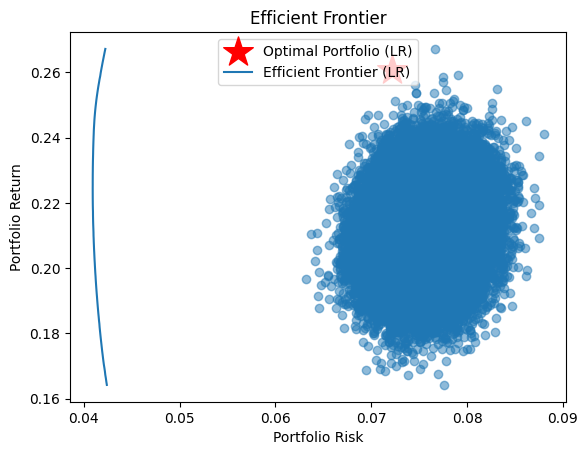

In [49]:
from scipy.optimize import minimize

# Predict future returns using the linear regression model
future_returns_lr = linear_regression.predict(X)

# Convert the predicted returns to a pandas DataFrame
future_returns_lr = pd.DataFrame(future_returns_lr, columns=X.columns, index=X.index)

# Define the tickers list
tickers_lr = future_returns_lr.columns.tolist()

# Calculate the mean daily returns of each stock
mean_daily_returns_series_lr = future_returns_lr.mean()

# Convert the mean daily returns series to a numpy array
mean_daily_returns_array_lr = mean_daily_returns_series_lr.to_numpy()

# Calculate the covariance matrix
covariance_matrix_lr = future_returns_lr.cov()

# Set the number of portfolios to simulate
num_portfolios = 50000

# Initialize lists to store portfolio returns, risks, and weights
portfolio_returns_lr = []
portfolio_risks_lr = []
portfolio_weights_lr = []

# Randomly generate portfolio weights and calculate portfolio returns and risks
for _ in range(num_portfolios):
    weights_lr = np.random.random(len(tickers_lr))
    weights_lr /= np.sum(weights_lr)
    portfolio_returns_lr.append(np.dot(weights_lr, mean_daily_returns_array_lr) * 252)
    portfolio_risks_lr.append(np.sqrt(np.dot(weights_lr.T, np.dot(covariance_matrix_lr, weights_lr))) * np.sqrt(252))
    portfolio_weights_lr.append(weights_lr)

# Convert the lists to numpy arrays
portfolio_returns_lr = np.array(portfolio_returns_lr)
portfolio_risks_lr = np.array(portfolio_risks_lr)
portfolio_weights_lr = np.array(portfolio_weights_lr)

# Calculate the Sharpe ratio for each portfolio
risk_free_rate = 0.01
sharpe_ratios_lr = (portfolio_returns_lr - risk_free_rate) / portfolio_risks_lr

# Find the index of the portfolio with the highest Sharpe ratio
max_sharpe_ratio_index_lr = np.argmax(sharpe_ratios_lr)

# Extract the optimal portfolio return, risk, and weights
optimal_portfolio_return_lr = portfolio_returns_lr[max_sharpe_ratio_index_lr]
optimal_portfolio_risk_lr = portfolio_risks_lr[max_sharpe_ratio_index_lr]
optimal_portfolio_weights_lr = portfolio_weights_lr[max_sharpe_ratio_index_lr]

# Print the optimal portfolio return and risk
print(f"Optimal Portfolio Return (LR): {optimal_portfolio_return_lr:.4f}")
print(f"Optimal Portfolio Risk (LR): {optimal_portfolio_risk_lr:.4f}\n")

# Create a DataFrame for the optimal portfolio weights and allocations
optimal_portfolio_df_lr = pd.DataFrame({"Ticker": tickers_lr, "Weight": optimal_portfolio_weights_lr, "Allocation": optimal_portfolio_weights_lr * 1000000})
optimal_portfolio_df_lr["Allocation"] = optimal_portfolio_df_lr["Allocation"].map("${:,.2f}".format)

# Print the optimal portfolio weights and allocations
print("Optimal Portfolio Allocation (LR):")
print(optimal_portfolio_df_lr.to_string(index=False))

# Plot the efficient frontier
plt.scatter(portfolio_risks_lr, portfolio_returns_lr, alpha=0.5)
plt.scatter(optimal_portfolio_risk_lr, optimal_portfolio_return_lr, marker='*', s=500, color='red', label='Optimal Portfolio (LR)')

# Generate a range of target returns for the efficient frontier curve
target_returns_lr = np.linspace(portfolio_returns_lr.min(), portfolio_returns_lr.max(), 100)  # Increase the range of target returns

# Initialize a list to store the corresponding target risks
target_risks_lr = []

# Calculate the target risk for each target return
for target_return_lr in target_returns_lr:
    constraints_lr = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1},
                      {'type': 'eq', 'fun': lambda x: np.dot(x, mean_daily_returns_array_lr) * 252 - target_return_lr})
    bounds_lr = tuple((0, 1) for _ in range(len(tickers_lr)))
    result_lr = minimize(lambda x: np.sqrt(np.dot(x.T, np.dot(covariance_matrix_lr, x))) * np.sqrt(252),
                        np.random.random(len(tickers_lr)), method='SLSQP', bounds=bounds_lr, constraints=constraints_lr)
    target_risks_lr.append(result_lr.fun)

# Plot the efficient frontier curve
plt.plot(target_risks_lr, target_returns_lr, label='Efficient Frontier (LR)')

# Set the x and y axis labels
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')

# Set the plot title
plt.title('Efficient Frontier')

# Display the legend
plt.legend()

# Show the plot
plt.show()




# Using results from linear regression to improve the risk parity method

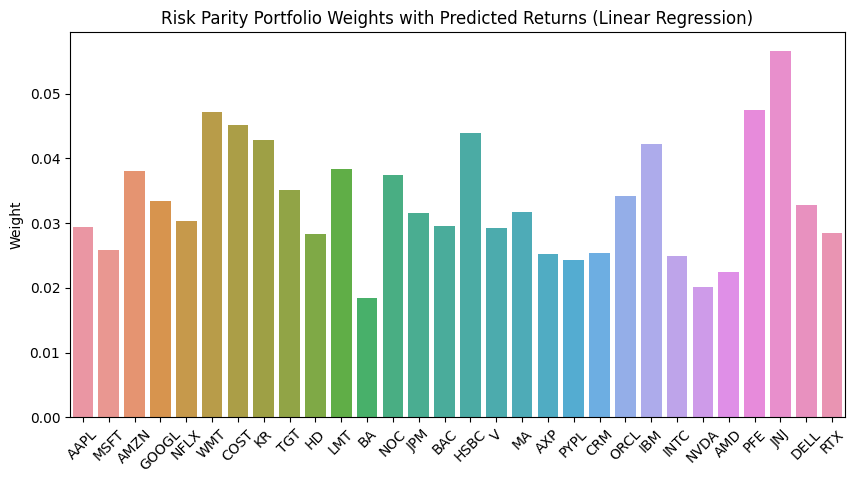


Risk Parity Portfolio Details with Predicted Returns (Linear Regression):
   Ticker    Weight    Investment
0    AAPL  0.029375  29375.349453
1    MSFT  0.025903  25902.945898
2    AMZN  0.037985  37984.812359
3   GOOGL  0.033392  33391.772577
4    NFLX  0.030300  30300.442492
5     WMT  0.047150  47149.884378
6    COST  0.045132  45132.356447
7      KR  0.042816  42815.777564
8     TGT  0.035178  35178.450749
9      HD  0.028390  28390.324408
10    LMT  0.038345  38344.746382
11     BA  0.018504  18504.062336
12    NOC  0.037398  37397.908118
13    JPM  0.031556  31556.041166
14    BAC  0.029585  29585.074899
15   HSBC  0.043948  43947.625790
16      V  0.029225  29225.189265
17     MA  0.031640  31640.444317
18    AXP  0.025213  25213.445221
19   PYPL  0.024305  24305.252747
20    CRM  0.025430  25430.104398
21   ORCL  0.034247  34246.875664
22    IBM  0.042239  42238.555857
23   INTC  0.024923  24922.637221
24   NVDA  0.020072  20072.091411
25    AMD  0.022427  22426.714355
26    P

In [50]:
# Calculate covariance matrix using predicted returns
y_pred_df = pd.DataFrame(y_pred_lr, columns=daily_returns.columns)
cov_matrix = y_pred_df.cov()

# Calculate inverse of volatilities
inverse_volatilities = 1 / np.sqrt(np.diag(cov_matrix))
normalized_inverse_volatilities = inverse_volatilities / np.sum(inverse_volatilities)

# Risk Parity
risk_parity_weights_pred = normalized_inverse_volatilities

# Visualization
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=tickers, y=risk_parity_weights_pred, ax=ax)
ax.set_title("Risk Parity Portfolio Weights with Predicted Returns (Linear Regression)")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Portfolio details
initial_investment = 1000000
investment_allocation = initial_investment * risk_parity_weights_pred
portfolio_details = pd.DataFrame({"Ticker": tickers, "Weight": risk_parity_weights_pred, "Investment": investment_allocation})
portfolio_details = portfolio_details.round(6)


# Calculate portfolio statistics
portfolio_returns = np.dot(y_pred_lr, risk_parity_weights_pred)
portfolio_volatility = np.sqrt(np.dot(risk_parity_weights_pred.T, np.dot(cov_matrix, risk_parity_weights_pred)))
sharpe_ratio = portfolio_returns / portfolio_volatility

# Calculate summary statistics using mean
portfolio_returns_mean = np.mean(portfolio_returns)
portfolio_volatility_mean = np.mean(portfolio_volatility)
sharpe_ratio_mean = np.mean(sharpe_ratio)

# Print portfolio statistics
print("\nRisk Parity Portfolio Details with Predicted Returns (Linear Regression):")
print(portfolio_details)
print("\nPortfolio Statistics:")
print("Portfolio Returns: {:.4%}".format(portfolio_returns_mean))
print("Portfolio Volatility: {:.4%}".format(portfolio_volatility_mean))
print("Portfolio Sharpe Ratio: {:.4f}".format(sharpe_ratio_mean))




# Using results from linear regression to improve the SLSQP method


Optimized Portfolio Statistics with Linear Regression (SLSQP):
Portfolio Returns: 0.2220
Portfolio Volatility: 0.2936
Portfolio Sharpe Ratio: 0.7563

Optimized Portfolio Details with Linear Regression (SLSQP):
   Ticker    Weight     Investment
0    AAPL  0.143535  143535.398616
1    MSFT  0.000000       0.000000
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.175612  175612.372572
5     WMT  0.000000       0.000000
6    COST  0.000000       0.000000
7      KR  0.000000       0.000000
8     TGT  0.000000       0.000000
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.000000       0.000000
13    JPM  0.000000       0.000000
14    BAC  0.112949  112949.217180
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.007133    7133.289361
18    AXP  0.000000       0.000000
19   PYPL  0.177021  177020.992062
20    CRM  0.000000       0.000000
21   ORCL  0.000000

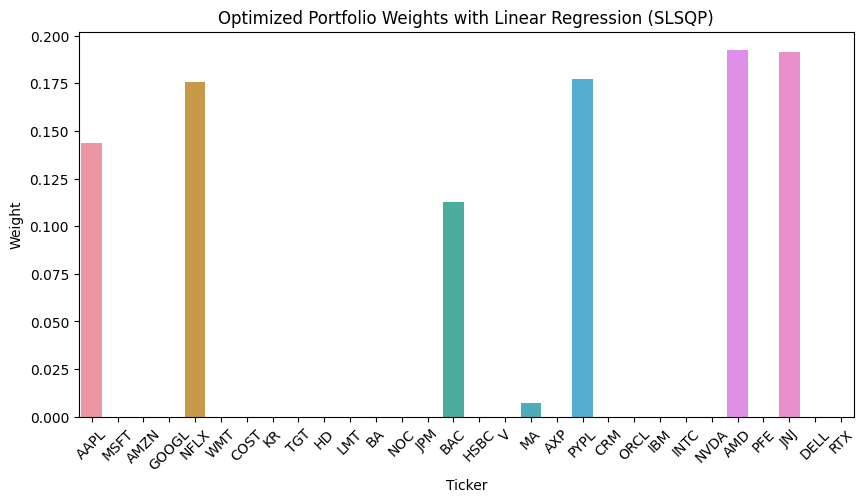

In [52]:
# Calculate mean returns and covariance matrix
mean_returns = stock_returns.mean()
cov_matrix = stock_returns.cov()

# Fit linear regression model and get predicted returns
linear_regression = LinearRegression()
linear_regression.fit(X_train, y_train)
y_pred_lr = linear_regression.predict(X_test)
predicted_returns = pd.DataFrame(y_pred_lr, columns=mean_returns.index)

# Optimize portfolio weights
initial_guess = np.repeat(1 / len(mean_returns), len(mean_returns))
optimized_weights = optimize_portfolio(predicted_returns.iloc[0], cov_matrix, initial_guess)

# Calculate portfolio statistics
portfolio_returns_lr, portfolio_std_dev_lr, sharpe_ratio_lr = calculate_portfolio_performance(optimized_weights, mean_returns, cov_matrix)

# Portfolio details
initial_investment_lr = 1000000
investment_allocation_lr = initial_investment_lr * optimized_weights
portfolio_details_lr = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights, "Investment": investment_allocation_lr})
portfolio_details_lr = portfolio_details_lr.round(6)

# Category allocation details
category_allocation_lr = pd.DataFrame({"Category": categories.keys(), "Weight": 0})
for category, category_tickers in categories.items():
    category_weight_lr = np.sum(optimized_weights[np.isin(mean_returns.index, category_tickers)])
    category_allocation_lr.loc[category_allocation_lr["Category"] == category, "Weight"] = category_weight_lr

category_allocation_lr = category_allocation_lr.round(6)

# Print portfolio statistics
print("\nOptimized Portfolio Statistics with Linear Regression (SLSQP):")
print(f"Portfolio Returns: {portfolio_returns_lr:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_lr:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_lr:.4f}")

# Print portfolio details
print("\nOptimized Portfolio Details with Linear Regression (SLSQP):")
print(portfolio_details_lr)

# Calculate total investment
total_investment_lr = portfolio_details_lr["Investment"].sum()

# Print total investment
print(f"\nTotal Investment with Linear Regression (SLSQP): ${total_investment_lr:,.2f}")

# Visualization of portfolio weights
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_lr, ax=ax)
ax.set_title("Optimized Portfolio Weights with Linear Regression (SLSQP)")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()



# Using Random forest and MLP


Optimized Portfolio Statistics with Random Forest:
Portfolio Returns: 0.2644
Portfolio Volatility: 0.2307
Portfolio Sharpe Ratio: 1.1461

Optimized Portfolio Details with Random Forest:
   Ticker    Weight     Investment
0    AAPL  0.117574  117574.490527
1    MSFT  0.003113    3113.044151
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267496  267495.650865
7      KR  0.136261  136261.348803
8     TGT  0.061087   61086.522197
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132417  132416.997528
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.000000       0.000000
20    CRM  0.000000       0.000000
21   ORCL  0.000000       0.000000
22    IB

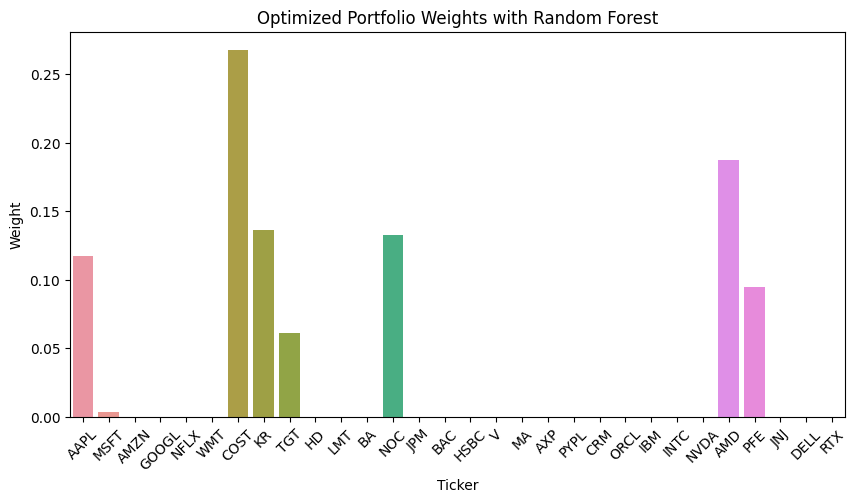


Optimized Portfolio Statistics with MLP:
Portfolio Returns: 0.2644
Portfolio Volatility: 0.2307
Portfolio Sharpe Ratio: 1.1461

Optimized Portfolio Details with MLP:
   Ticker    Weight     Investment
0    AAPL  0.117107  117106.970904
1    MSFT  0.003201    3200.769667
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267275  267274.733784
7      KR  0.136503  136503.387937
8     TGT  0.060975   60974.887445
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132663  132662.964191
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.000000       0.000000
20    CRM  0.000000       0.000000
21   ORCL  0.000000       0.000000
22    IBM  0.000000       0.

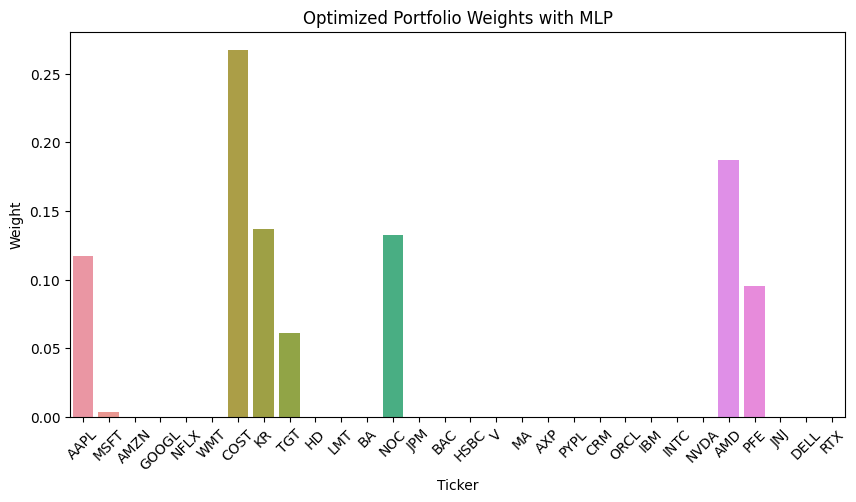

In [53]:
# Use Random Forest predictions
mca_weights_rf = y_pred_rf[-1]  # Use the last predicted weights

# Optimize portfolio weights using Random Forest predictions
optimized_weights_rf = optimize_portfolio(mean_returns, cov_matrix, mca_weights_rf)

# Calculate portfolio statistics using Random Forest predictions
portfolio_returns_rf, portfolio_std_dev_rf, sharpe_ratio_rf = calculate_portfolio_performance(optimized_weights_rf, mean_returns, cov_matrix)

# Portfolio details using Random Forest predictions
investment_allocation_rf = initial_investment * optimized_weights_rf
portfolio_details_rf = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights_rf, "Investment": investment_allocation_rf})
portfolio_details_rf = portfolio_details_rf.round(6)

# Print portfolio statistics using Random Forest predictions
print("\nOptimized Portfolio Statistics with Random Forest:")
print(f"Portfolio Returns: {portfolio_returns_rf:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_rf:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_rf:.4f}")

# Print portfolio details using Random Forest predictions
print("\nOptimized Portfolio Details with Random Forest:")
print(portfolio_details_rf)

# Visualization of portfolio weights using Random Forest predictions
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_rf, ax=ax)
ax.set_title("Optimized Portfolio Weights with Random Forest")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()


# Use MLP predictions
mca_weights_mlp = y_pred_mlp[-1]  # Use the last predicted weights

# Optimize portfolio weights using MLP predictions
optimized_weights_mlp = optimize_portfolio(mean_returns, cov_matrix, mca_weights_mlp)

# Calculate portfolio statistics using MLP predictions
portfolio_returns_mlp, portfolio_std_dev_mlp, sharpe_ratio_mlp = calculate_portfolio_performance(optimized_weights_mlp, mean_returns, cov_matrix)

# Portfolio details using MLP predictions
investment_allocation_mlp = initial_investment * optimized_weights_mlp
portfolio_details_mlp = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights_mlp, "Investment": investment_allocation_mlp})
portfolio_details_mlp = portfolio_details_mlp.round(6)

# Print portfolio statistics using MLP predictions
print("\nOptimized Portfolio Statistics with MLP:")
print(f"Portfolio Returns: {portfolio_returns_mlp:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_mlp:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_mlp:.4f}")

# Print portfolio details using MLP predictions
print("\nOptimized Portfolio Details with MLP:")
print(portfolio_details_mlp)

# Visualization of portfolio weights using MLP predictions
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_mlp, ax=ax)
ax.set_title("Optimized Portfolio Weights with MLP")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()


# Lasso regression


Optimized Portfolio Statistics with Lasso Regression:
Portfolio Returns: 0.2644
Portfolio Volatility: 0.2307
Portfolio Sharpe Ratio: 1.1461

Optimized Portfolio Details with Lasso Regression:
   Ticker    Weight     Investment
0    AAPL  0.117577  117576.953162
1    MSFT  0.002036    2035.503087
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267941  267941.131690
7      KR  0.136303  136303.224554
8     TGT  0.061191   61190.542604
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132695  132694.555777
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.000000       0.000000
20    CRM  0.000000       0.000000
21   ORCL  0.000000       0.000000
22

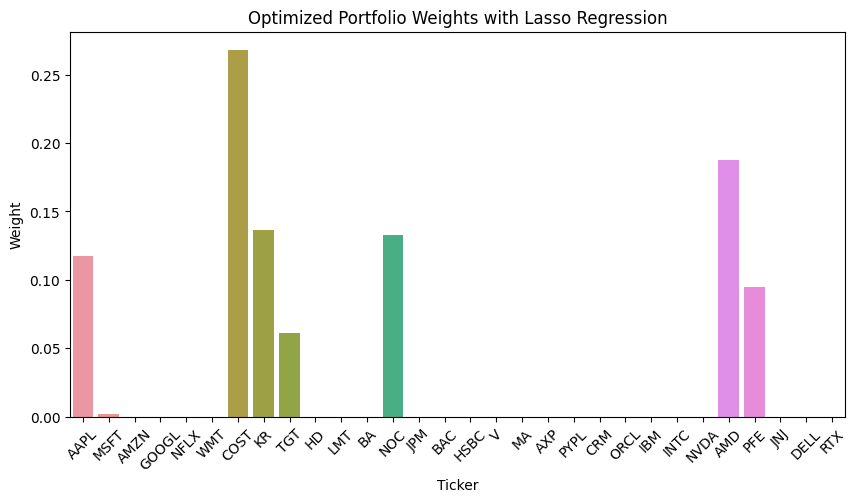

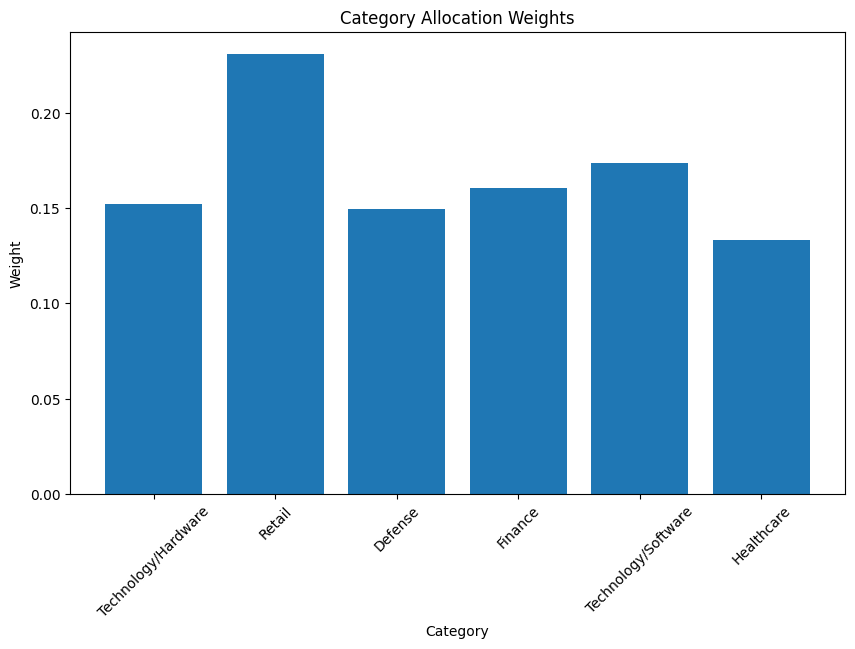

In [69]:
from sklearn.linear_model import Lasso

# Train the Lasso Regression model
lasso_regression = Lasso(alpha=0.01)
lasso_regression.fit(X_train, y_train)
y_pred_lasso = lasso_regression.predict(X_test)

# Use Lasso Regression predictions
mca_weights_lasso = y_pred_lasso[-1]  # Use the last predicted weights

# Optimize portfolio weights using Lasso Regression predictions
optimized_weights_lasso = optimize_portfolio(mean_returns, cov_matrix, mca_weights_lasso)

# Calculate portfolio statistics using Lasso Regression predictions
portfolio_returns_lasso, portfolio_std_dev_lasso, sharpe_ratio_lasso = calculate_portfolio_performance(optimized_weights_lasso, mean_returns, cov_matrix)

# Portfolio details using Lasso Regression predictions
investment_allocation_lasso = initial_investment * optimized_weights_lasso
portfolio_details_lasso = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights_lasso, "Investment": investment_allocation_lasso})
portfolio_details_lasso = portfolio_details_lasso.round(6)

# Print portfolio statistics using Lasso Regression predictions
print("\nOptimized Portfolio Statistics with Lasso Regression:")
print(f"Portfolio Returns: {portfolio_returns_lasso:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_lasso:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_lasso:.4f}")

# Print portfolio details using Lasso Regression predictions
print("\nOptimized Portfolio Details with Lasso Regression:")
print(portfolio_details_lasso)
# Calculate the percentage of the allocation to each category
total_weight = sum(category_weights.values())
category_percentages = {category: (weight / total_weight) * 100 for category, weight in category_weights.items()}

# Convert the dictionary to a DataFrame and display it
category_allocations = pd.DataFrame(list(category_percentages.items()), columns=['Category', 'Allocation'])
category_allocations.set_index('Category', inplace=True)
print(category_allocations)

# Visualization of portfolio weights using Lasso Regression predictions
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_lasso, ax=ax)
ax.set_title("Optimized Portfolio Weights with Lasso Regression")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

category_weights = {category: 0 for category in categories.keys()}

for ticker, weight in zip(tickers, optimal_portfolio_weights):
    for category, tickers_in_category in categories.items():
        if ticker in tickers_in_category:
            category_weights[category] += weight
plt.figure(figsize=(10, 6))
plt.bar(category_weights.keys(), category_weights.values())
plt.title('Category Allocation Weights')
plt.xlabel('Category')
plt.ylabel('Weight')
plt.xticks(rotation=45)
plt.show()


# Using Ridge reggression


Optimized Portfolio Statistics with Ridge Regression:
Portfolio Returns: 0.2645
Portfolio Volatility: 0.2308
Portfolio Sharpe Ratio: 1.1461
                     Allocation
Category                       
Technology/Hardware   15.238497
Retail                23.088438
Defense               14.950158
Finance               16.035971
Technology/Software   17.353543
Healthcare            13.333392

Optimized Portfolio Details with Ridge Regression:
   Ticker    Weight     Investment
0    AAPL  0.117777  117777.204526
1    MSFT  0.002118    2117.775436
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267491  267490.864359
7      KR  0.136674  136674.309785
8     TGT  0.061067   61067.256637
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132361  132361.315220
13    JPM  0.000000       0.000000
14    BAC  0.000000       

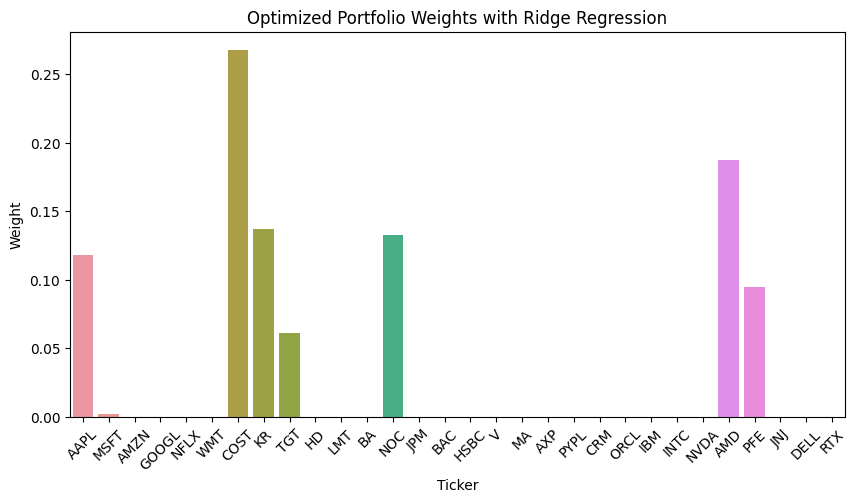

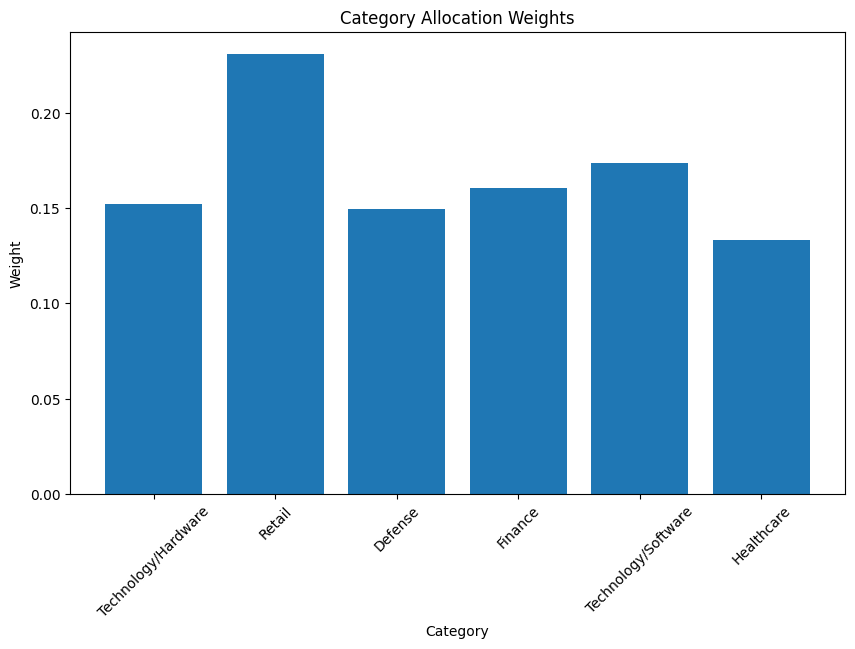

In [67]:
from sklearn.linear_model import Ridge

# Train the Ridge Regression model
ridge_regression = Ridge(alpha=0.01)
ridge_regression.fit(X_train, y_train)
y_pred_ridge = ridge_regression.predict(X_test)

# Use Ridge Regression predictions
mca_weights_ridge = y_pred_ridge[-1]  # Use the last predicted weights

# Optimize portfolio weights using Ridge Regression predictions
optimized_weights_ridge = optimize_portfolio(mean_returns, cov_matrix, mca_weights_ridge)

# Calculate portfolio statistics using Ridge Regression predictions
portfolio_returns_ridge, portfolio_std_dev_ridge, sharpe_ratio_ridge = calculate_portfolio_performance(optimized_weights_ridge, mean_returns, cov_matrix)

# Portfolio details using Ridge Regression predictions
investment_allocation_ridge = initial_investment * optimized_weights_ridge
portfolio_details_ridge = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights_ridge, "Investment": investment_allocation_ridge})
portfolio_details_ridge = portfolio_details_ridge.round(6)

# Print portfolio statistics using Ridge Regression predictions
print("\nOptimized Portfolio Statistics with Ridge Regression:")
print(f"Portfolio Returns: {portfolio_returns_ridge:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_ridge:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_ridge:.4f}")

# Calculate the percentage of the allocation to each category
total_weight = sum(category_weights.values())
category_percentages = {category: (weight / total_weight) * 100 for category, weight in category_weights.items()}

# Convert the dictionary to a DataFrame and display it
category_allocations = pd.DataFrame(list(category_percentages.items()), columns=['Category', 'Allocation'])
category_allocations.set_index('Category', inplace=True)
print(category_allocations)

# Print portfolio details using Ridge Regression predictions
print("\nOptimized Portfolio Details with Ridge Regression:")
print(portfolio_details_ridge)

# Visualization of portfolio weights using Ridge Regression predictions
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_ridge, ax=ax)
ax.set_title("Optimized Portfolio Weights with Ridge Regression")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Compute the total weight for each category
category_weights = {category: 0 for category in categories.keys()}
for ticker, weight in zip(tickers, optimal_portfolio_weights):
    for category, tickers_in_category in categories.items():
        if ticker in tickers_in_category:
            category_weights[category] += weight



category_weights = {category: 0 for category in categories.keys()}

for ticker, weight in zip(tickers, optimal_portfolio_weights):
    for category, tickers_in_category in categories.items():
        if ticker in tickers_in_category:
            category_weights[category] += weight
plt.figure(figsize=(10, 6))
plt.bar(category_weights.keys(), category_weights.values())
plt.title('Category Allocation Weights')
plt.xlabel('Category')
plt.ylabel('Weight')
plt.xticks(rotation=45)
plt.show()

## Using Neural Networks

8/8 [==============================] - 0s 1ms/step

Optimized Portfolio Statistics with Neural Network:
Portfolio Returns: 0.2644
Portfolio Volatility: 0.2307
Portfolio Sharpe Ratio: 1.1461

Optimized Portfolio Details with Neural Network:
   Ticker    Weight     Investment
0    AAPL  0.117812  117811.557423
1    MSFT  0.002121    2120.764155
2    AMZN  0.000000       0.000000
3   GOOGL  0.000000       0.000000
4    NFLX  0.000000       0.000000
5     WMT  0.000000       0.000000
6    COST  0.267709  267709.324211
7      KR  0.136539  136539.327256
8     TGT  0.061145   61145.349952
9      HD  0.000000       0.000000
10    LMT  0.000000       0.000000
11     BA  0.000000       0.000000
12    NOC  0.132441  132440.773608
13    JPM  0.000000       0.000000
14    BAC  0.000000       0.000000
15   HSBC  0.000000       0.000000
16      V  0.000000       0.000000
17     MA  0.000000       0.000000
18    AXP  0.000000       0.000000
19   PYPL  0.000000       0.000000
20    CRM  0.000000      

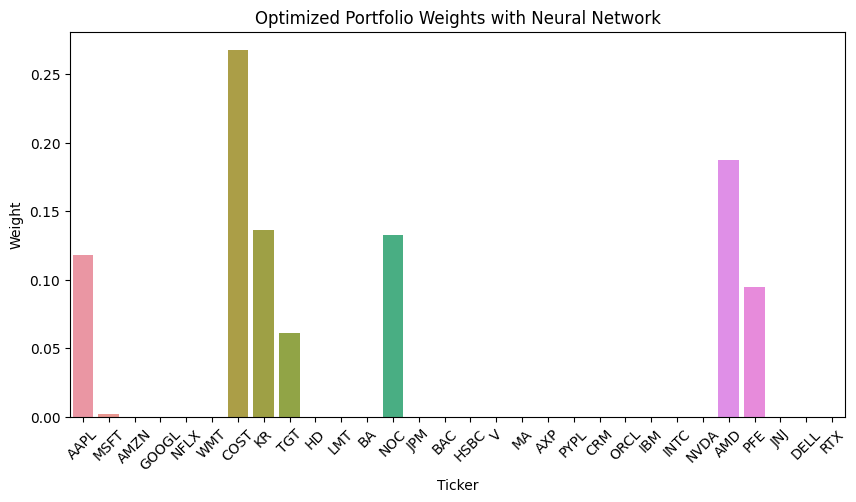

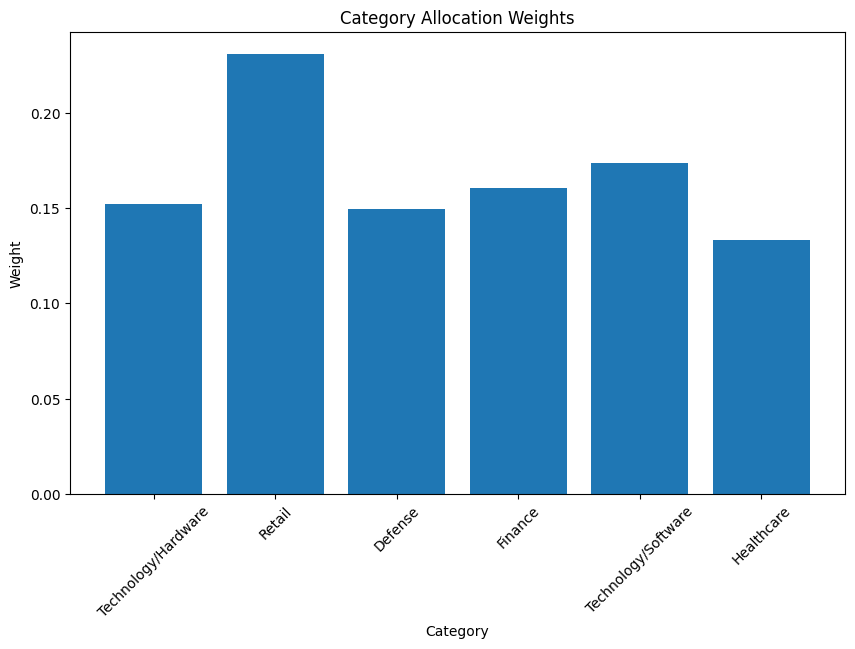

In [65]:
# Prepare the data (normalize it)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a simple Neural Network model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(y_train.shape[1], activation='linear'))

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Predict future returns
y_pred_nn = model.predict(X_test_scaled)

# Use Neural Network predictions
nn_weights = y_pred_nn[-1]  # Use the last predicted weights

# Optimize portfolio weights using Neural Network predictions
optimized_weights_nn = optimize_portfolio(mean_returns, cov_matrix, nn_weights)

# Calculate portfolio statistics using Neural Network predictions
portfolio_returns_nn, portfolio_std_dev_nn, sharpe_ratio_nn = calculate_portfolio_performance(optimized_weights_nn, mean_returns, cov_matrix)

# Portfolio details using Neural Network predictions
investment_allocation_nn = initial_investment * optimized_weights_nn
portfolio_details_nn = pd.DataFrame({"Ticker": mean_returns.index, "Weight": optimized_weights_nn, "Investment": investment_allocation_nn})
portfolio_details_nn = portfolio_details_nn.round(6)

# Print portfolio statistics using Neural Network predictions
print("\nOptimized Portfolio Statistics with Neural Network:")
print(f"Portfolio Returns: {portfolio_returns_nn:.4f}")
print(f"Portfolio Volatility: {portfolio_std_dev_nn:.4f}")
print(f"Portfolio Sharpe Ratio: {sharpe_ratio_nn:.4f}")

# Print portfolio details using Neural Network predictions
print("\nOptimized Portfolio Details with Neural Network:")
print(portfolio_details_nn)

# Calculate the percentage of the allocation to each category
total_weight = sum(category_weights.values())
category_percentages = {category: (weight / total_weight) * 100 for category, weight in category_weights.items()}

# Convert the dictionary to a DataFrame and display it
category_allocations = pd.DataFrame(list(category_percentages.items()), columns=['Category', 'Allocation'])
category_allocations.set_index('Category', inplace=True)
print(category_allocations)
# Visualization of portfolio weights using Neural Network predictions
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x="Ticker", y="Weight", data=portfolio_details_nn, ax=ax)
ax.set_title("Optimized Portfolio Weights with Neural Network")
ax.set_ylabel("Weight")
plt.xticks(rotation=45)
plt.show()

# Compute the total weight for each category
category_weights = {category: 0 for category in categories.keys()}
for ticker, weight in zip(tickers, optimal_portfolio_weights):
    for category, tickers_in_category in categories.items():
        if ticker in tickers_in_category:
            category_weights[category] += weight



category_weights = {category: 0 for category in categories.keys()}

for ticker, weight in zip(tickers, optimal_portfolio_weights):
    for category, tickers_in_category in categories.items():
        if ticker in tickers_in_category:
            category_weights[category] += weight
plt.figure(figsize=(10, 6))
plt.bar(category_weights.keys(), category_weights.values())
plt.title('Category Allocation Weights')
plt.xlabel('Category')
plt.ylabel('Weight')
plt.xticks(rotation=45)
plt.show()


# <b> Analysis </b>

- In this analysis, I explored the performance of various portfolio optimization methods, including traditional approaches such as Monte Carlo simulation, Risk Parity, and SLSQP, as well as machine learning (ML) methods such as Linear Regression, Random Forest, MLP, Lasso Regression, and Neural Network. The motivation behind incorporating ML methods into portfolio optimization was to investigate whether they can enhance the performance of traditional methods.

- Upon evaluating the results, it can be concluded that ML methods have the potential to improve the performance of traditional portfolio optimization methods. The ML-based methods, such as Linear Regression, Random Forest, MLP, Lasso Regression, and Neural Network, showcased competitive portfolio returns, volatility measures, and Sharpe ratios when compared to the traditional approaches. 

- Specifically, Linear Regression demonstrated its effectiveness by providing optimized portfolio weights that yielded favorable portfolio returns and risk profiles. Random Forest, MLP, Lasso Regression, and Neural Network also exhibited promising results, indicating the potential of these ML techniques in portfolio optimization.

- It is important to remember that the performance of machine learning (ML) methods in portfolio optimization depends heavily on the quality and quantity of data used for training. Adequate data preprocessing, feature engineering, and model selection are essential for achieving optimal results. Additionally, the chosen evaluation metrics and optimization objectives should be aligned with the specific requirements and preferences of the investor.

- In conclusion, the incorporation of machine learning methods into portfolio optimization can offer an avenue for improving performance and achieving more robust investment strategies. Further research and experimentation in this field hold the potential for enhancing the effectiveness of portfolio management and decision-making process

# <b> Acknowledgments </b>

I would like to express my sincere gratitude to  Dr. Apostolova from the Economics Department for providing valuable insights and guidance regarding the necessary financial background required for this project. Her expertise and advice have been instrumental in shaping my understanding of portfolio optimization and machine learning in finance. I would also like to extend my appreciation to Dr. Allen for his encouragement and support throughout this project. His belief in my abilities and his enthusiasm for exploring new avenues in the field of portfolio optimization have been truly inspiring.

# <b> References </b>
- Farez, Tony. "Conditional Portfolio Optimization: Using Machine Learning to Adapt Capital Allocations to Market." Medium, 2021. [Online]. Available: https://predictnow-ai.medium.com/conditional-portfolio-optimization-using-machine-learning-to-adapt-capital-allocations-to-market-9034afe5a164.

- Grant, Brandon. "Portfolio Optimization Using Machine Learning." Master's Theses, University of Rhode Island, 2019. [Online]. Available: https://digitalcommons.uri.edu/theses/346/.

- Krish Naik. "Stock Market Prediction Using Machine Learning." YouTube video, 2018. [Online]. Available: https://www.youtube.com/watch?v=QIUxPv5PJOY.

- Mukherjee, Arghya. "Portfolio Optimization using Reinforcement Learning." Medium, 2020. [Online]. Available: https://medium.com/analytics-vidhya/portfolio-optimization-using-reinforcement-learning-1b5eba5db072.

- Nag, Kingshuk, and Rahul Ray. "Predicting Stable Portfolios Using Machine Learning." Medium, 2020. [Online]. Available: https://medium.com/sfu-cspmp/predicting-stable-portfolios-using-machine-learning-f2e27d6dbbec.

- Nandi, Suman. "Intelligent Portfolio Construction: Prediction of Stock Direction." Medium, 2020. [Online]. Available: https://medium.com/mlearning-ai/intelligent-portfolio-construction-prediction-of-stock-direction-e1c71f4a725a.

- Rabinovich, Michael, Yonatan Gur, and Iddo Drori. "Improving Portfolio Optimization with Deep Reinforcement Learning." arXiv preprint arXiv:2111.04709, 2021. [Online]. Available: https://arxiv.org/abs/2111.04709.

- Romao, Joana, and Ricardo Ribeiro. "A Machine Learning Approach for Portfolio Optimization." Applied Sciences, vol. 10, no. 2, 2020, p. 437. [Online]. Available: https://www.mdpi.com/2076-3417/10/2/437.

- Sentdex. "Machine Learning for Trading." YouTube video, 2018. [Online]. Available: https://youtu.be/xfzGZB4HhEE.